In [267]:
# Import necessary libraries
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [268]:
# Define the list of stock tickers and date range
holdings = ["NVDA", "AAPL", "MSFT", "GOOGL", "AVGO", "AMZN", "TSLA", "META", "NFLX", "PLTR"]
start_date = "2015-01-01"
end_date = "2025-10-31"


In [269]:
# Function to calculate buy/sell trades and returns
def calculate_trades(data):
    """
    Calculate buy/sell trades based on the Position column.

    Args:
        data (DataFrame): DataFrame containing 'Position' and 'Close' columns.

    Returns:
        DataFrame: Trade details (Buy Date, Sell Date, Buy Price, Sell Price, Return %).
    """
    trades = []
    buy_date, buy_price = None, None

    for i in range(len(data)):
        if data['Position'].iloc[i] == 1 and buy_date is None:  # Buy signal
            buy_date = data.index[i]
            buy_price = data['Close'].iloc[i]
        elif data['Position'].iloc[i] == -1 and buy_date is not None:  # Sell signal
            sell_date = data.index[i]
            sell_price = data['Close'].iloc[i]
            return_cal = ((sell_price - buy_price) / buy_price) 
            trades.append({
                "Buy Date": buy_date.date().strftime("%d-%m-%Y"),
                "Sell Date": sell_date.date().strftime("%d-%m-%Y"),
                "Buy Price": buy_price,
                "Sell Price": sell_price,
                "Return": return_cal
            })
            buy_date, buy_price = None, None  # Reset after a trade
    return pd.DataFrame(trades)

In [270]:
#calculate moving averages and trades for each stock
all_trades = []
ma_dict = {}
data = yf.download(holdings, start=start_date, end=end_date, interval="1d", group_by="ticker")

for ticker in holdings:
    print(f"Processing {ticker}...")
    try:
        stock = data[ticker][['Close']].dropna().copy()
        stock['Short MA'] = stock['Close'].rolling(window=50, min_periods=1).mean()
        stock['Long MA'] = stock['Close'].rolling(window=200, min_periods=1).mean()
        stock['Position'] = 0
        stock.loc[stock.index[200:],'Position'] = np.where(stock['Short MA'][200:] > stock['Long MA'][200:], 1, -1)
                
        ma_dict[ticker] = stock[['Close', 'Short MA', 'Long MA']].copy()
        trades = calculate_trades(stock)
        if not trades.empty:
            trades['Ticker'] = ticker
            all_trades.append(trades)
    except KeyError as e:
        print(f"Error processing {ticker}: {e}")
        continue

all_trades_df = pd.concat(all_trades, ignore_index=True)
if not all_trades_df.empty:
    columns = ['Ticker'] + [col for col in all_trades_df.columns if col != 'Ticker']
    all_trades_df = all_trades_df[columns]



C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3103662409.py:4: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(holdings, start=start_date, end=end_date, interval="1d", group_by="ticker")
[*********************100%***********************]  10 of 10 completed


Processing NVDA...
Processing AAPL...
Processing MSFT...
Processing GOOGL...
Processing AVGO...
Processing AMZN...
Processing TSLA...
Processing META...
Processing NFLX...
Processing PLTR...


In [271]:
#Ensure "Sell Date" is datetime and extract year
all_trades_df['Sell Date'] = pd.to_datetime(all_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
all_trades_df['Buy Date'] = pd.to_datetime(all_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
all_trades_df['Year'] = all_trades_df['Sell Date'].dt.year

In [272]:
#define metrics calculation function
def calculate_metrics(trades_df, risk_free_rate=0.02):
    """
    Calculate performance, risk, and risk-adjusted metrics for a single ticker.

    Args:
        trades_df (DataFrame): Trade details for the ticker.
        ticker (str): Stock ticker symbol.
        risk_free_rate (float): Annual risk-free rate (default is 2%).

    Returns:
        dict: All calculated metrics for the ticker.
    """
    if trades_df.empty:
        return pd.DataFrame([{
            "Ticker": trades_df['Ticker'].iloc[0] if not trades_df.empty else np.nan,
            "Year" : trades_df['Year'].iloc[0] if not trades_df.empty else np.nan,
            "CAGR": np.nan,
            "Total Return": np.nan,
            "Standard Return": np.nan,
            "Cumulative Return": np.nan,
            "Volatility": np.nan,
            "Max Drawdown": np.nan,
            "Sharpe Ratio": np.nan,
            "Win Rate (%)": np.nan,
            "Profit Factor": np.nan
        }])

    trades_df = trades_df.copy()
    #trades_df['Buy Date'] = pd.to_datetime(trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
    #trades_df['Sell Date'] = pd.to_datetime(trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
    trades_df['Daily Return'] = trades_df['Return']  # <-- Fix is here

    total_return = (trades_df['Sell Price'].sum() - trades_df['Buy Price'].sum()) / trades_df['Buy Price'].sum()
    start_date = trades_df['Buy Date'].min()
    end_date = trades_df['Sell Date'].max()
    total_years = (end_date - start_date).days / 365.25 if (end_date - start_date).days > 0 else 1
    cagr = (1 + total_return) ** (1 / total_years) - 1 if total_years > 0 else np.nan
    

    standard_return = trades_df['Return'] + 1
    cumulative_return = standard_return.cumprod() - 1
    
    # Only store the final value for each
    final_standard_return = standard_return.iloc[-1] if not standard_return.empty else np.nan
    final_cumulative_return = cumulative_return.iloc[-1] if not cumulative_return.empty else np.nan

    daily_volatility = trades_df['Daily Return'].std()
    annualized_volatility = daily_volatility * np.sqrt(252)

    rolling_max = cumulative_return.cummax()
    drawdown = (cumulative_return - rolling_max) / rolling_max.replace(0, np.nan)
    max_drawdown = drawdown.min()

    sharpe_ratio = (cagr - risk_free_rate) / annualized_volatility if annualized_volatility != 0 else np.nan
    win_rate = (trades_df['Return'] > 0).mean() * 100
    gross_profit = trades_df.loc[trades_df['Return'] > 0, 'Return'].sum()
    gross_loss = -trades_df.loc[trades_df['Return'] < 0, 'Return'].sum()
    profit_factor = gross_profit / gross_loss if gross_loss != 0 else np.nan

    return pd.DataFrame([{
        "Ticker": trades_df['Ticker'].iloc[0],
        "Year": trades_df['Year'].iloc[0],
        "CAGR": cagr,
        "Total Return": total_return,
        "Standard Return": final_standard_return,
        "Cumulative Return": final_cumulative_return,
        "Volatility": annualized_volatility,
        "Max Drawdown": max_drawdown,
        "Sharpe Ratio": sharpe_ratio,
        "Win Rate (%)": win_rate,
        "Profit Factor": profit_factor
    }])

#group by ticker and year to calculate annual metrics for each group
metrics_by_year = all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)

#Calculate overall metrics for each ticker
metrics_rows = []
for ticker in holdings:
    ticker_trades = all_trades_df[all_trades_df['Ticker'] == ticker]
    metrics_row = calculate_metrics(ticker_trades)
    metrics_rows.append(metrics_row)
metrics_df = pd.concat(metrics_rows, ignore_index=True)

# 9. Display or plot results as needed
print(metrics_by_year.head())
print(metrics_df.head())


  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2018  0.183081      0.474070         1.474070           0.474070   
1   AAPL  2022  0.107121      0.416606         0.929164           1.665660   
2   AAPL  2024  0.104136      0.101967         1.101967           0.101967   
3   AAPL  2025 -0.180798     -0.150159         0.849841          -0.150159   
4   AMZN  2016  0.026797      0.011725         1.011725           0.011725   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0         NaN      0.000000           NaN         100.0            NaN  
1   21.773275     -0.108739      0.004001          50.0      26.383078  
2         NaN      0.000000           NaN         100.0            NaN  
3         NaN     -0.000000           NaN           0.0       0.000000  
4         NaN      0.000000           NaN         100.0            NaN  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2018 

C:\Users\satya\AppData\Local\Temp\ipykernel_29152\2992049271.py:76: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_by_year = all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [273]:
metrics_df

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,NVDA,2018,0.209365,4.991579,6.157649,225.385696,18.028968,0.000000,0.010503,100.000000,NaN
1,AAPL,2018,0.014511,0.131937,0.849841,2.679839,13.201292,-0.195252,-0.000416,60.000000,11.063192
2,MSFT,2016,0.034555,0.374246,0.892072,7.168778,11.925708,-0.121159,0.001220,80.000000,31.311540
3,GOOGL,2016,0.028785,0.308326,1.379298,2.371470,5.355895,-0.129623,0.001640,66.666667,31.066753
4,AVGO,2018,0.079792,1.055032,3.546436,6.028021,16.637218,-0.805451,0.003594,50.000000,9.887175
5,AMZN,2016,0.022364,0.234054,1.441845,3.636805,10.865702,-0.258233,0.000218,66.666667,9.486679
6,TSLA,2015,0.012124,0.125299,1.026637,5.309519,45.019993,-4.171170,-0.000175,36.363636,11.892007
7,META,2017,0.045679,0.531766,3.380955,4.986045,14.923470,-0.597042,0.001721,66.666667,14.260762
8,NFLX,2016,0.012310,0.080055,0.783133,1.043386,12.397518,-0.351631,-0.000620,40.000000,3.803592
9,PLTR,2021,-0.185847,-0.074221,0.799831,-0.148555,2.971246,-3.302063,-0.069280,50.000000,0.322384


In [274]:
metrics_by_year.sort_values(by=['Ticker', 'Year'], inplace=True)
metrics_by_year.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2018,0.183081,0.474070,1.474070,0.474070,NaN,0.000000,NaN,100.0,NaN
1,AAPL,2022,0.107121,0.416606,0.929164,1.665660,21.773275,-0.108739,0.004001,50.0,26.383078
2,AAPL,2024,0.104136,0.101967,1.101967,0.101967,NaN,0.000000,NaN,100.0,NaN
3,AAPL,2025,-0.180798,-0.150159,0.849841,-0.150159,NaN,-0.000000,NaN,0.0,0.000000
4,AMZN,2016,0.026797,0.011725,1.011725,0.011725,NaN,0.000000,NaN,100.0,NaN


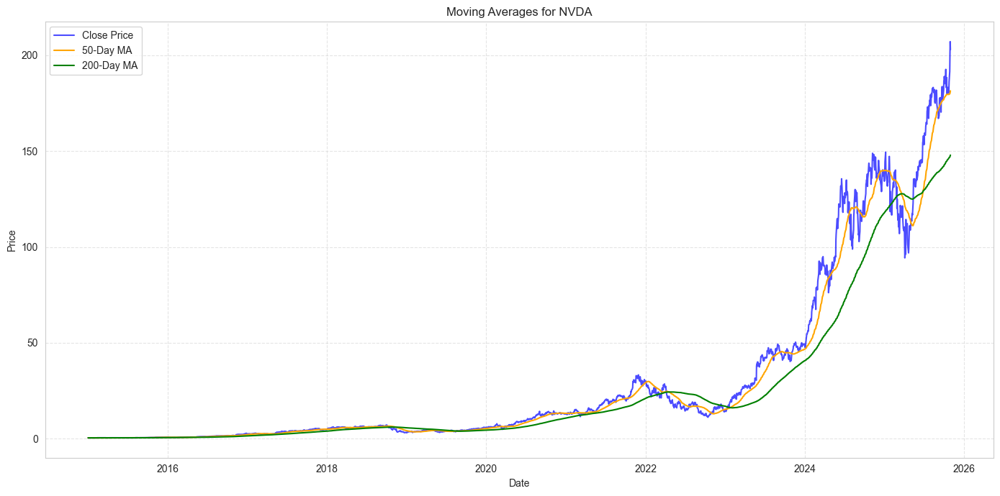

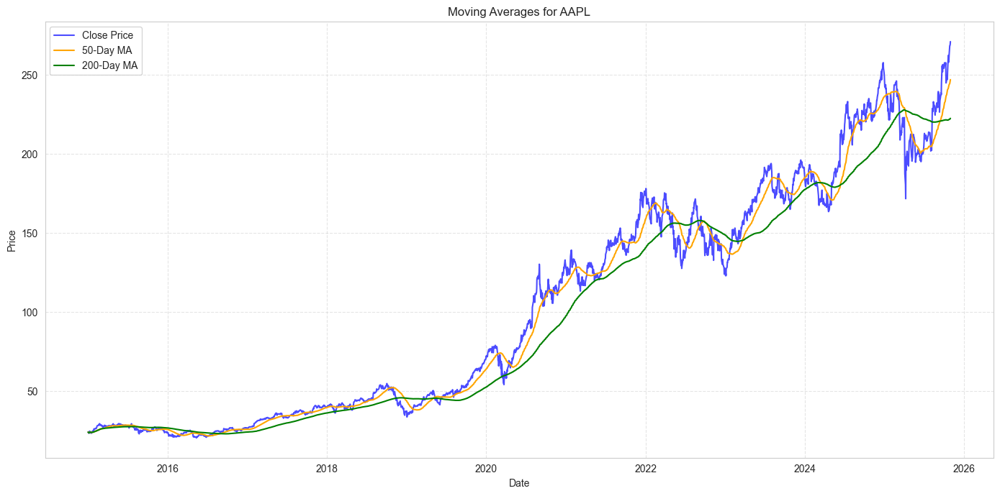

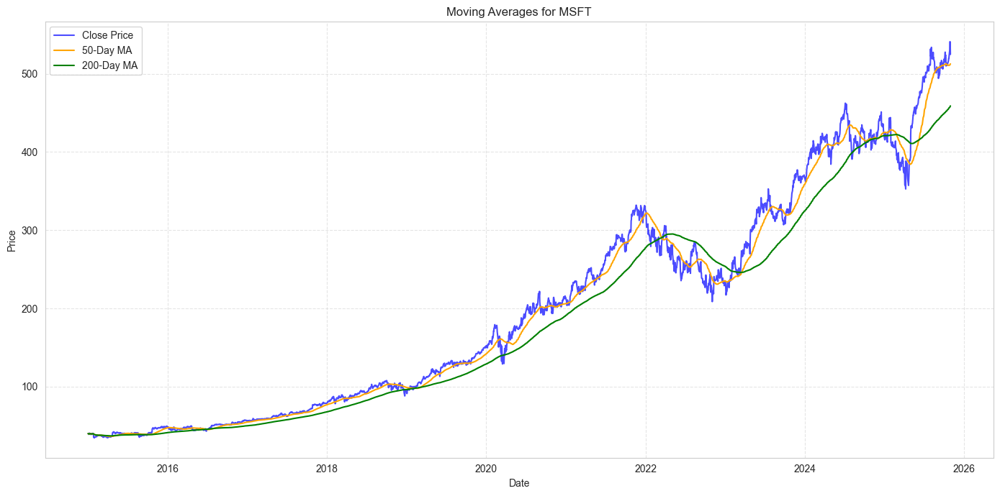

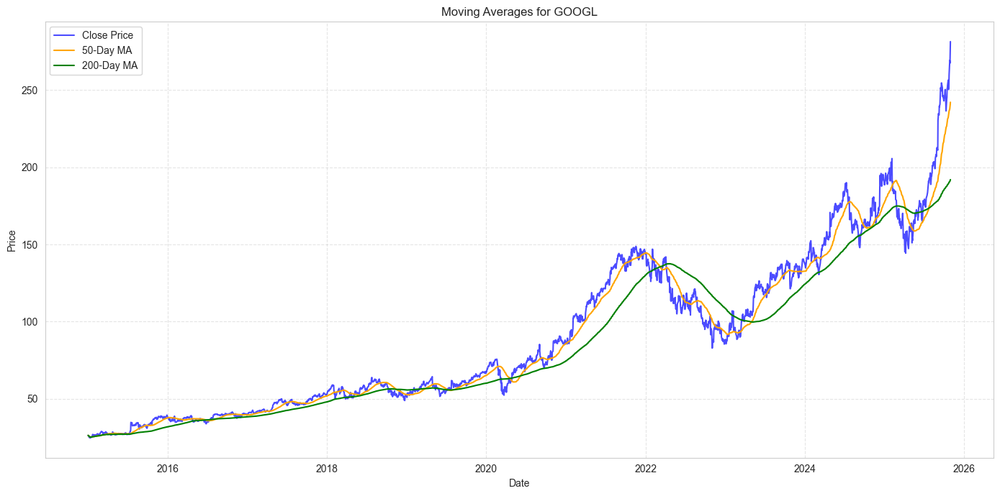

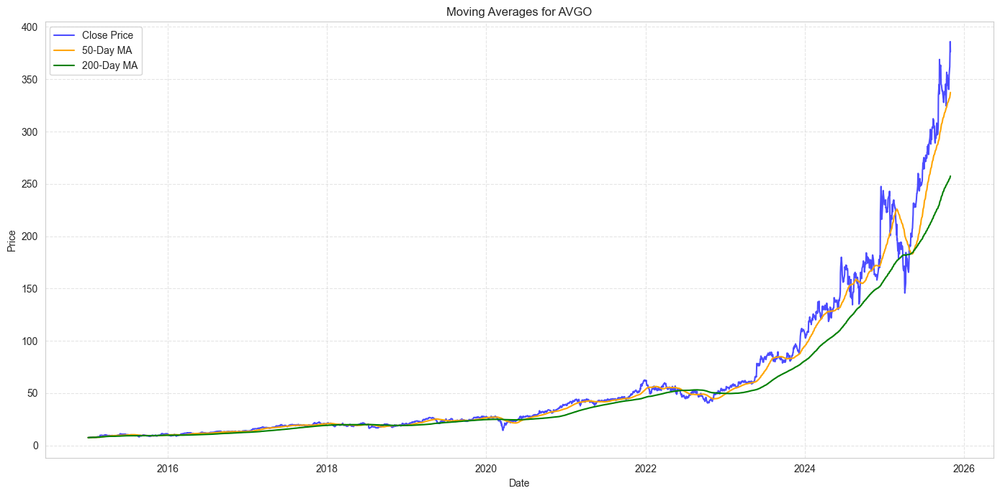

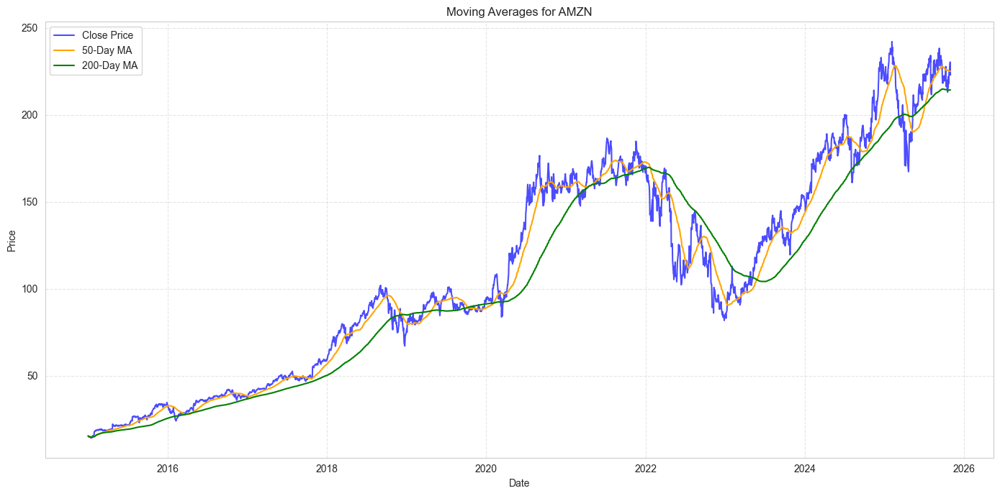

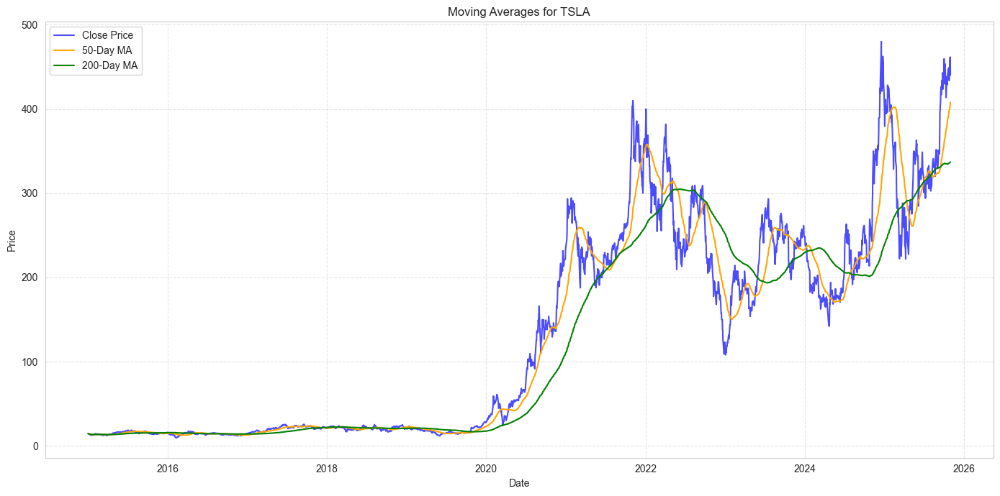

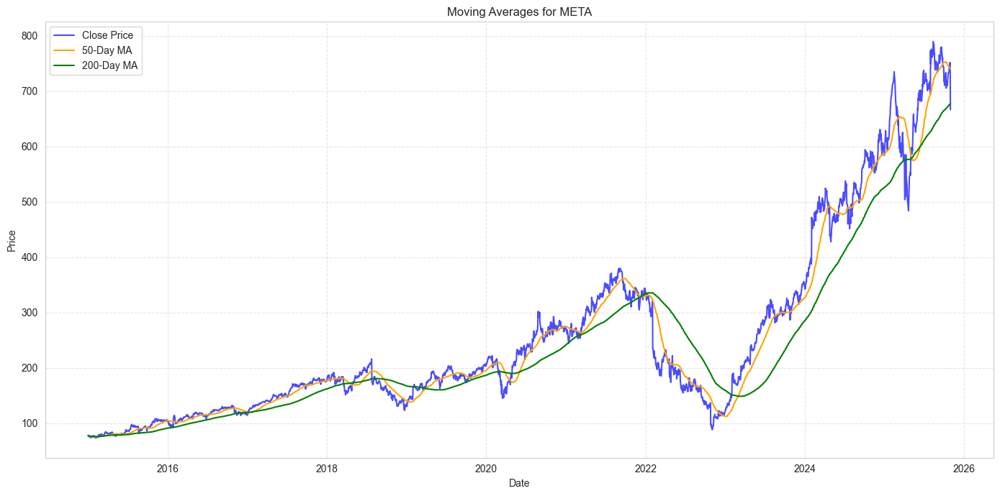

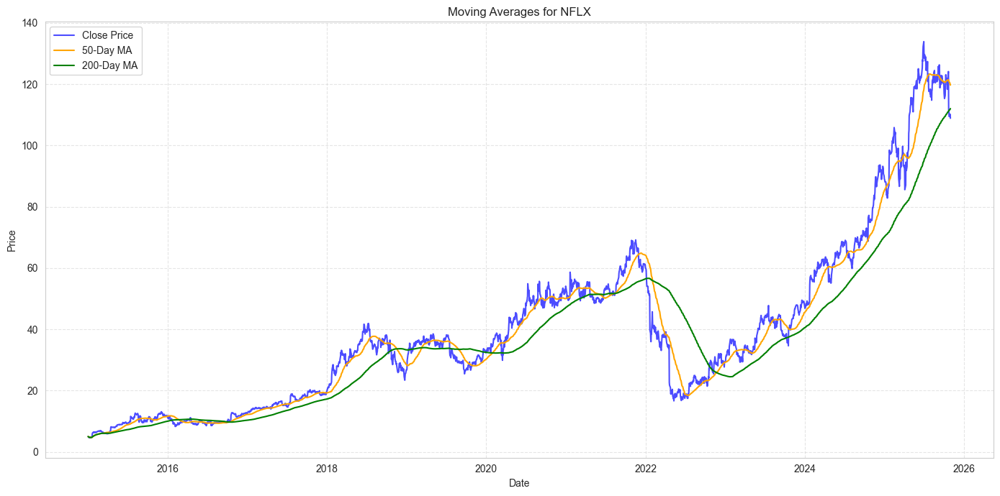

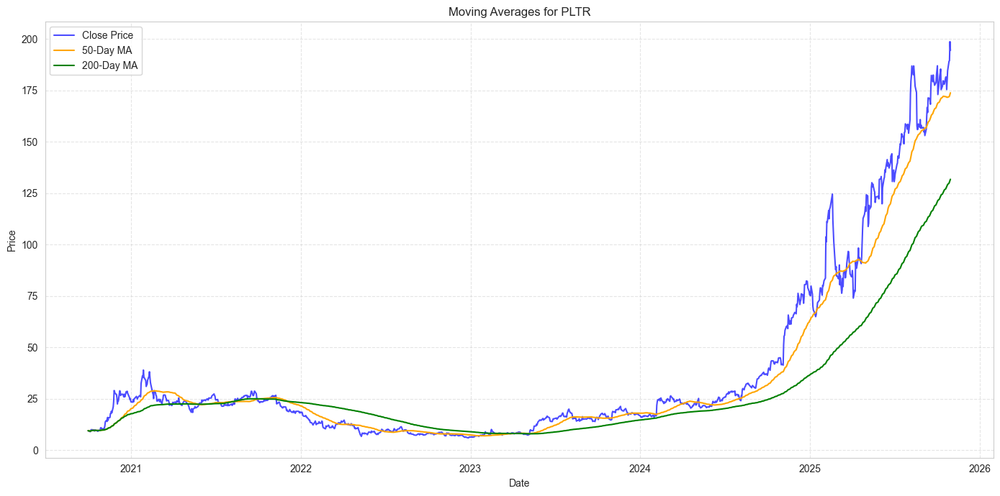

In [275]:

for ticker in ma_dict:
    stock = ma_dict[ticker].copy()
    plt.figure(figsize=(14, 7))
    sns.set_style("whitegrid")
    plt.plot(stock.index, stock['Close'], label='Close Price', color='blue', alpha=0.7)
    plt.plot(stock.index, stock['Short MA'], label='50-Day MA', color='orange')
    plt.plot(stock.index, stock['Long MA'], label='200-Day MA', color='green')
    
    plt.title(f"Moving Averages for {ticker}")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


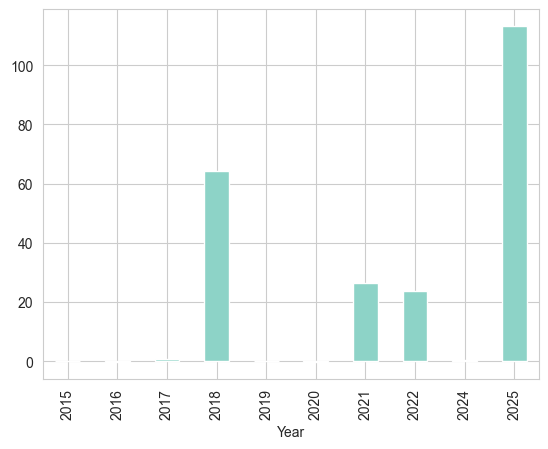

In [276]:
# Extract year from date for annual grouping
metrics_by_year['Year'] = metrics_by_year['Year']
annual_return = metrics_by_year.groupby(by='Year')['Standard Return'].prod()-1
# Plot annual returns as a bar char
annual_return.plot(kind='bar')
plt.show()

In [277]:
metrics_by_year.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2018,0.183081,0.474070,1.474070,0.474070,NaN,0.000000,NaN,100.0,NaN
1,AAPL,2022,0.107121,0.416606,0.929164,1.665660,21.773275,-0.108739,0.004001,50.0,26.383078
2,AAPL,2024,0.104136,0.101967,1.101967,0.101967,NaN,0.000000,NaN,100.0,NaN
3,AAPL,2025,-0.180798,-0.150159,0.849841,-0.150159,NaN,-0.000000,NaN,0.0,0.000000
4,AMZN,2016,0.026797,0.011725,1.011725,0.011725,NaN,0.000000,NaN,100.0,NaN


In [278]:
pivot_table = metrics_by_year.pivot(index='Ticker', columns='Year', values='Total Return')

pivot_table

Year,2015,2016,2017,2018,2019,2020,2021,2022,2024,2025
Ticker,,,,,,,,,,
AAPL,NaN,NaN,NaN,0.474070,NaN,NaN,NaN,0.416606,0.101967,-0.150159
AMZN,NaN,0.011725,NaN,1.636355,-0.095671,NaN,0.653051,-0.193469,NaN,0.441845
AVGO,NaN,NaN,NaN,0.077713,NaN,-0.171155,NaN,0.708712,NaN,2.546436
GOOGL,NaN,-0.021073,NaN,0.336824,-0.030572,0.045565,NaN,0.842767,NaN,0.379298
META,NaN,NaN,0.253275,0.025192,NaN,-0.096520,0.432699,NaN,NaN,2.380955
MSFT,NaN,0.060085,NaN,NaN,0.990403,NaN,NaN,1.751794,0.577101,-0.107928
NFLX,NaN,-0.123611,NaN,1.618794,-0.192243,NaN,0.407460,-0.216867,NaN,NaN
NVDA,NaN,NaN,NaN,6.304555,NaN,NaN,NaN,4.033155,NaN,5.157649
PLTR,NaN,NaN,NaN,NaN,NaN,NaN,-0.074221,NaN,NaN,NaN


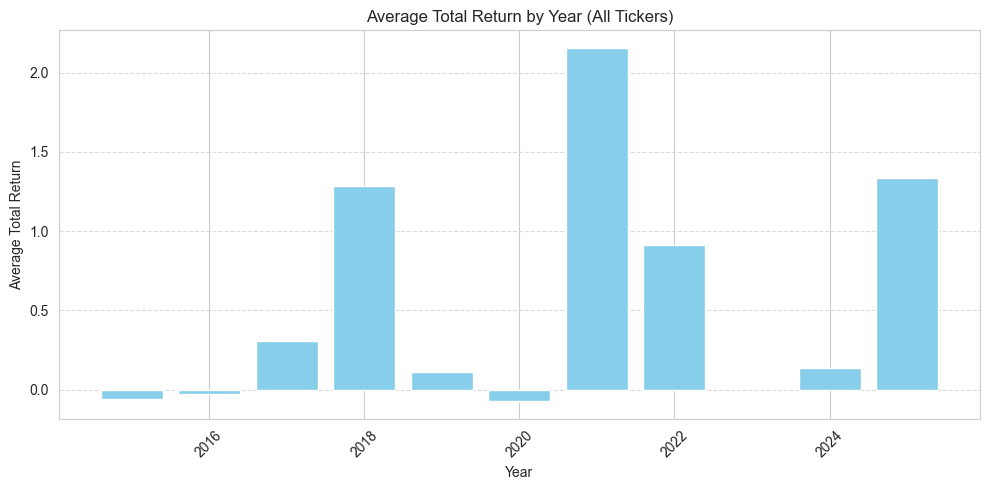

In [279]:
# Bar plot: Total Return by Year (all tickers combined, mean)
total_return_by_year = metrics_by_year.groupby('Year')['Total Return'].mean()

plt.figure(figsize=(10, 5))
plt.bar(total_return_by_year.index, total_return_by_year.values, color='skyblue')
plt.ylabel('Average Total Return')
plt.xlabel('Year')
plt.title('Average Total Return by Year (All Tickers)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

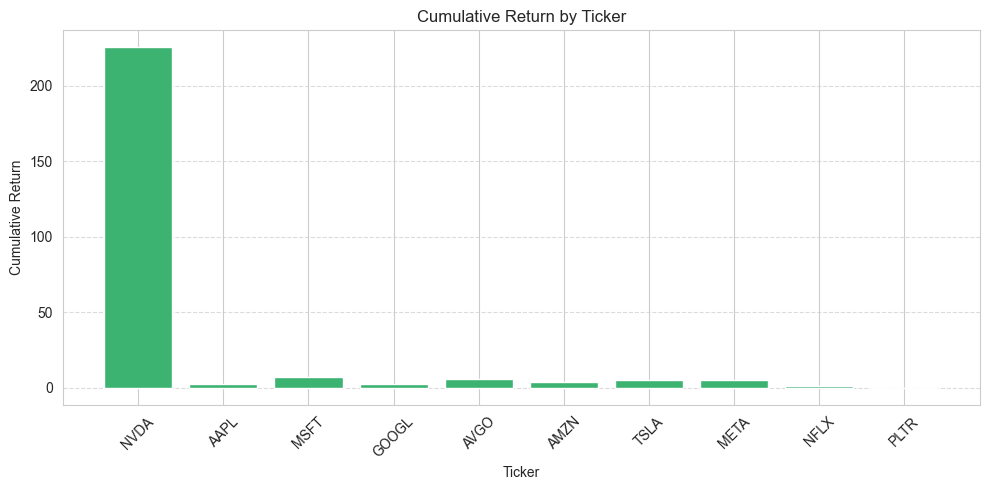

In [280]:
# Bar plot: Cumulative Return by Ticker (overall, not by year)
plt.figure(figsize=(10, 5))
plt.bar(metrics_df['Ticker'], metrics_df['Cumulative Return'], color='mediumseagreen')
plt.ylabel('Cumulative Return')
plt.xlabel('Ticker')
plt.title('Cumulative Return by Ticker')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

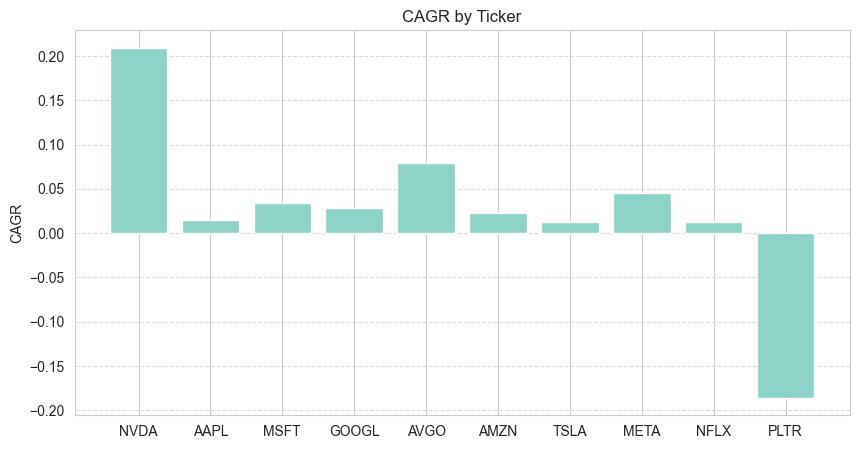

In [281]:
# Plot CAGR for each ticker
plt.figure(figsize=(10, 5))
plt.bar(metrics_df['Ticker'], metrics_df['CAGR'])
plt.ylabel('CAGR')
plt.title('CAGR by Ticker')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

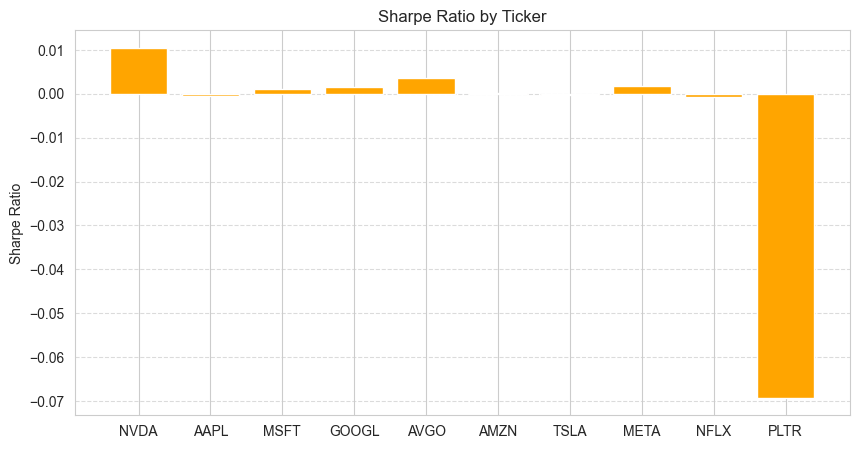

In [282]:

# Plot Sharpe Ratio for each ticker
plt.figure(figsize=(10, 5))
plt.bar(metrics_df['Ticker'], metrics_df['Sharpe Ratio'], color='orange')
plt.ylabel('Sharpe Ratio')
plt.title('Sharpe Ratio by Ticker')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

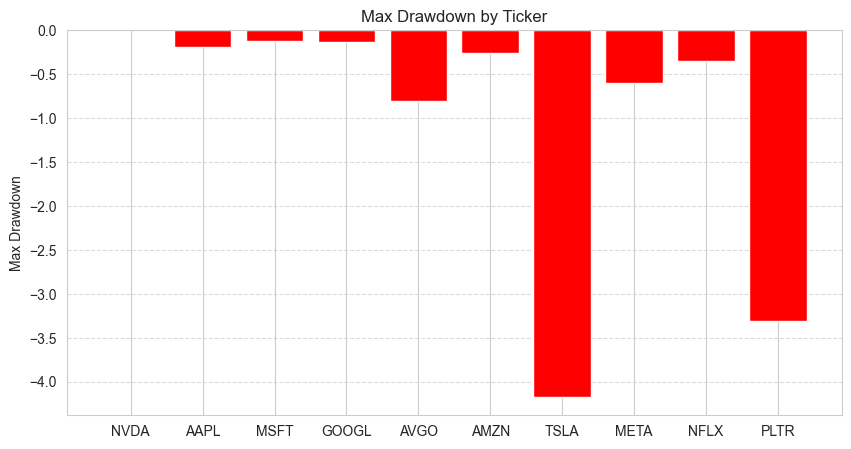

In [ ]:
# Plot Max Drawdown for each ticker
plt.figure(figsize=(10, 5))
plt.bar(metrics_df['Ticker'], metrics_df['Max Drawdown'], color='red')
plt.ylabel('Max Drawdown')
plt.title('Max Drawdown by Ticker')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [284]:
tik = yf.Ticker("0P000071W5.TO") # Fund ticker - TD Canadian Balanced Fund
fund_data = tik.history(start="2015-01-01", end="2025-10-31", interval="1d")
fund_data.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Capital Gains
Date,,,,,,,,
2018-01-02 00:00:00-05:00,15.999253,15.999253,15.999253,15.999253,0,0.0,0.0,0.0
2018-01-03 00:00:00-05:00,16.158867,16.158867,16.158867,16.158867,0,0.0,0.0,0.0
2018-01-04 00:00:00-05:00,16.177647,16.177647,16.177647,16.177647,0,0.0,0.0,0.0
2018-01-05 00:00:00-05:00,16.337265,16.337265,16.337265,16.337265,0,0.0,0.0,0.0
2018-01-08 00:00:00-05:00,16.393599,16.393599,16.393599,16.393599,0,0.0,0.0,0.0


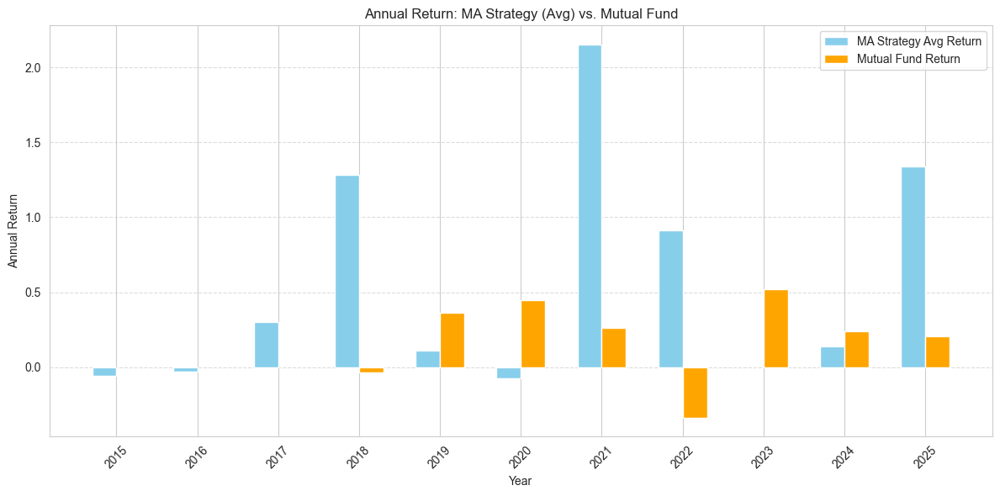

In [285]:
# 1. Calculate average annual return for your MA strategy
ma_annual_return = metrics_by_year.groupby('Year')['Total Return'].mean()

# 2. Calculate annual return for the mutual fund
fund_data['Fund Return'] = fund_data['Close'].pct_change()
fund_data = fund_data.dropna(subset=['Fund Return'])
fund_data['Year'] = fund_data.index.year
fund_annual_return = fund_data.groupby('Year')['Fund Return'].apply(lambda x: (1 + x).prod() - 1)

# 3. Plot comparison
plt.figure(figsize=(12, 6))
plt.bar(ma_annual_return.index - 0.15, ma_annual_return.values, width=0.3, label='MA Strategy Avg Return', color='skyblue')
plt.bar(fund_annual_return.index + 0.15, fund_annual_return.values, width=0.3, label='Mutual Fund Return', color='orange')
plt.xlabel('Year')
plt.ylabel('Annual Return')
plt.title('Annual Return: MA Strategy (Avg) vs. Mutual Fund')
plt.legend()
plt.xticks(sorted(set(ma_annual_return.index) | set(fund_annual_return.index)), rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [286]:
# --- Summary Table: MA Strategy (Avg) vs. Mutual Fund ---

# 1. MA Strategy (average across tickers)
ma_summary = pd.DataFrame({
    'Strategy': ['MA Strategy (Avg)'],
    'CAGR': [metrics_df['CAGR'].mean()],
    'Total Return': [metrics_df['Total Return'].mean()],
    'Volatility': [metrics_df['Volatility'].mean()],
    'Max Drawdown': [metrics_df['Max Drawdown'].mean()],
    'Sharpe Ratio': [metrics_df['Sharpe Ratio'].mean()],
    'Win Rate (%)': [metrics_df['Win Rate (%)'].mean()],
    'Profit Factor': [metrics_df['Profit Factor'].mean()]
})

# 2. Mutual Fund (using fund_data)
fund_data['Fund Return'] = fund_data['Close'].pct_change()
fund_data = fund_data.dropna(subset=['Fund Return'])
fund_cum_return = (1 + fund_data['Fund Return']).prod() - 1
fund_years = (fund_data.index[-1] - fund_data.index[0]).days / 365.25
fund_cagr = (1 + fund_cum_return) ** (1 / fund_years) - 1 if fund_years > 0 else np.nan
fund_volatility = fund_data['Fund Return'].std() * np.sqrt(252)
fund_rolling = (1 + fund_data['Fund Return']).cumprod() - 1
fund_drawdown = (fund_rolling - fund_rolling.cummax()) / fund_rolling.cummax().replace(0, np.nan)
fund_max_drawdown = fund_drawdown.min()
fund_sharpe = (fund_cagr - 0.02) / fund_volatility if fund_volatility != 0 else np.nan

fund_win_rate = (fund_data['Fund Return'] > 0).mean() * 100
fund_gross_profit = fund_data.loc[fund_data['Fund Return'] > 0, 'Fund Return'].sum()
fund_gross_loss = -fund_data.loc[fund_data['Fund Return'] < 0, 'Fund Return'].sum()
fund_profit_factor = fund_gross_profit / fund_gross_loss if fund_gross_loss != 0 else np.nan

fund_summary = pd.DataFrame({
    'Strategy': ['Mutual Fund'],
    'CAGR': [fund_cagr],
    'Total Return': [fund_cum_return],
    'Volatility': [fund_volatility],
    'Max Drawdown': [fund_max_drawdown],
    'Sharpe Ratio': [fund_sharpe],
    'Win Rate (%)': [fund_win_rate],
    'Profit Factor': [fund_profit_factor]
})

# 3. Combine and display
summary_table = pd.concat([ma_summary, fund_summary], ignore_index=True)
summary_table.set_index('Strategy', inplace=True)
display(summary_table)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
MA Strategy (Avg),0.027364,0.775807,15.132701,-0.993162,-0.005159,61.636364,13.677120
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


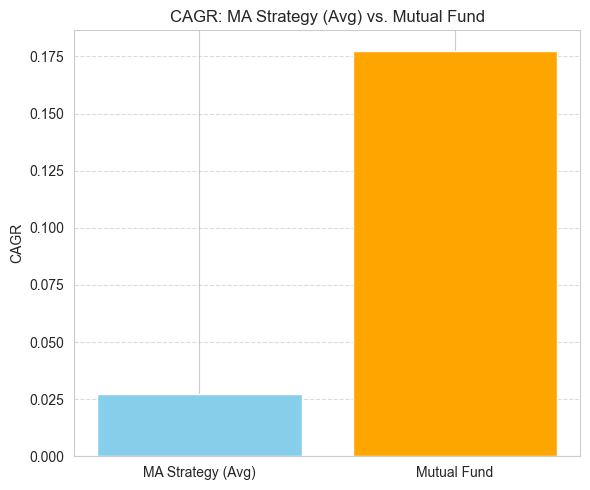

In [287]:
# Plot CAGR for MA Strategy (Avg) vs Mutual Fund
summary_table_plot = summary_table.reset_index()
plt.figure(figsize=(6, 5))

strategies = summary_table_plot['Strategy']
cagr_values = summary_table_plot['CAGR']

plt.bar(strategies, cagr_values, color=['skyblue', 'orange'])
plt.ylabel('CAGR')
plt.title('CAGR: MA Strategy (Avg) vs. Mutual Fund')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#### Breakout Strategy

In [288]:
breakout_trades = []
breakout_dict = {}

for ticker in holdings:
    print(f"Processing {ticker} for breakout strategy...")
    try:
        stock_bo = data[ticker][['Close']].dropna().copy()
        # Calculate the 20-day high and low
        stock_bo['20 Day High'] = stock_bo['Close'].rolling(window=20, min_periods=1).max()
        stock_bo['20 Day Low'] = stock_bo['Close'].rolling(window=20, min_periods=1).min()
        stock_bo['Position'] = 0
        stock_bo['Position'] = np.where(stock_bo['Close'] > stock_bo['20 Day High'].shift(1), 1,
                                       np.where(stock_bo['Close'] < stock_bo['20 Day Low'].shift(1), -1, 0))
        # Entry/exit marker logic
        stock_bo['Hold_Position'] = 0
        current = 0
        for idx, row in stock_bo.iterrows():
            if row['Position'] == 1:
                current = 1
            elif row['Position'] == -1:
                current = -1
            stock_bo.at[idx, 'Hold_Position'] = current
        stock_bo['Prev_Hold'] = stock_bo['Hold_Position'].shift(1).fillna(0)
        stock_bo['Pos_Marker'] = 0
        stock_bo.loc[(stock_bo['Prev_Hold'] != 1) & (stock_bo['Hold_Position'] == 1), 'Pos_Marker'] = 1
        stock_bo.loc[(stock_bo['Prev_Hold'] == 1) & (stock_bo['Hold_Position'] != 1), 'Pos_Marker'] = -1

        breakout_dict[ticker] = stock_bo[['Close', '20 Day High', '20 Day Low', 'Position', 'Hold_Position', 'Pos_Marker']].copy()
        trades_bo = calculate_trades(pd.DataFrame({'Close': stock_bo['Close'], 'Position': stock_bo['Pos_Marker']}, index=stock_bo.index))
        if not trades_bo.empty:
            trades_bo['Ticker'] = ticker
            breakout_trades.append(trades_bo)
    except KeyError as e:
        print(f"Error processing {ticker} for breakout strategy: {e}")
        continue

breakout_trades_df = pd.concat(breakout_trades, ignore_index=True)
if not breakout_trades_df.empty:
    columns = ['Ticker'] + [col for col in breakout_trades_df.columns if col != 'Ticker']
    breakout_trades_df = breakout_trades_df[columns]

Processing NVDA for breakout strategy...
Processing AAPL for breakout strategy...
Processing MSFT for breakout strategy...
Processing GOOGL for breakout strategy...
Processing AVGO for breakout strategy...
Processing AMZN for breakout strategy...
Processing TSLA for breakout strategy...
Processing META for breakout strategy...
Processing NFLX for breakout strategy...
Processing PLTR for breakout strategy...


In [289]:
#Ensure "Sell Date" is datetime and extract year
breakout_trades_df['Sell Date'] = pd.to_datetime(breakout_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
breakout_trades_df['Buy Date'] = pd.to_datetime(breakout_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
breakout_trades_df['Year'] = breakout_trades_df['Sell Date'].dt.year

In [290]:
#group by ticker and year to calculate annual metrics for breakout strategy
metrics_bo = breakout_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)

#calculate overall metrics for each ticker for breakout strategy
metrics_rows_bo = []
for ticker in holdings:
    ticker_trades_bo = breakout_trades_df[breakout_trades_df['Ticker'] == ticker]
    metrics_row_bo = calculate_metrics(ticker_trades_bo)
    metrics_rows_bo.append(metrics_row_bo)
metrics_df_bo = pd.concat(metrics_rows_bo, ignore_index=True)

# 9. Display or plot results as needed
print(metrics_bo.head())
print(metrics_df_bo.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2015 -0.011010     -0.010283         0.960718          -0.043312   
1   AAPL  2016  0.025598      0.017099         0.997495           0.068900   
2   AAPL  2017  0.135567      0.134678         1.060905           0.507386   
3   AAPL  2018 -0.002195     -0.001779         1.136569          -0.034963   
4   AAPL  2019  0.180435      0.088639         0.992454           0.193878   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0    1.587850     -1.538229     -0.019530          25.0       0.825346  
1    0.835263     -1.047859      0.006702          50.0       2.489066  
2    2.560874      0.000000      0.045128         100.0            NaN  
3    1.371613     -0.000000     -0.016182          40.0       0.877086  
4    2.362860     -0.044725      0.067899          50.0      26.896967  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015 

C:\Users\satya\AppData\Local\Temp\ipykernel_29152\2535327480.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_bo = breakout_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [291]:
metrics_bo.sort_values(by=['Ticker', 'Year'], inplace=True)
metrics_bo.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,-0.011010,-0.010283,0.960718,-0.043312,1.587850,-1.538229,-0.019530,25.0,0.825346
1,AAPL,2016,0.025598,0.017099,0.997495,0.068900,0.835263,-1.047859,0.006702,50.0,2.489066
2,AAPL,2017,0.135567,0.134678,1.060905,0.507386,2.560874,0.000000,0.045128,100.0,NaN
3,AAPL,2018,-0.002195,-0.001779,1.136569,-0.034963,1.371613,-0.000000,-0.016182,40.0,0.877086
4,AAPL,2019,0.180435,0.088639,0.992454,0.193878,2.362860,-0.044725,0.067899,50.0,26.896967


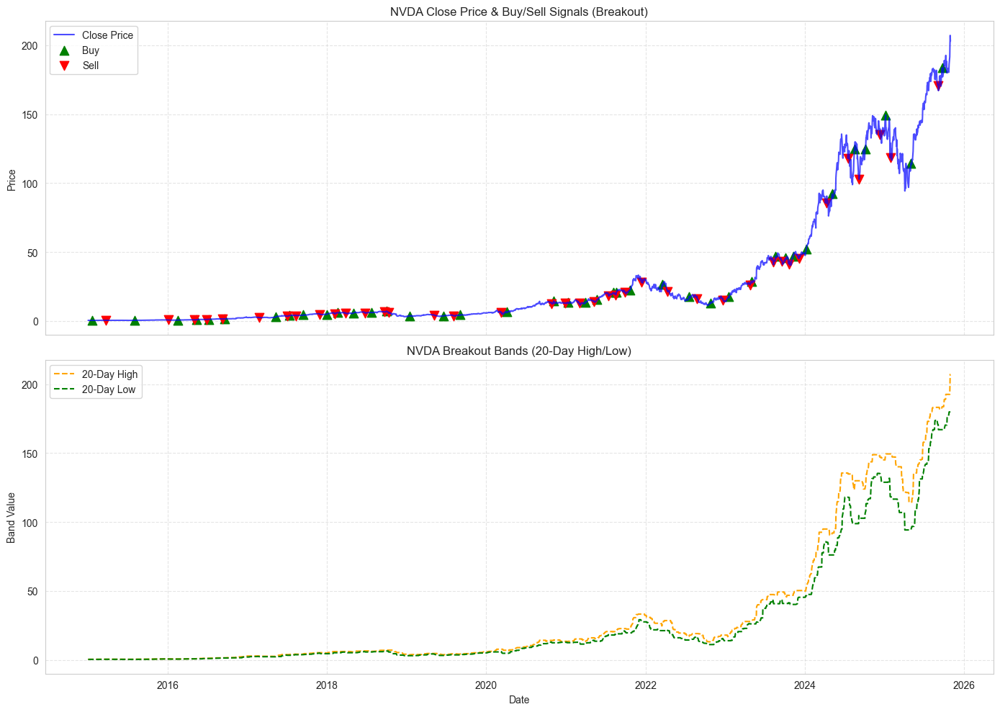

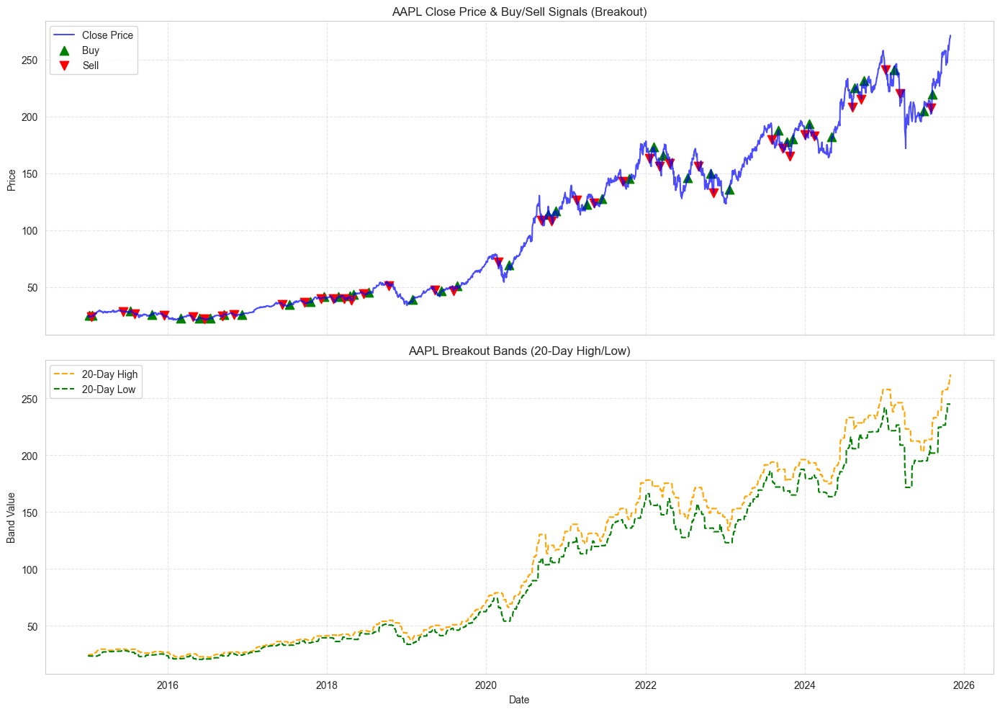

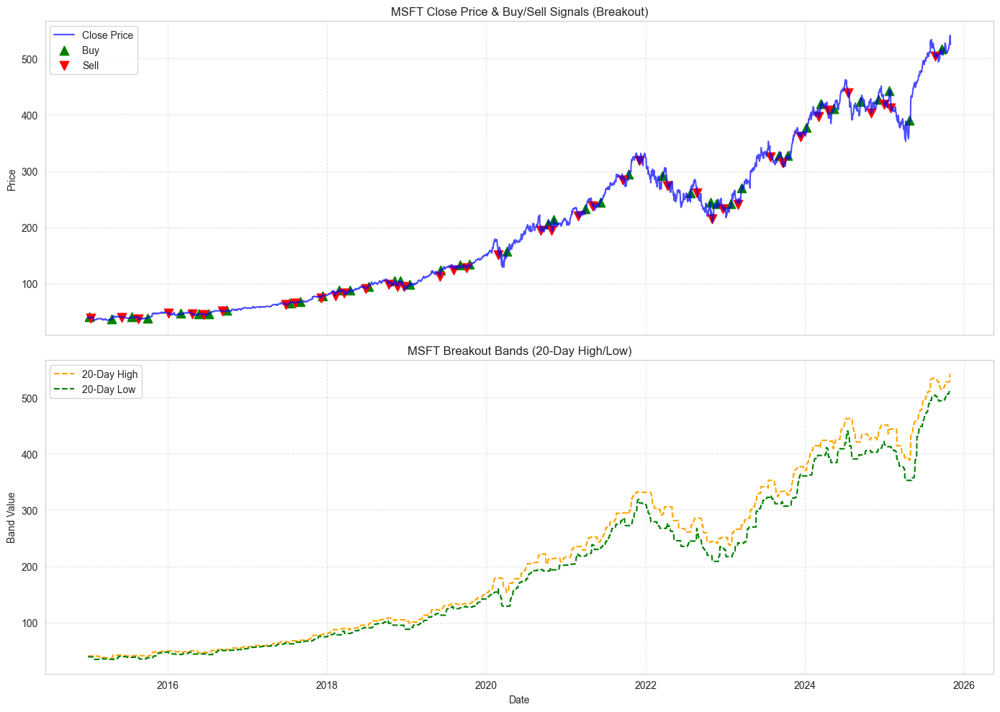

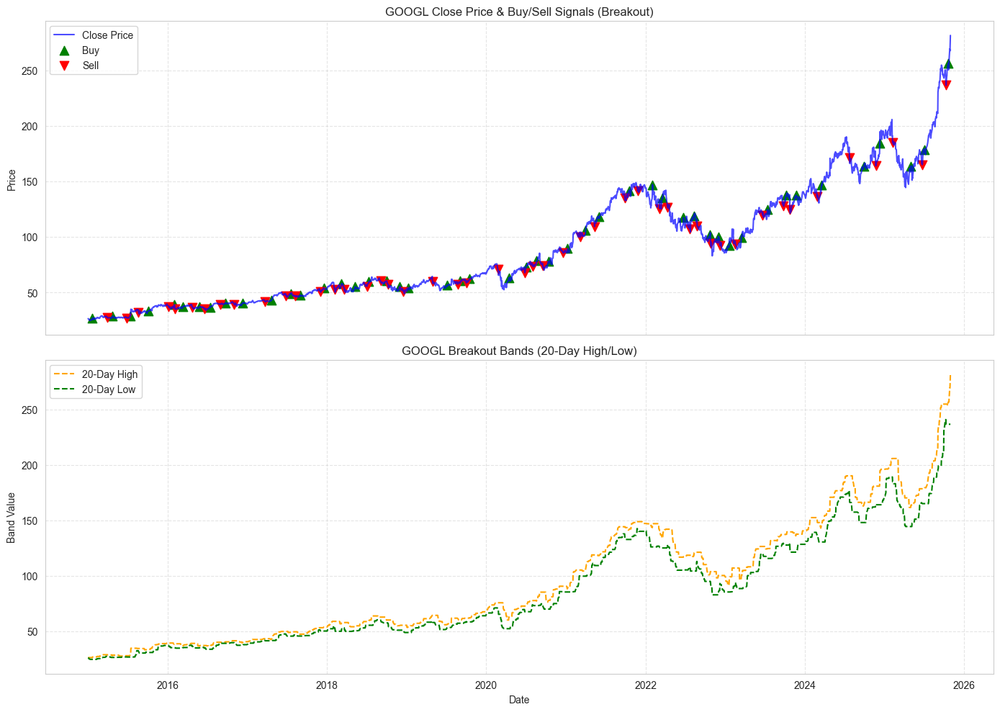

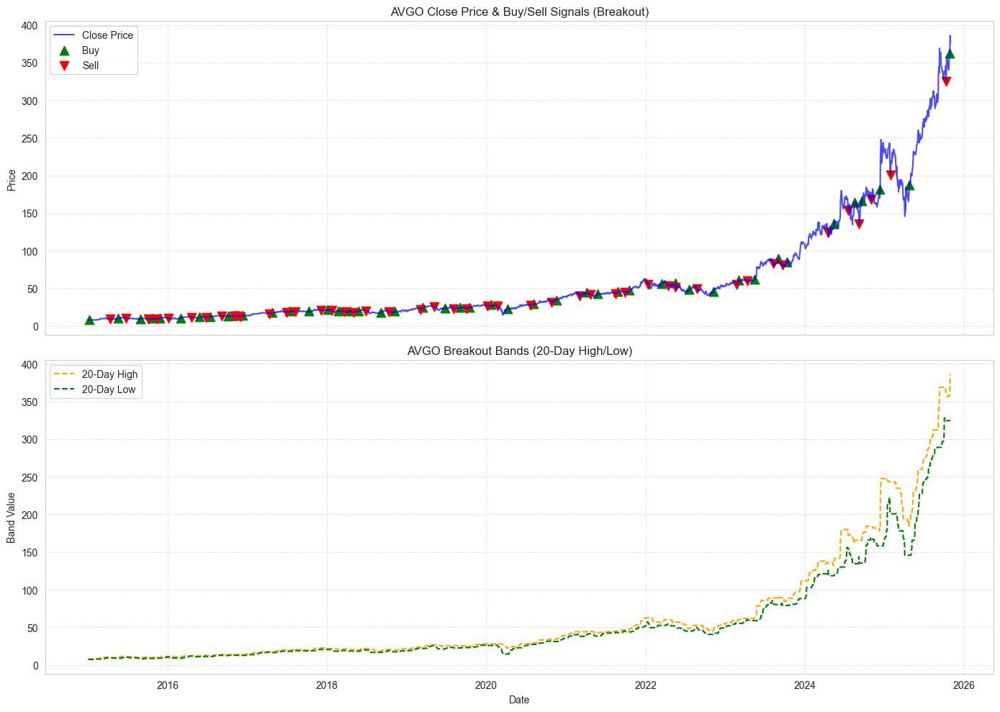

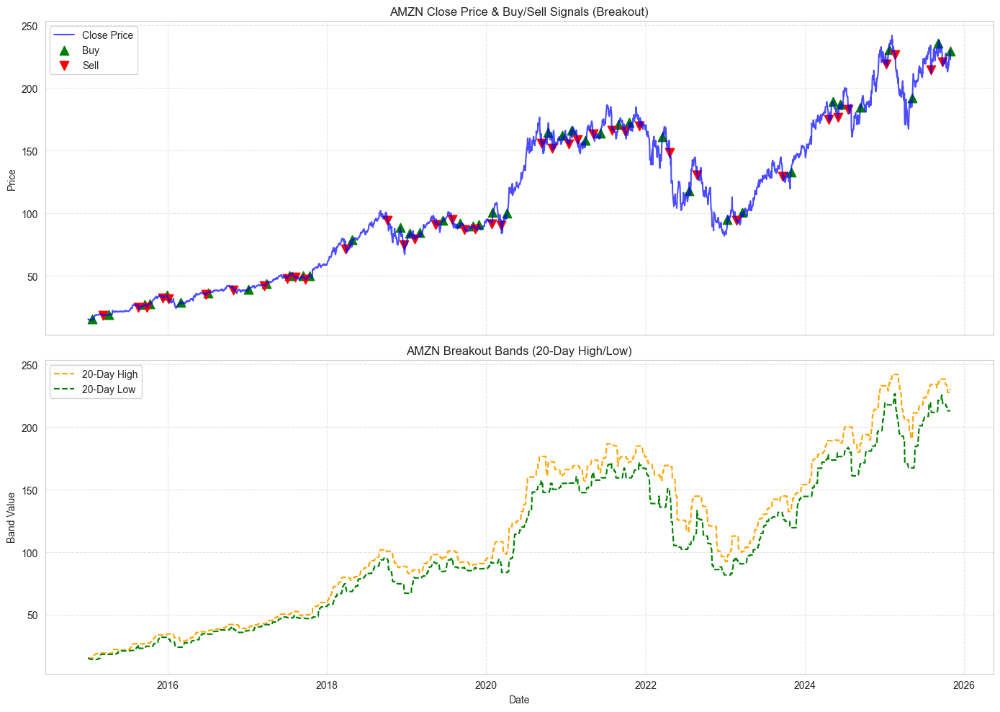

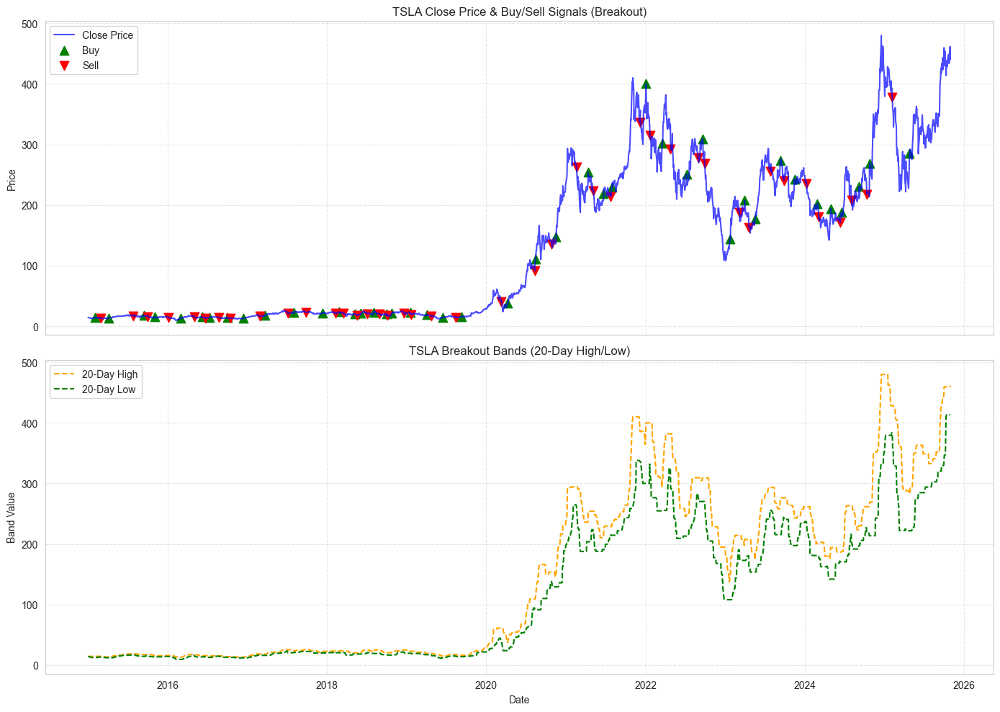

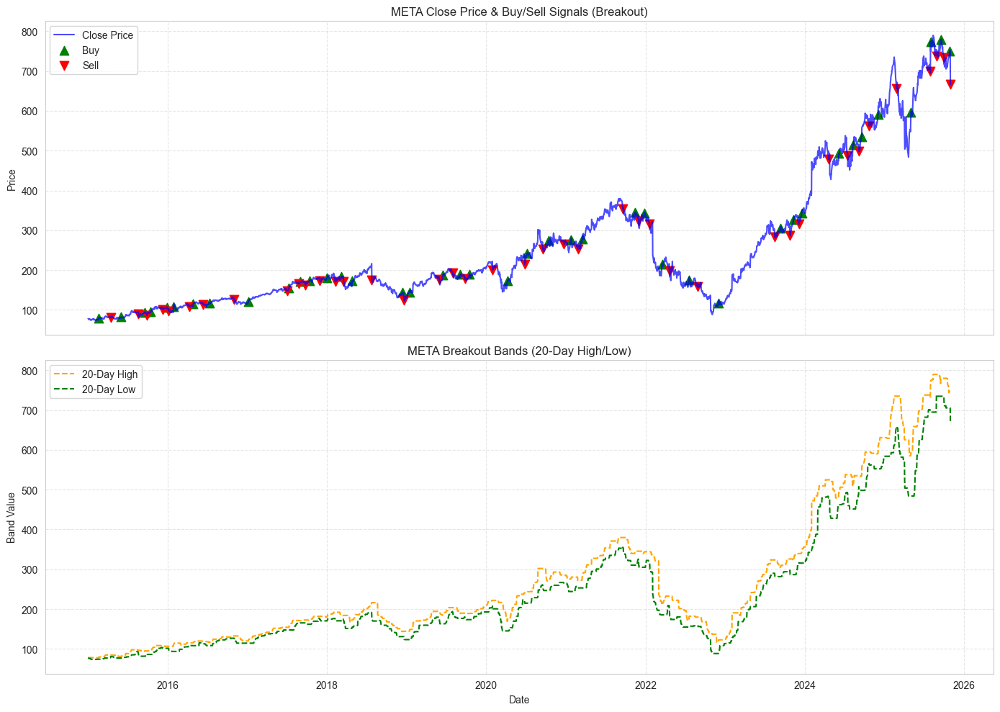

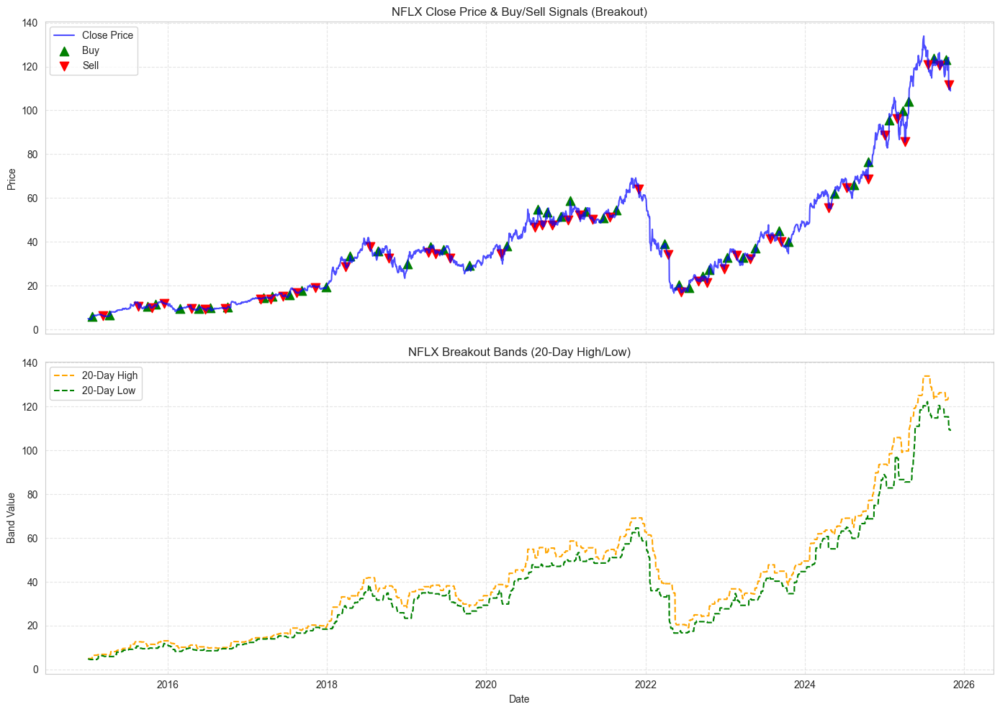

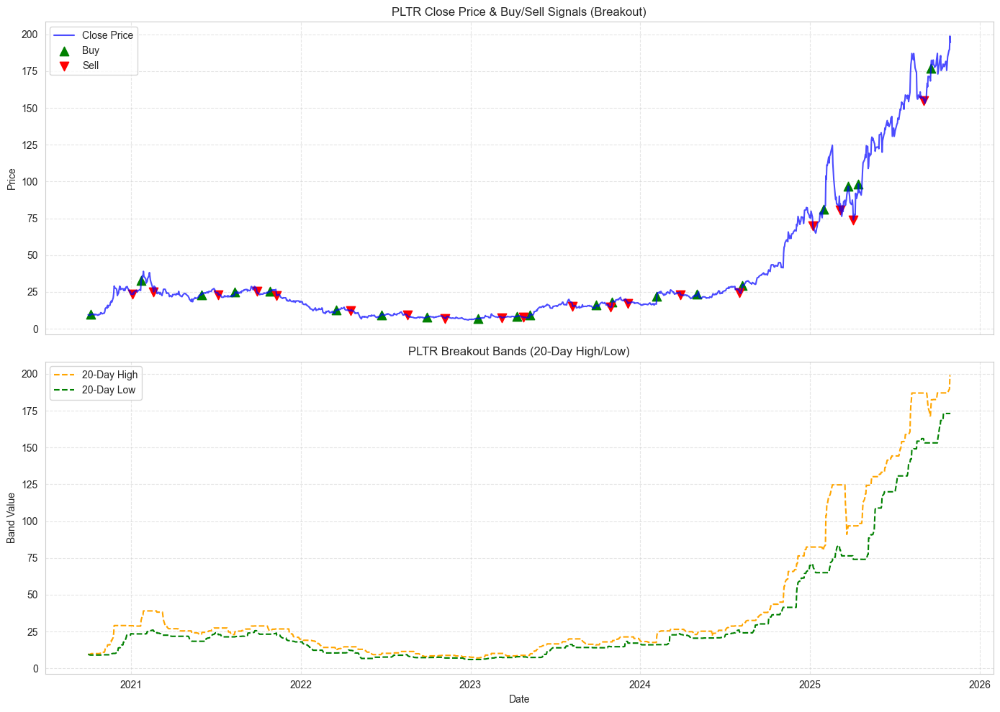

In [292]:
for ticker in breakout_dict:
    stock_bo_plot = breakout_dict[ticker].copy()
    buy_signals = stock_bo_plot[stock_bo_plot['Pos_Marker'] == 1]
    sell_signals = stock_bo_plot[stock_bo_plot['Pos_Marker'] == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Top subplot: Close price + buy/sell signals
    axs[0].plot(stock_bo_plot.index, stock_bo_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Close Price & Buy/Sell Signals (Breakout)")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Bottom subplot: Breakout bands only (20-day high/low)
    axs[1].plot(stock_bo_plot.index, stock_bo_plot['20 Day High'], label='20-Day High', color='orange', linestyle='--')
    axs[1].plot(stock_bo_plot.index, stock_bo_plot['20 Day Low'], label='20-Day Low', color='green', linestyle='--')
    axs[1].set_ylabel("Band Value")
    axs[1].set_xlabel("Date")
    axs[1].set_title(f"{ticker} Breakout Bands (20-Day High/Low)")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

In [293]:
pivot_table_bo = metrics_bo.pivot(index='Ticker', columns='Year', values='Total Return')
pivot_table_bo

Year,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
Ticker,,,,,,,,,,,
AAPL,-0.010283,0.017099,0.134678,-0.001779,0.088639,0.233822,0.070558,-0.016310,0.031626,0.011958,-0.012997
AMZN,0.123342,0.055549,0.015783,0.108203,-0.009537,0.073517,-0.014523,-0.001483,0.144149,0.048602,0.045125
AVGO,0.007244,-0.003053,0.053734,-0.034680,0.009657,0.060175,0.014230,0.003349,0.082512,0.055064,0.424409
GOOGL,0.030950,-0.007063,0.039087,-0.036245,0.029220,0.049043,0.065871,-0.089917,0.025962,0.055580,0.113181
META,0.022458,-0.006519,0.049944,-0.058309,0.050466,0.063235,0.033155,-0.082213,0.180878,0.074903,0.001491
MSFT,-0.015681,0.060792,0.095502,-0.033196,0.028388,0.081700,0.077482,-0.054723,0.062241,0.002852,0.099922
NFLX,0.112519,-0.026034,0.071568,0.116664,-0.016198,0.005651,-0.006466,-0.062278,-0.001484,0.122134,0.001486
NVDA,0.040444,0.223842,0.123320,-0.035569,0.064063,0.229549,0.060128,-0.076712,0.069387,0.120258,0.095806
PLTR,NaN,NaN,NaN,NaN,NaN,NaN,0.028806,-0.067194,0.050000,0.056416,0.241158


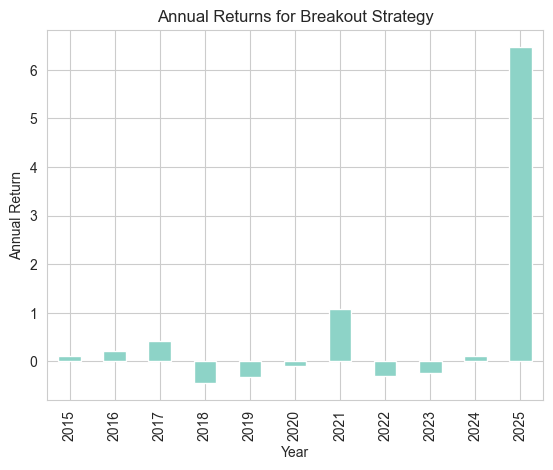

In [294]:
#annual return plot for breakout strategy
metrics_bo['Year'] = metrics_bo['Year']
annual_return_bo = metrics_bo.groupby(by='Year')['Standard Return'].prod()-1

# Plot annual returns as a bar chart
annual_return_bo.plot(kind='bar')
plt.title("Annual Returns for Breakout Strategy")
plt.xlabel("Year")
plt.ylabel("Annual Return")
plt.show()

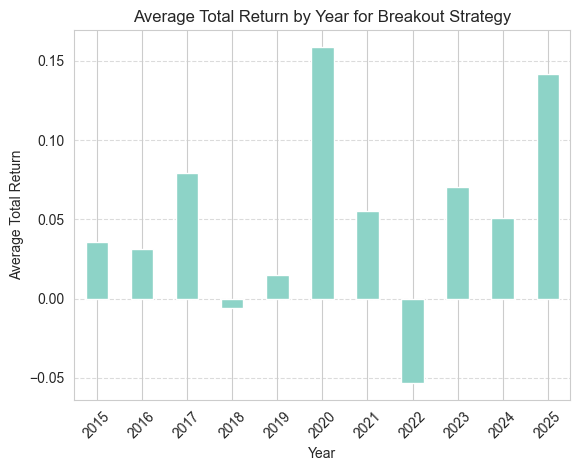

In [295]:
#bar plot: Total Return by Year (breakout strategy, all tickers combined, mean)
total_return_by_year_bo = metrics_bo.groupby('Year')['Total Return'].mean()
total_return_by_year_bo.plot(kind='bar')
plt.title("Average Total Return by Year for Breakout Strategy")
plt.xlabel("Year")
plt.ylabel("Average Total Return")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

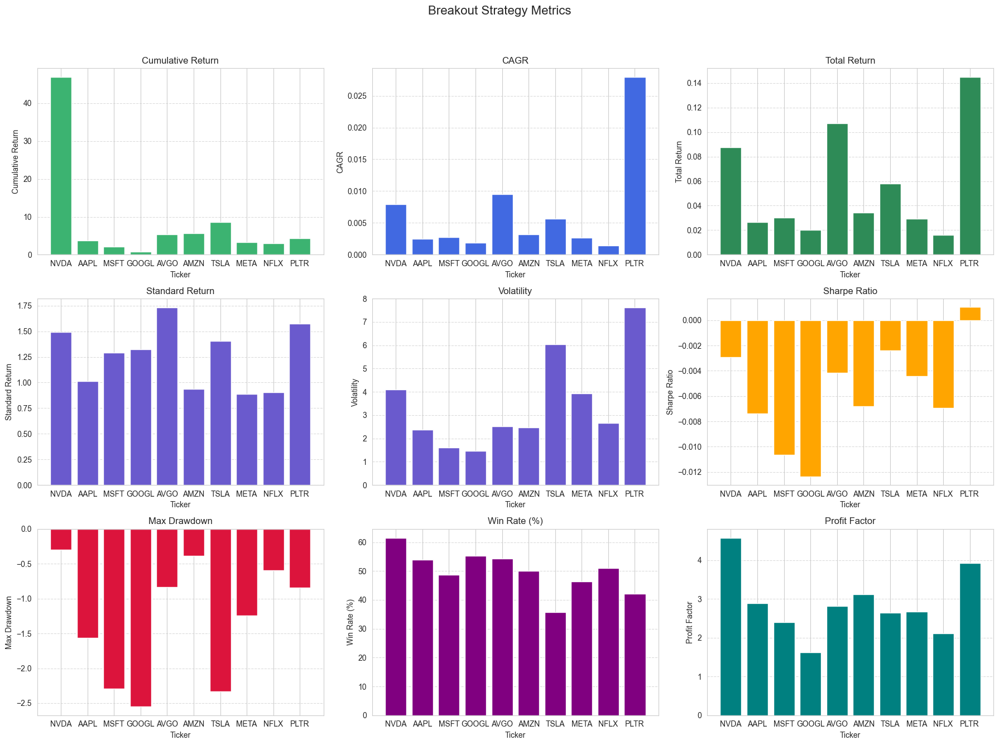

In [296]:
fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('Breakout Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(metrics_df_bo['Ticker'], metrics_df_bo['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(metrics_df_bo['Ticker'], metrics_df_bo['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(metrics_df_bo['Ticker'], metrics_df_bo['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Standard Return by Ticker
axs[1, 0].bar(metrics_df_bo['Ticker'], metrics_df_bo['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Volatility by Ticker
axs[1, 1].bar(metrics_df_bo['Ticker'], metrics_df_bo['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(metrics_df_bo['Ticker'], metrics_df_bo['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(metrics_df_bo['Ticker'], metrics_df_bo['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate (%) by Ticker
axs[2, 1].bar(metrics_df_bo['Ticker'], metrics_df_bo['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(metrics_df_bo['Ticker'], metrics_df_bo['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [297]:
#summary table for breakout strategy
bo_summary = pd.DataFrame({
    'Strategy': ['Breakout Strategy'],
    'CAGR': [metrics_df_bo['CAGR'].mean()],
    'Total Return': [metrics_df_bo['Total Return'].mean()],
    'Volatility': [metrics_df_bo['Volatility'].mean()],
    'Max Drawdown': [metrics_df_bo['Max Drawdown'].mean()],
    'Sharpe Ratio': [metrics_df_bo['Sharpe Ratio'].mean()],
    'Win Rate (%)': [metrics_df_bo['Win Rate (%)'].mean()],
    'Profit Factor': [metrics_df_bo['Profit Factor'].mean()]
})

#use fund summary
summary_table_bo = pd.concat([bo_summary, fund_summary], ignore_index=True)
summary_table_bo.set_index('Strategy', inplace=True)
display(summary_table_bo)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
Breakout Strategy,0.006553,0.055408,3.482428,-1.293274,-0.005696,49.910420,2.881154
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


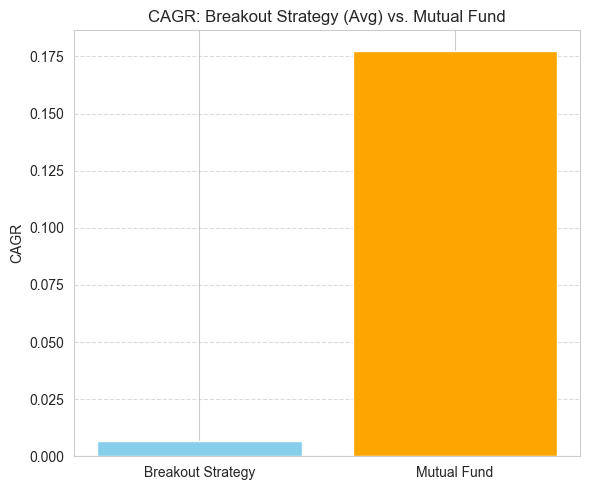

In [298]:
# Plot CAGR for Breakout Strategy (Avg) vs Mutual Fund
summary_table_bo_plot = summary_table_bo.reset_index()
plt.figure(figsize=(6, 5))

strategies_bo = summary_table_bo_plot['Strategy']
cagr_values_bo = summary_table_bo_plot['CAGR']
plt.bar(strategies_bo, cagr_values_bo, color=['skyblue', 'orange'])
plt.ylabel('CAGR')
plt.title('CAGR: Breakout Strategy (Avg) vs. Mutual Fund')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#### Donchian Strategy

In [299]:
donchian_trades = []
donchian_dict = {}

for ticker in holdings:
    print(f"Processing {ticker} for donchian channel strategy...")
    try:
        stock_dc = data[ticker][['Close']].dropna().copy()
        # Calculate the 20-day high and low
        stock_dc['20 Day High'] = stock_dc['Close'].rolling(window=20, min_periods=1).max()
        stock_dc['20 Day Low'] = stock_dc['Close'].rolling(window=20, min_periods=1).min()
        stock_dc['Position'] = 0
        stock_dc['Position'] = np.where(stock_dc['Close'] > stock_dc['20 Day High'].shift(1), 1,
                                       np.where(stock_dc['Close'] < stock_dc['20 Day Low'].shift(1), -1, 0))
        # Entry/exit marker logic
        stock_dc['Hold_Position'] = 0
        current = 0
        for idx, row in stock_dc.iterrows():
            if row['Position'] == 1:
                current = 1
            elif row['Position'] == -1:
                current = -1
            stock_dc.at[idx, 'Hold_Position'] = current
        stock_dc['Prev_Hold'] = stock_dc['Hold_Position'].shift(1).fillna(0)
        stock_dc['Pos_Marker'] = 0
        stock_dc.loc[(stock_dc['Prev_Hold'] != 1) & (stock_dc['Hold_Position'] == 1), 'Pos_Marker'] = 1
        stock_dc.loc[(stock_dc['Prev_Hold'] == 1) & (stock_dc['Hold_Position'] != 1), 'Pos_Marker'] = -1

        donchian_dict[ticker] = stock_dc[['Close', '20 Day High', '20 Day Low', 'Position', 'Hold_Position', 'Pos_Marker']].copy()
        trades_dc = calculate_trades(pd.DataFrame({'Close': stock_dc['Close'], 'Position': stock_dc['Pos_Marker']}, index=stock_dc.index))
        if not trades_dc.empty:
            trades_dc['Ticker'] = ticker
            donchian_trades.append(trades_dc)
    except KeyError as e:
        print(f"Error processing {ticker} for donchian channel strategy: {e}")
        continue

donchian_trades_df = pd.concat(donchian_trades, ignore_index=True)
if not donchian_trades_df.empty:
    columns = ['Ticker'] + [col for col in donchian_trades_df.columns if col != 'Ticker']
    donchian_trades_df = donchian_trades_df[columns]



Processing NVDA for donchian channel strategy...
Processing AAPL for donchian channel strategy...
Processing MSFT for donchian channel strategy...
Processing GOOGL for donchian channel strategy...
Processing AVGO for donchian channel strategy...
Processing AMZN for donchian channel strategy...
Processing TSLA for donchian channel strategy...
Processing META for donchian channel strategy...
Processing NFLX for donchian channel strategy...
Processing PLTR for donchian channel strategy...


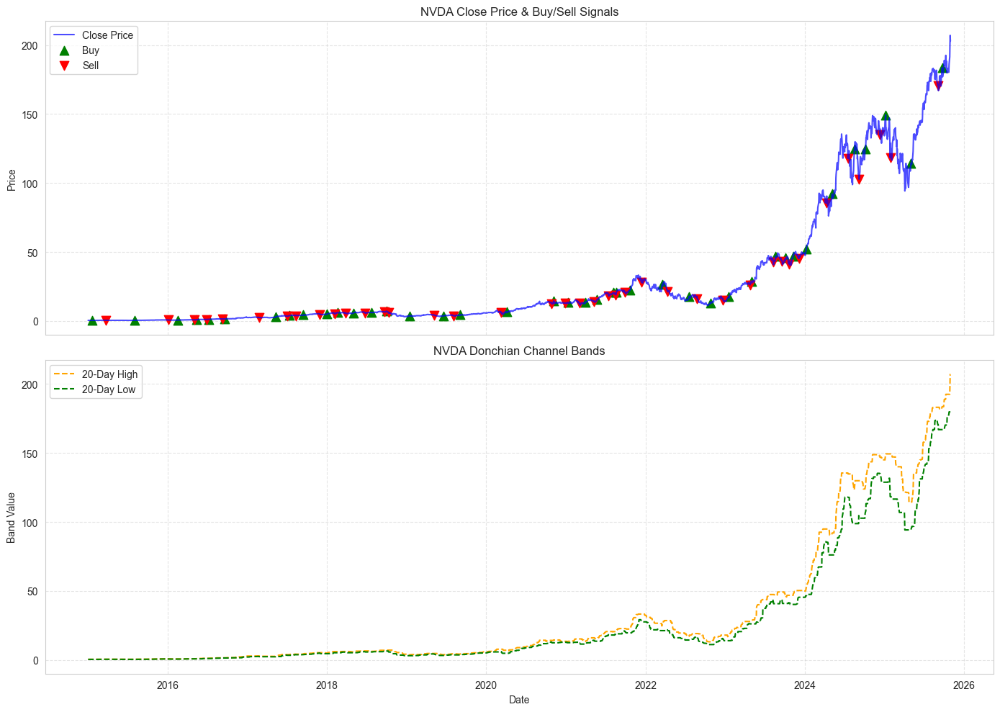

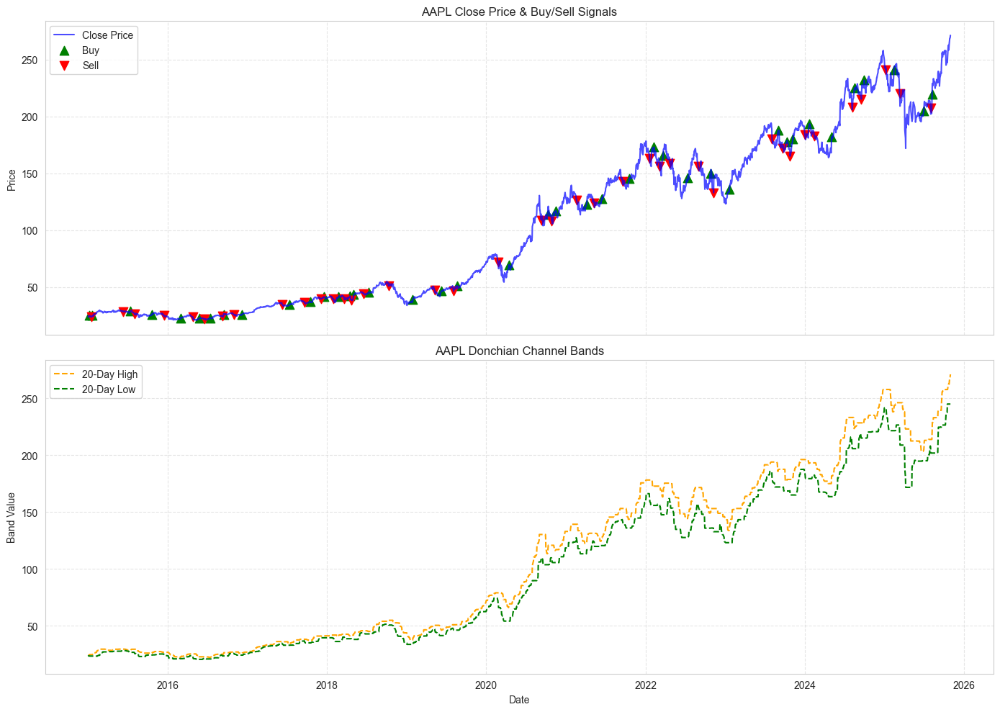

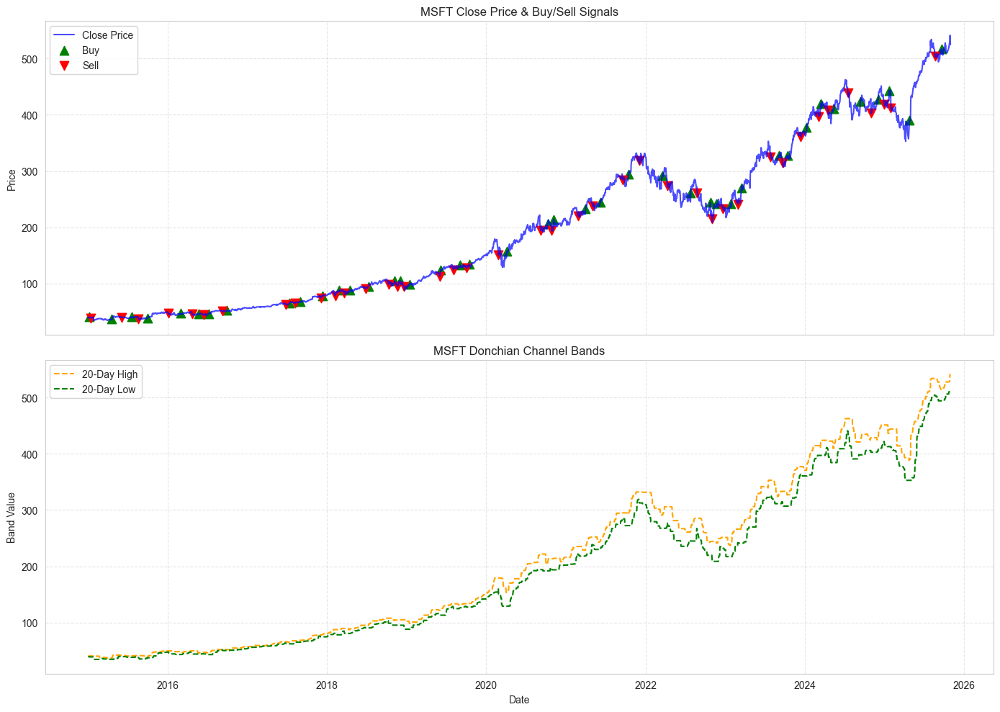

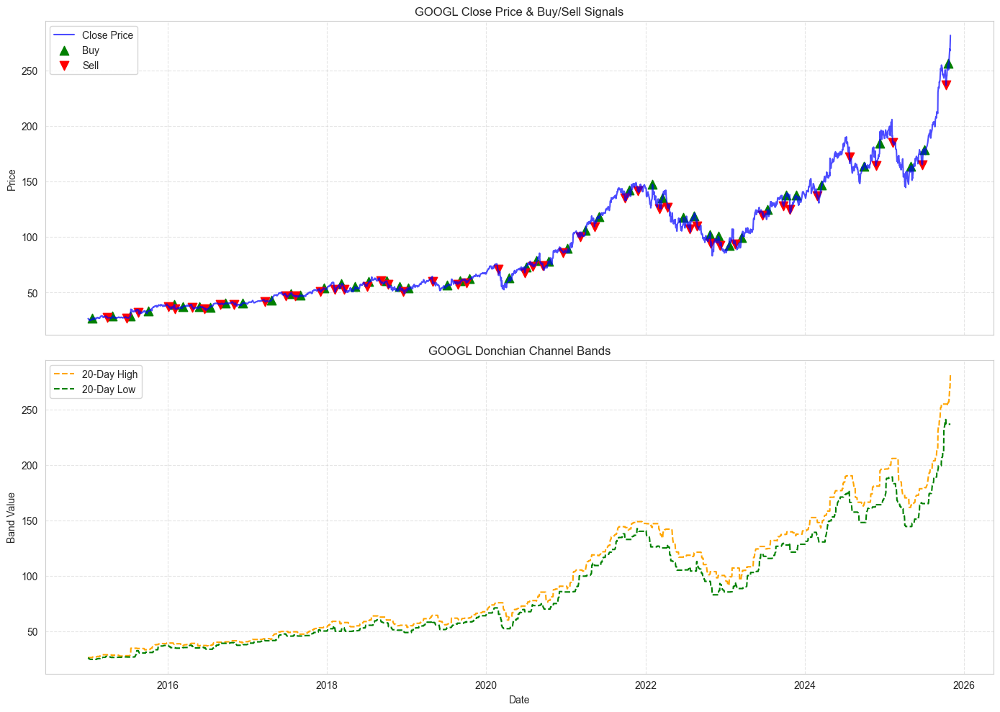

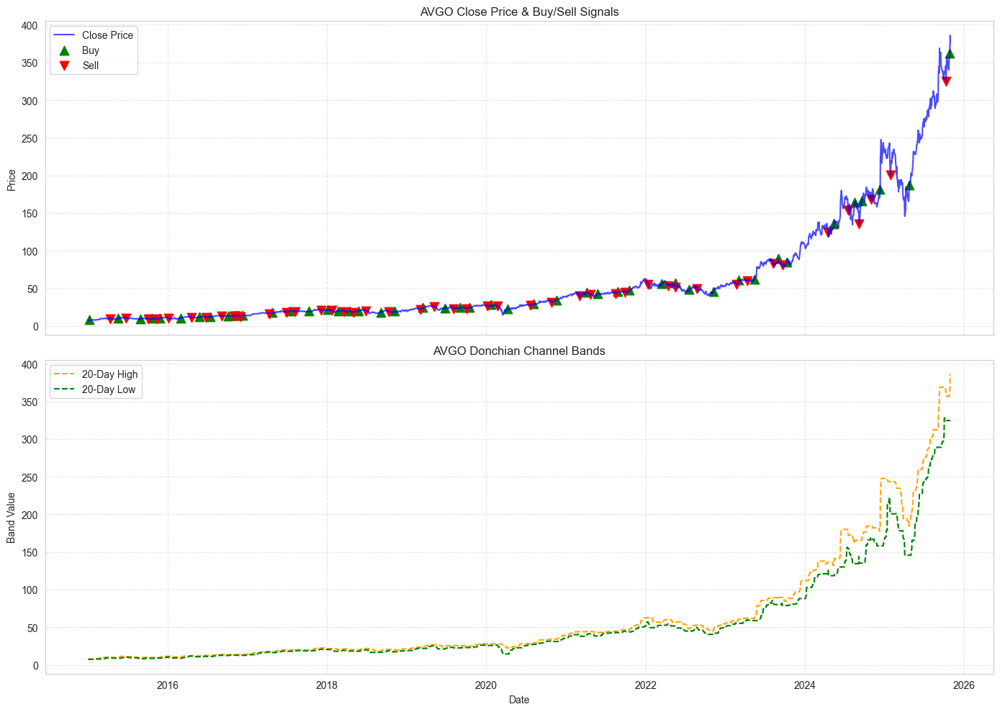

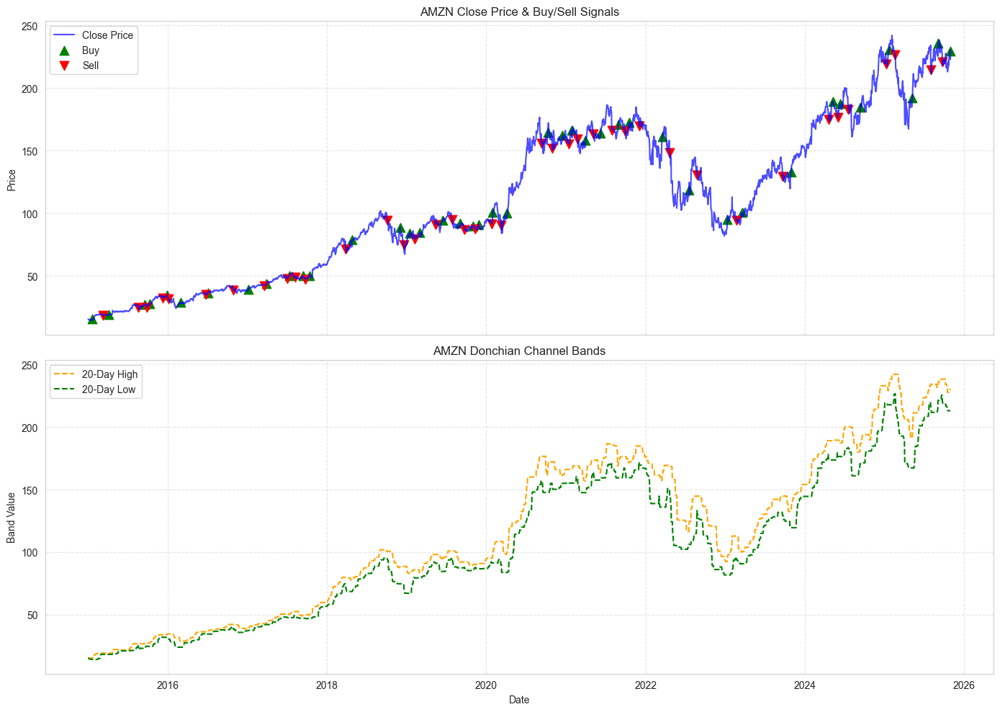

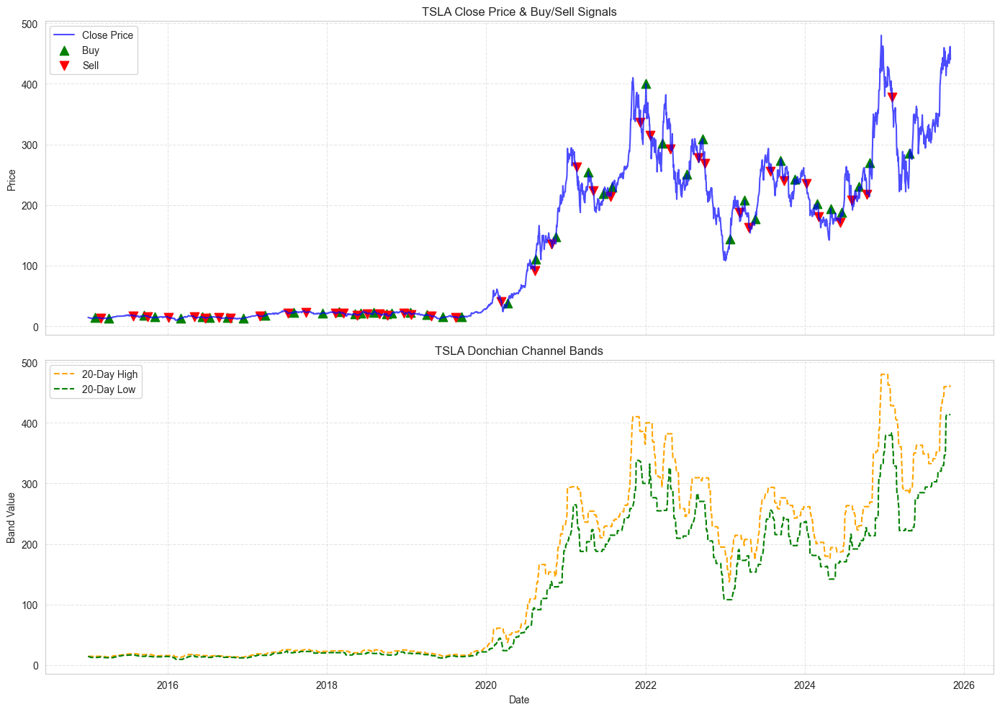

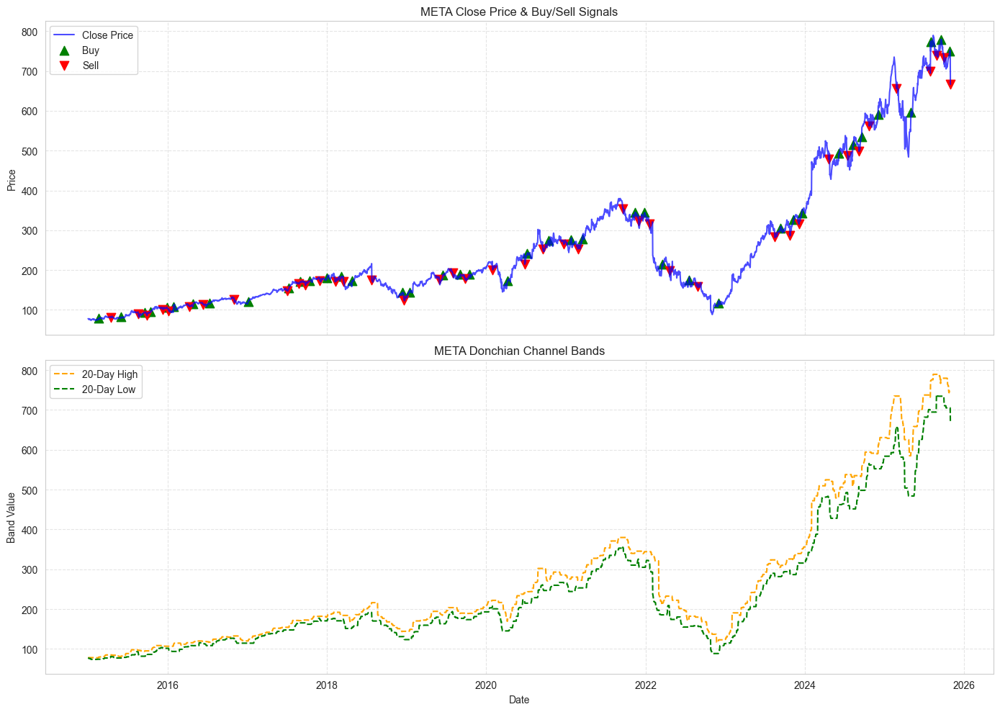

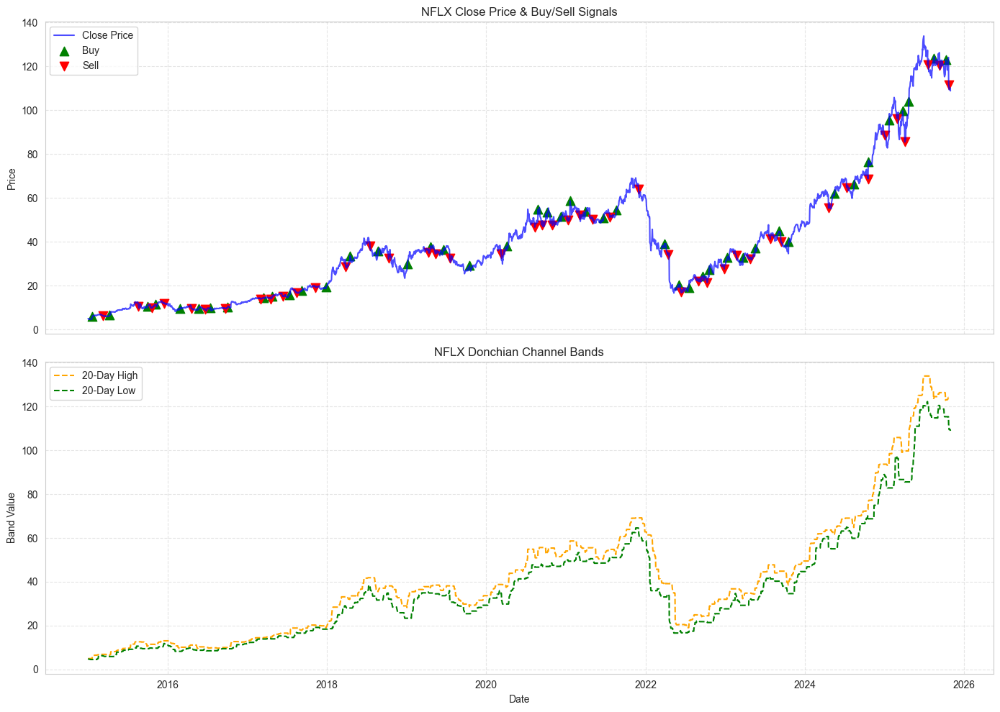

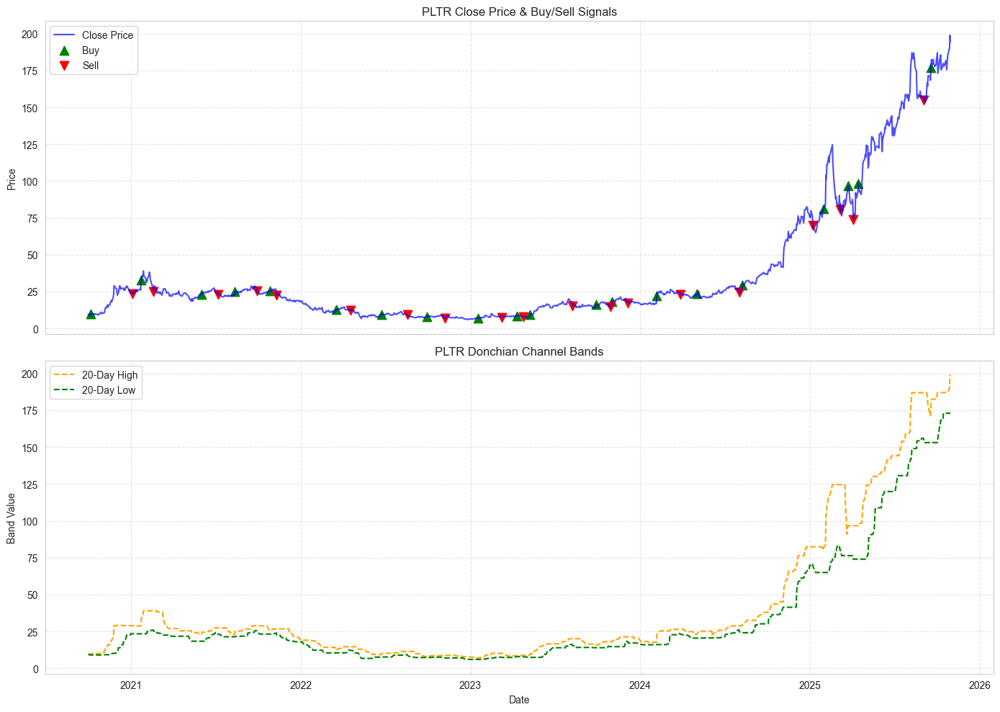

In [300]:
# Plot Donchian Channel signals for each ticker
for ticker in donchian_dict:
    stock_dc_plot = donchian_dict[ticker].copy()
    buy_signals = stock_dc_plot[stock_dc_plot['Pos_Marker'] == 1]
    sell_signals = stock_dc_plot[stock_dc_plot['Pos_Marker'] == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Top subplot: Close price + buy/sell signals
    axs[0].plot(stock_dc_plot.index, stock_dc_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Close Price & Buy/Sell Signals")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Bottom subplot: Donchian Channel bands only (20-day high/low)
    axs[1].plot(stock_dc_plot.index, stock_dc_plot['20 Day High'], label='20-Day High', color='orange', linestyle='--')
    axs[1].plot(stock_dc_plot.index, stock_dc_plot['20 Day Low'], label='20-Day Low', color='green', linestyle='--')
    axs[1].set_ylabel("Band Value")
    axs[1].set_xlabel("Date")
    axs[1].set_title(f"{ticker} Donchian Channel Bands")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

In [301]:
#ensure dates and year
donchian_trades_df['Sell Date'] = pd.to_datetime(donchian_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
donchian_trades_df['Buy Date'] = pd.to_datetime(donchian_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
donchian_trades_df['Year'] = donchian_trades_df['Sell Date'].dt.year

In [302]:
#calculate metrics for donchian channel strategy
metrics_dc = donchian_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)
metrics_rows_dc = []
for ticker in holdings:
    ticker_trades_dc = donchian_trades_df[donchian_trades_df['Ticker'] == ticker]
    metrics_row_dc = calculate_metrics(ticker_trades_dc)
    metrics_rows_dc.append(metrics_row_dc)
metrics_df_dc = pd.concat(metrics_rows_dc, ignore_index=True)

C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3474760777.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_dc = donchian_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [303]:
#annual return plot for donchian channel strategy
metrics_dc['Year'] = metrics_dc['Year']
annual_return_dc = metrics_dc.groupby(by='Year')['Standard Return'].prod()-1

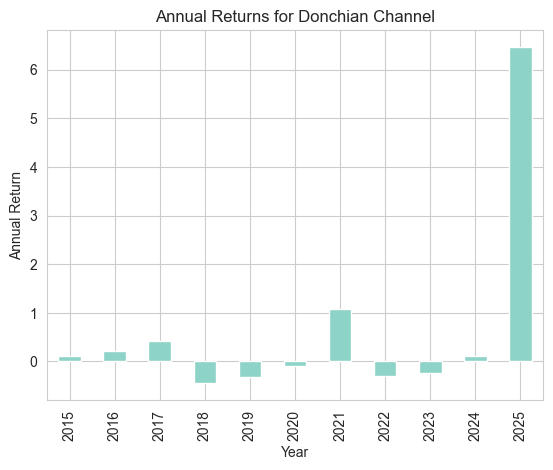

In [304]:
# Plot annual returns as a bar chart
annual_return_dc.plot(kind='bar')
plt.title("Annual Returns for Donchian Channel")
plt.xlabel("Year")
plt.ylabel("Annual Return")
plt.show()

In [305]:
pivot_table_dc = metrics_dc.pivot(index='Ticker', columns='Year', values='Total Return')
pivot_table_dc

Year,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
Ticker,,,,,,,,,,,
AAPL,-0.010283,0.017099,0.134678,-0.001779,0.088639,0.233822,0.070558,-0.016310,0.031626,0.011958,-0.012997
AMZN,0.123342,0.055549,0.015783,0.108203,-0.009537,0.073517,-0.014523,-0.001483,0.144149,0.048602,0.045125
AVGO,0.007244,-0.003053,0.053734,-0.034680,0.009657,0.060175,0.014230,0.003349,0.082512,0.055064,0.424409
GOOGL,0.030950,-0.007063,0.039087,-0.036245,0.029220,0.049043,0.065871,-0.089917,0.025962,0.055580,0.113181
META,0.022458,-0.006519,0.049944,-0.058309,0.050466,0.063235,0.033155,-0.082213,0.180878,0.074903,0.001491
MSFT,-0.015681,0.060792,0.095502,-0.033196,0.028388,0.081700,0.077482,-0.054723,0.062241,0.002852,0.099922
NFLX,0.112519,-0.026034,0.071568,0.116664,-0.016198,0.005651,-0.006466,-0.062278,-0.001484,0.122134,0.001486
NVDA,0.040444,0.223842,0.123320,-0.035569,0.064063,0.229549,0.060128,-0.076712,0.069387,0.120258,0.095806
PLTR,NaN,NaN,NaN,NaN,NaN,NaN,0.028806,-0.067194,0.050000,0.056416,0.241158


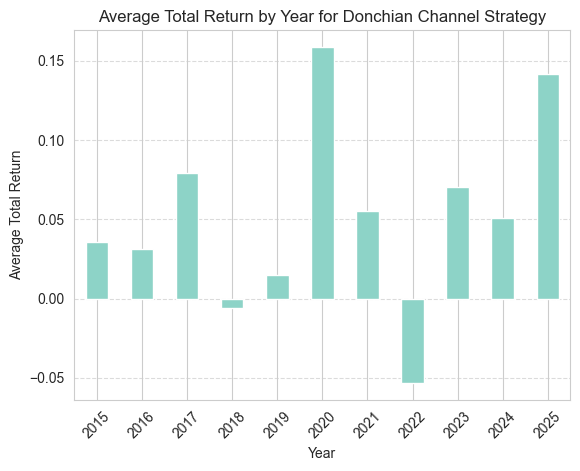

In [306]:
#bar plot: Total Return by Year (donchian channel strategy, all tickers combined, mean)
total_return_by_year_dc = metrics_dc.groupby('Year')['Total Return'].mean()
total_return_by_year_dc.plot(kind='bar')
plt.title("Average Total Return by Year for Donchian Channel Strategy")
plt.xlabel("Year")
plt.ylabel("Average Total Return")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

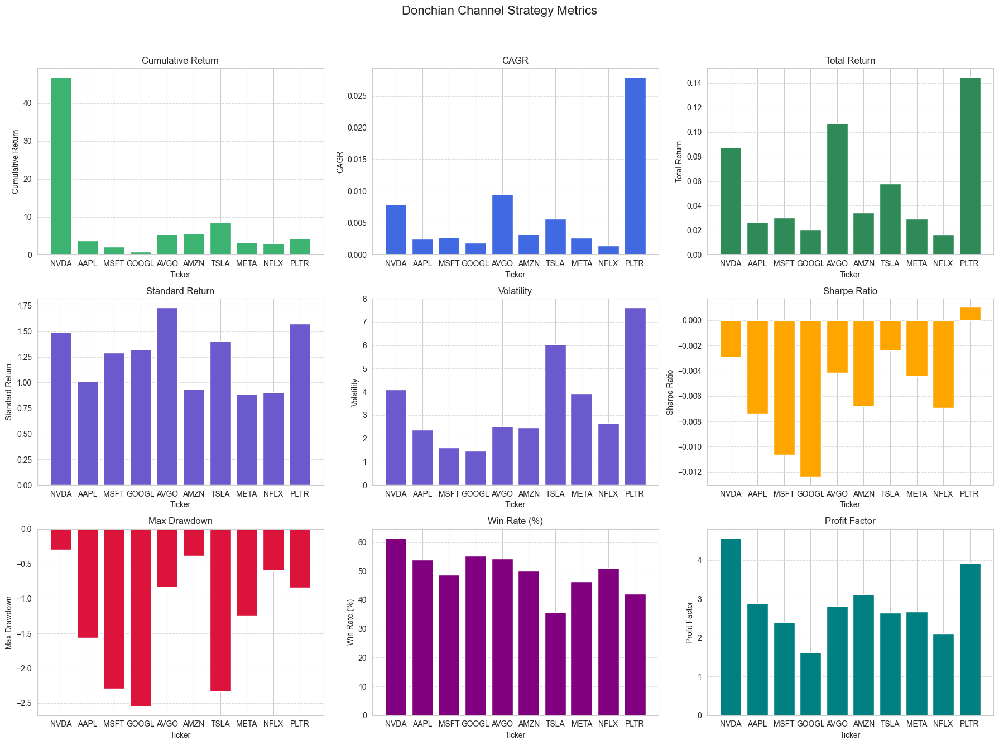

In [307]:
fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('Donchian Channel Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(metrics_df_dc['Ticker'], metrics_df_dc['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(metrics_df_dc['Ticker'], metrics_df_dc['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(metrics_df_dc['Ticker'], metrics_df_dc['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Standard Return by Ticker
axs[1, 0].bar(metrics_df_dc['Ticker'], metrics_df_dc['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Volatility by Ticker
axs[1, 1].bar(metrics_df_dc['Ticker'], metrics_df_dc['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(metrics_df_dc['Ticker'], metrics_df_dc['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(metrics_df_dc['Ticker'], metrics_df_dc['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate (%) by Ticker
axs[2, 1].bar(metrics_df_dc['Ticker'], metrics_df_dc['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(metrics_df_dc['Ticker'], metrics_df_dc['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [308]:
#summary table for donchian channel strategy
dc_summary = pd.DataFrame({
    'Strategy': ['Donchian Channel Strategy'],
    'CAGR': [metrics_df_dc['CAGR'].mean()],
    'Total Return': [metrics_df_dc['Total Return'].mean()],
    'Volatility': [metrics_df_dc['Volatility'].mean()],
    'Max Drawdown': [metrics_df_dc['Max Drawdown'].mean()],
    'Sharpe Ratio': [metrics_df_dc['Sharpe Ratio'].mean()],
    'Win Rate (%)': [metrics_df_dc['Win Rate (%)'].mean()],
    'Profit Factor': [metrics_df_dc['Profit Factor'].mean()]
})

In [309]:
#use fund summary
summary_table_dc = pd.concat([dc_summary, fund_summary], ignore_index=True)
summary_table_dc.set_index('Strategy', inplace=True)
display(summary_table_dc)


,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
Donchian Channel Strategy,0.006553,0.055408,3.482428,-1.293274,-0.005696,49.910420,2.881154
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


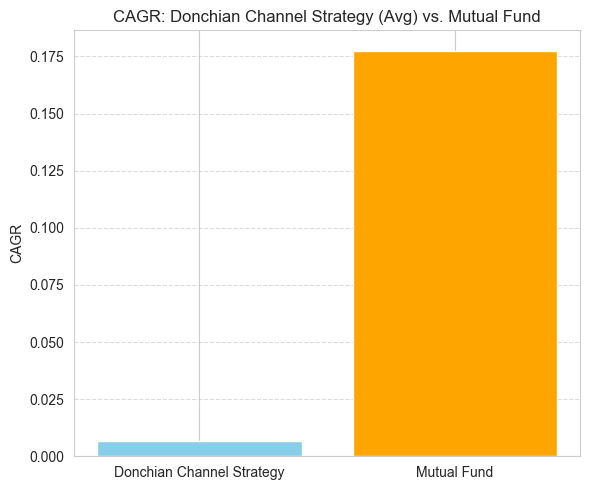

In [310]:
# Plot CAGR for Donchain Strategy (Avg) vs Mutual Fund
summary_table_dc_plot = summary_table_dc.reset_index()
plt.figure(figsize=(6, 5))


strategies_dc = summary_table_dc_plot['Strategy']
cagr_values_dc = summary_table_dc_plot['CAGR']
plt.bar(strategies_dc, cagr_values_dc, color=['skyblue', 'orange'])
plt.ylabel('CAGR')
plt.title('CAGR: Donchian Channel Strategy (Avg) vs. Mutual Fund')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [311]:
#combine strategy metrics for comparison
trend_startegies_summary = pd.concat([ma_summary, bo_summary, dc_summary], ignore_index=True)
trend_startegies_summary.set_index('Strategy', inplace=True)
display(trend_startegies_summary)


,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
MA Strategy (Avg),0.027364,0.775807,15.132701,-0.993162,-0.005159,61.636364,13.677120
Breakout Strategy,0.006553,0.055408,3.482428,-1.293274,-0.005696,49.910420,2.881154
Donchian Channel Strategy,0.006553,0.055408,3.482428,-1.293274,-0.005696,49.910420,2.881154


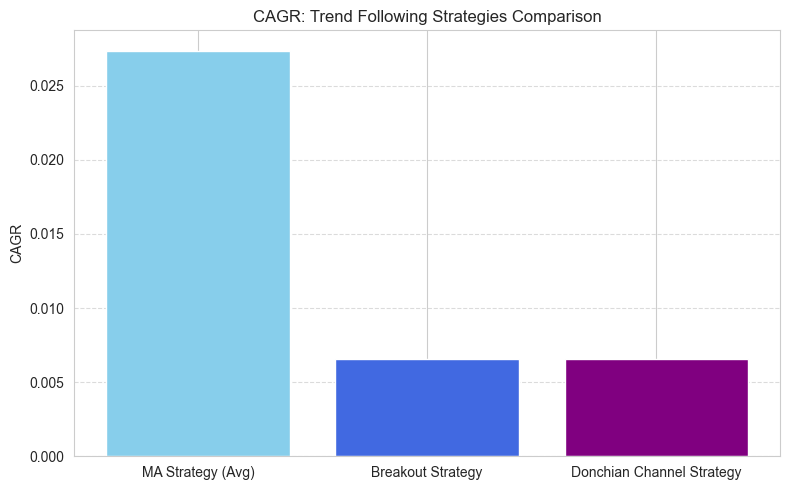

In [312]:
#plot comparison of trend following strategies
trend_strategies_plot = trend_startegies_summary.reset_index()
plt.figure(figsize=(8, 5))
plt.bar(trend_strategies_plot['Strategy'], trend_strategies_plot['CAGR'], color=['skyblue', 'royalblue', 'purple'])
plt.ylabel('CAGR')
plt.title('CAGR: Trend Following Strategies Comparison')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()  

## Mean Reversion

#### Bollinger Bands Reversal

In [313]:
# --- Bollinger Bands: compute bands, signals, and trades ---
bb_all_trades = []
bb_dict = {}

# Parameters (tweakable)
bb_window = 20
bb_n_std = 2

# Assuming `data` (downloaded with yf.download as in your notebook) and `holdings` exist
for ticker in holdings:
    print(f"Processing Bollinger for {ticker}...")
    try:
        stock_bb = data[ticker][['Close']].dropna().copy()
        # rolling mean and std
        stock_bb['BB_MA'] = stock_bb['Close'].rolling(window=bb_window, min_periods=1).mean()
        stock_bb['BB_STD'] = stock_bb['Close'].rolling(window=bb_window, min_periods=1).std(ddof=0)
        stock_bb['BB_UP'] = stock_bb['BB_MA'] + bb_n_std * stock_bb['BB_STD']
        stock_bb['BB_LOW'] = stock_bb['BB_MA'] - bb_n_std * stock_bb['BB_STD']

        # Signal logic for mean-reversion (Bollinger Reversal)
        # Approach: create entry signals only on a crossing back inside the band after being outside.
        # - Long entry (1): price was below lower band yesterday and today closes above or equal to lower band (reversion from below).
        # - Short entry (-1): price was above upper band yesterday and today closes below or equal to upper band (reversion from above).
        stock_bb['Below_Low'] = stock_bb['Close'] < stock_bb['BB_LOW']
        stock_bb['Above_Up'] = stock_bb['Close'] > stock_bb['BB_UP']

        stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
        stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)
        stock_bb['Position'] = 0
        # Enter long when we were below yesterday and now we moved back inside (or equal to) the lower band
        stock_bb.loc[(stock_bb['Prev_Below_Low'] == True) & (stock_bb['Close'] >= stock_bb['BB_LOW']), 'Position'] = 1
        # Enter short (or exit long) when we were above yesterday and now moved back inside (or equal to) the upper band
        stock_bb.loc[(stock_bb['Prev_Above_Up'] == True) & (stock_bb['Close'] <= stock_bb['BB_UP']), 'Position'] = -1

        # Optional: forward-fill position to simulate holding until opposite signal:
        # If you want to hold the position until an opposite signal appears, derive a holding position:
        stock_bb['Hold_Position'] = 0
        current = 0
        for idx, row in stock_bb.iterrows():
            if row['Position'] == 1:
                current = 1
            elif row['Position'] == -1:
                current = -1
            stock_bb.at[idx, 'Hold_Position'] = current
        # Use 'Hold_Position' if you want holds; otherwise `Position` has only entry rows.
        # For compatibility with your `calculate_trades`, use entry/exit markers: set 1 for buy and -1 for sell.
        # The `calculate_trades` expects a 1 to open and -1 to close. We'll convert holding into explicit entry/exit:
        # Build entry/exit markers: when Hold changes from 0 to 1 -> buy (1); when Hold changes from 1 to -1 -> sell (-1); when 1->0 (flat) -> sell (-1)
        stock_bb['Prev_Hold'] = stock_bb['Hold_Position'].shift(1).fillna(0)
        stock_bb['Pos_Marker'] = 0
        # buy marker
        stock_bb.loc[(stock_bb['Prev_Hold'] != 1) & (stock_bb['Hold_Position'] == 1), 'Pos_Marker'] = 1
        # sell marker (when leaving a long)
        stock_bb.loc[(stock_bb['Prev_Hold'] == 1) & (stock_bb['Hold_Position'] != 1), 'Pos_Marker'] = -1

        # If you prefer trades only on immediate reversion days (without multi-day holding), you can instead use 'Position'
        # For calculate_trades we expect 1 for buy day, -1 for sell day. We'll use Pos_Marker.
        trades = calculate_trades(pd.DataFrame({
            'Close': stock_bb['Close'],
            'Position': stock_bb['Pos_Marker']
        }, index=stock_bb.index))
        if not trades.empty:
            trades['Ticker'] = ticker
            # Ensure dates and Sell/Buy Price columns exist and correct
            bb_all_trades.append(trades)
        bb_dict[ticker] = stock_bb[['Close','BB_MA','BB_UP','BB_LOW','Position','Hold_Position','Pos_Marker']].copy()
    except Exception as e:
        print(f"Skipping {ticker}, error: {e}")
        continue

# Collect into DataFrame
if bb_all_trades:
    bb_all_trades_df = pd.concat(bb_all_trades, ignore_index=True)
    # Parse date strings into datetimes similar to earlier processing
    bb_all_trades_df['Sell Date'] = pd.to_datetime(bb_all_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
    bb_all_trades_df['Buy Date'] = pd.to_datetime(bb_all_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
    bb_all_trades_df['Year'] = bb_all_trades_df['Sell Date'].dt.year
else:
    bb_all_trades_df = pd.DataFrame()

Processing Bollinger for NVDA...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for AAPL...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for MSFT...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for GOOGL...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for AVGO...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for AMZN...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for TSLA...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for META...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for NFLX...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


Processing Bollinger for PLTR...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Below_Low'] = stock_bb['Below_Low'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3229649040.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_bb['Prev_Above_Up'] = stock_bb['Above_Up'].shift(1).fillna(False)


In [314]:
#group by ticker and year to calculate annual metrics for breakout strategy
metrics_bb = bb_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\128868674.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_bb = bb_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [315]:

#calculate overall metrics for each ticker for breakout strategy
metrics_rows_bb = []
for ticker in holdings:
    ticker_trades_bb = bb_all_trades_df[bb_all_trades_df['Ticker'] == ticker]
    metrics_row_bb = calculate_metrics(ticker_trades_bb)
    metrics_rows_bb.append(metrics_row_bb)
metrics_df_bb = pd.concat(metrics_rows_bb, ignore_index=True)


print(metrics_df_bb.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015  0.010354      0.114410         1.090822          11.628361   
1   AAPL  2015  0.004073      0.043288         1.092822           2.059957   
2   MSFT  2015  0.004479      0.046896         1.091488           3.823433   
3  GOOGL  2015  0.001977      0.021040         1.025845           1.082648   
4   AVGO  2015  0.008242      0.085970         1.128289           5.496585   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0    2.188088     -0.543247     -0.004408     83.870968       5.249495  
1    1.044598     -0.902371     -0.015247     78.125000       3.935786  
2    0.946286     -0.207246     -0.016402     86.666667       9.424694  
3    1.306655     -0.524431     -0.013793     78.571429       2.594725  
4    1.179060     -1.179250     -0.009973     84.375000       8.418123  


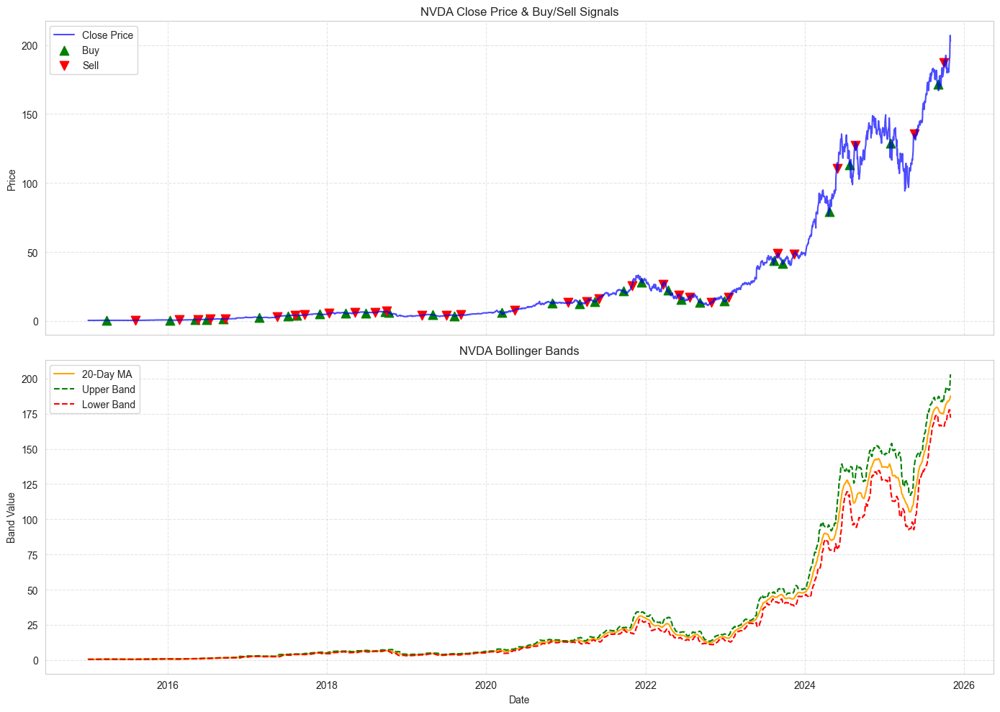

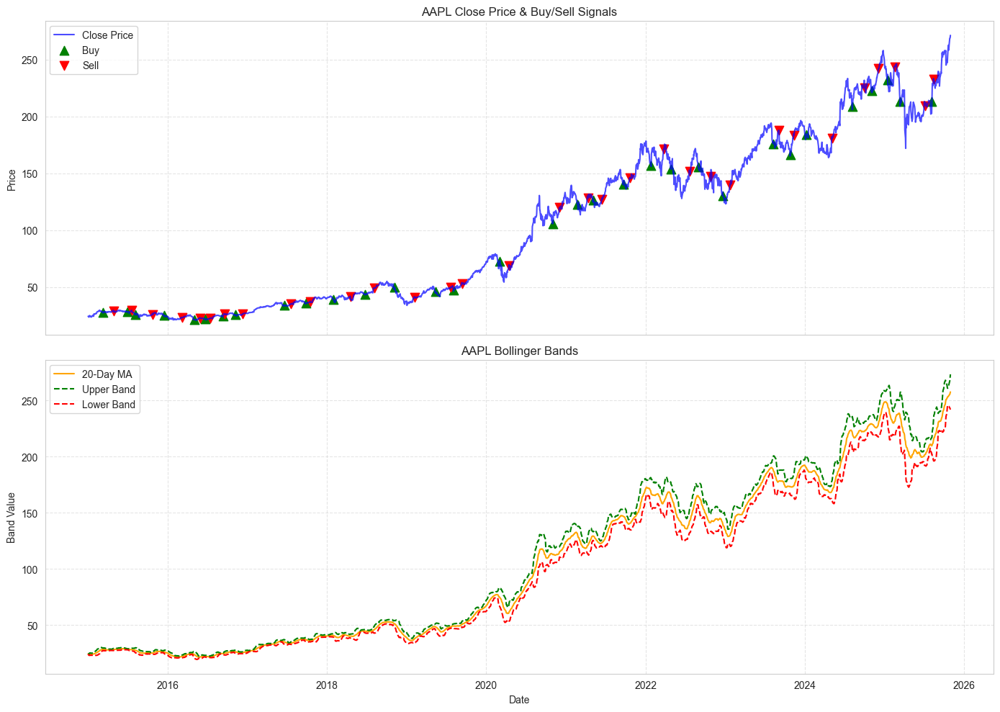

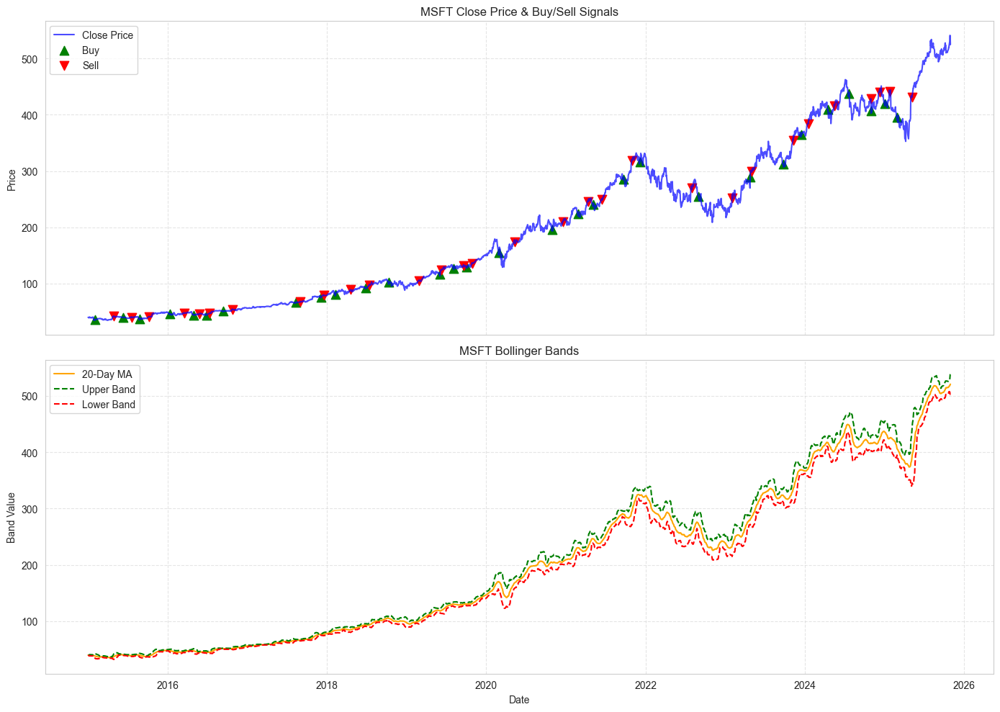

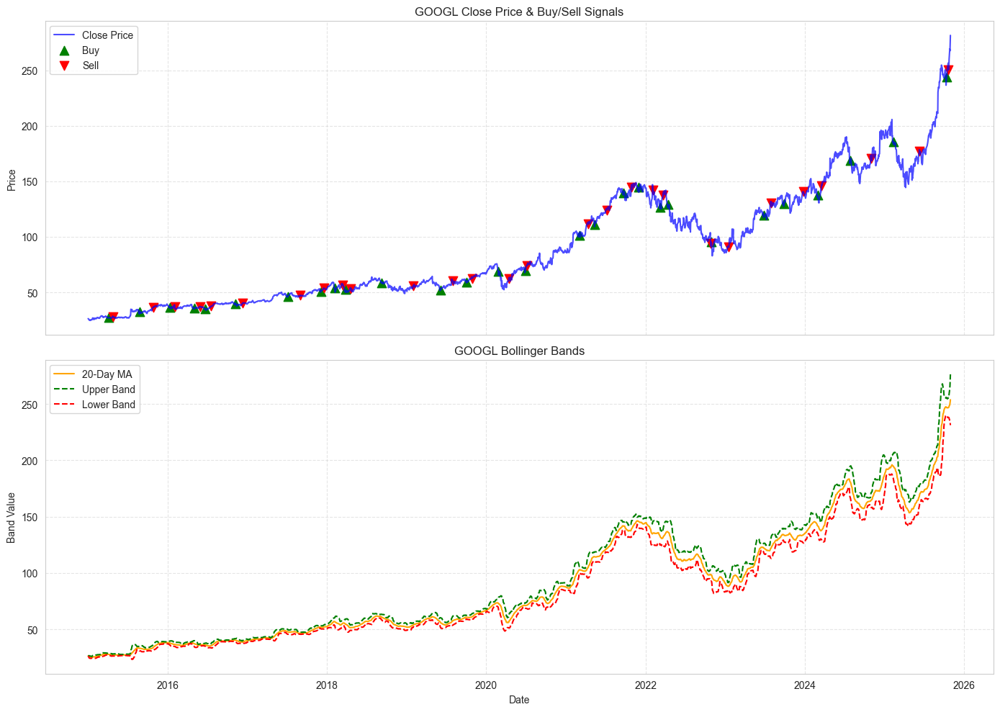

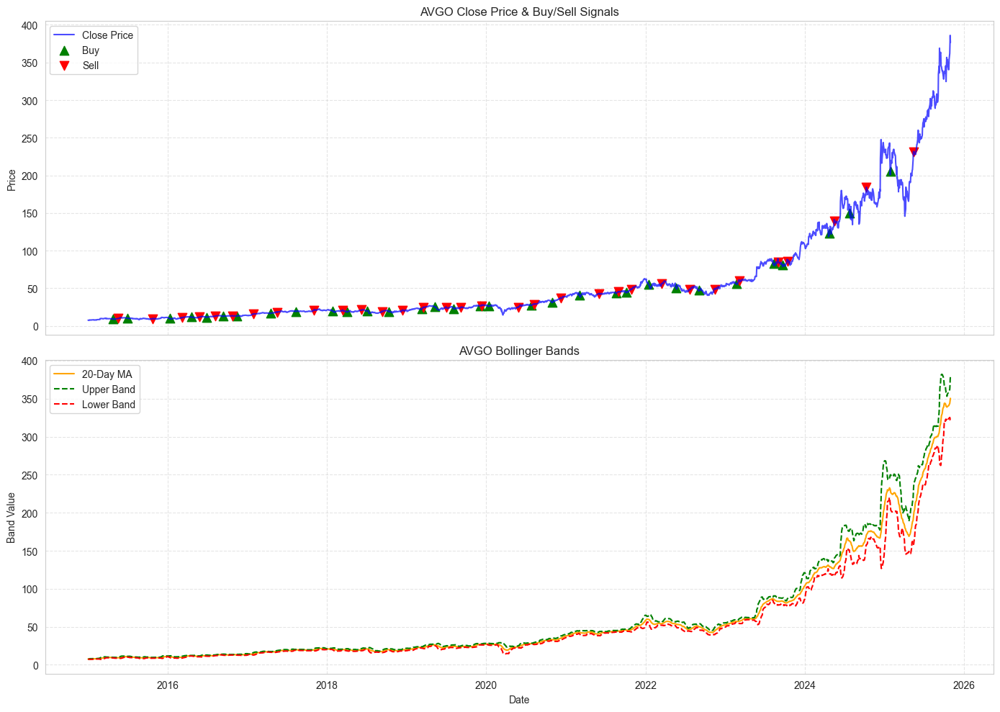

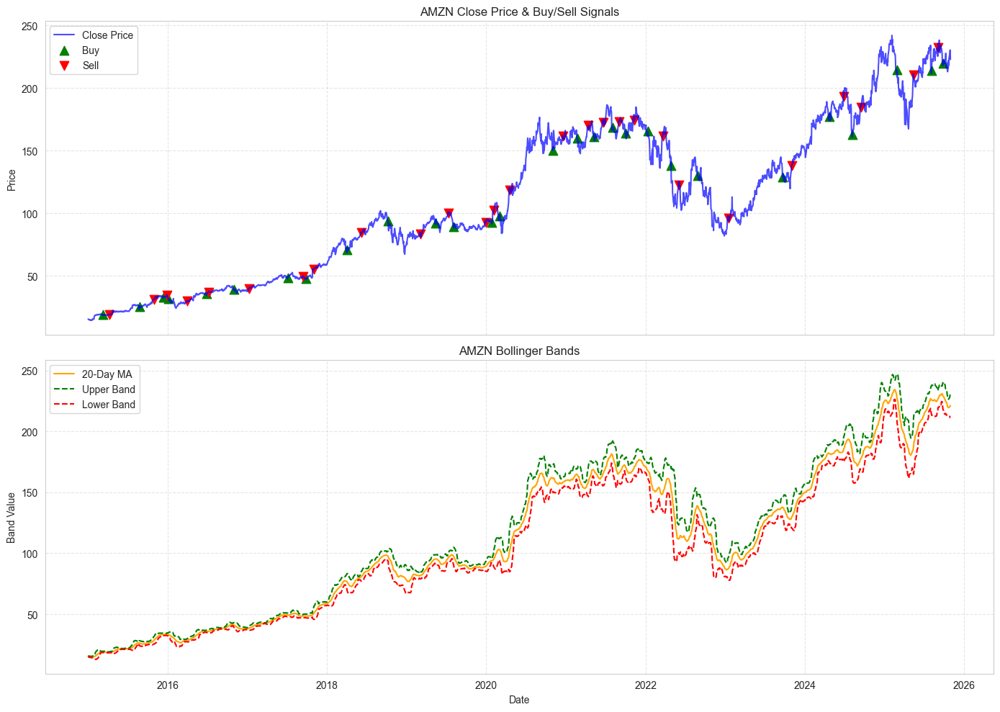

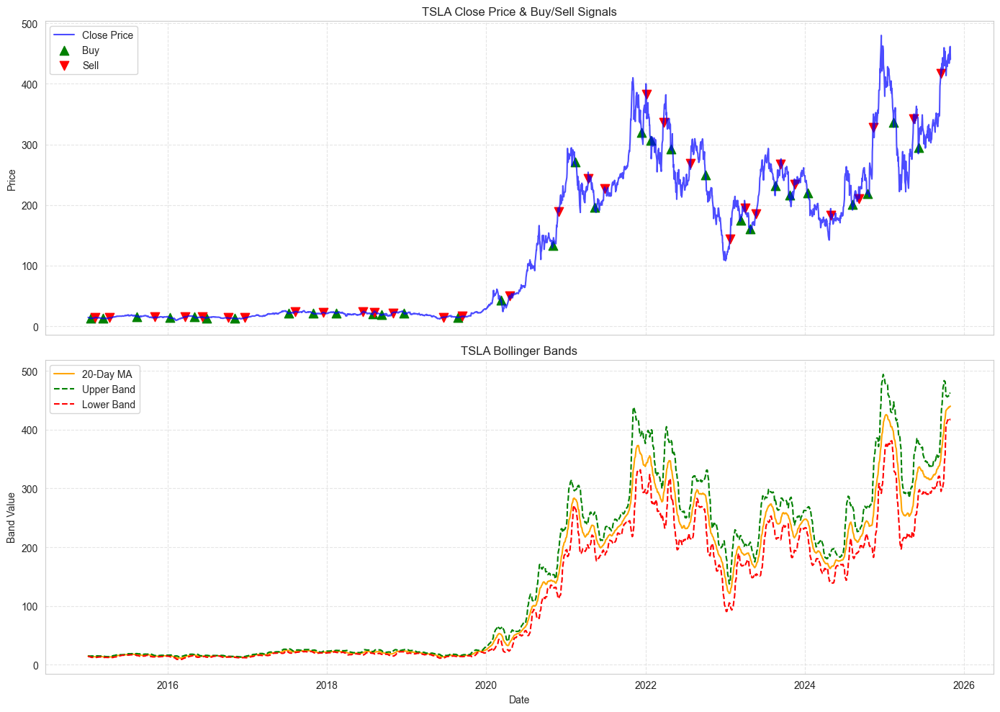

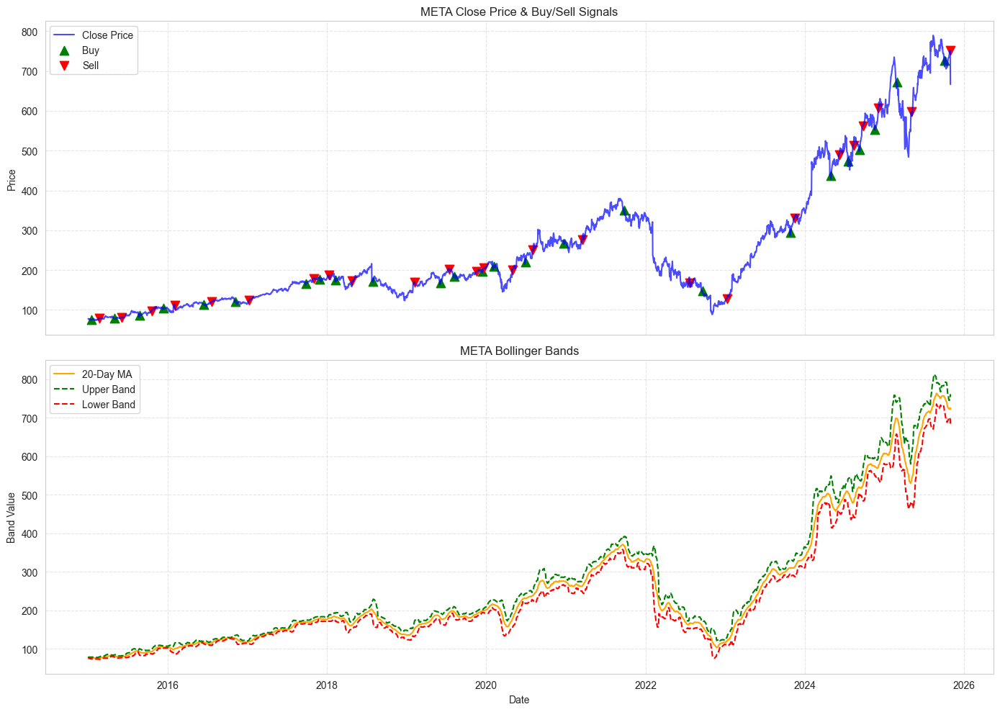

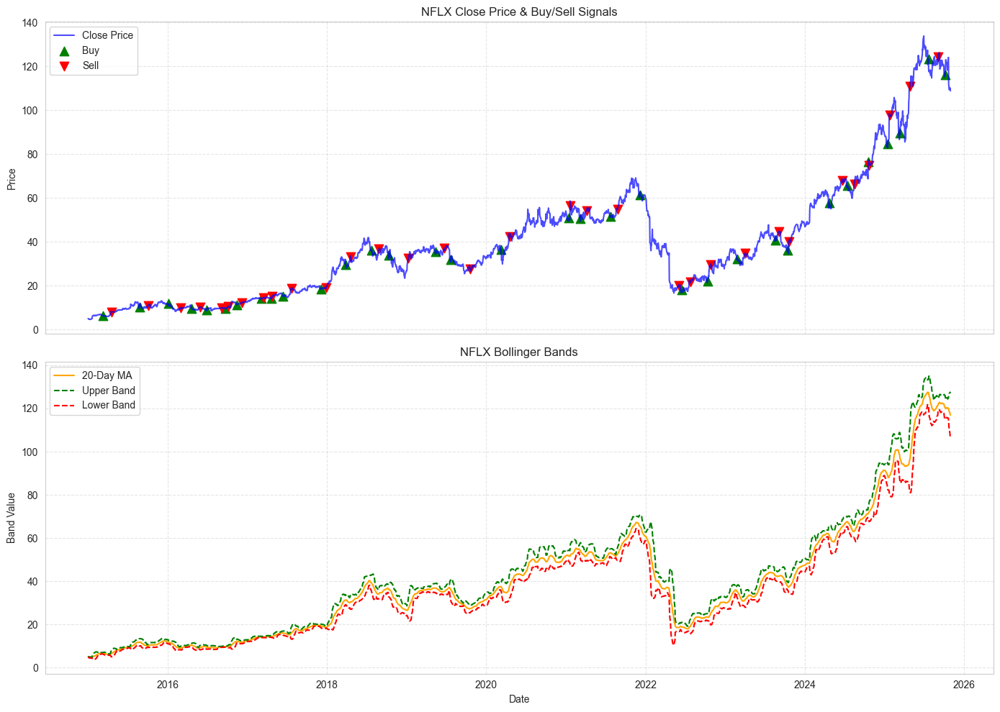

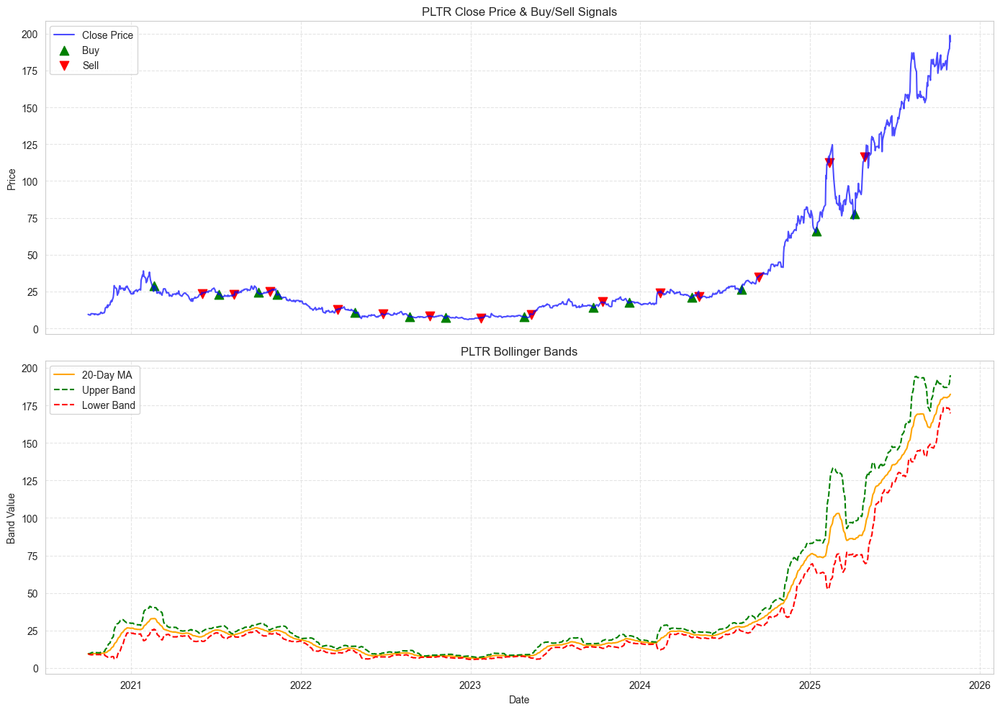

In [316]:
for ticker in bb_dict:
    stock_bb_plot = bb_dict[ticker].copy()
    buy_signals = stock_bb_plot[stock_bb_plot['Pos_Marker'] == 1]
    sell_signals = stock_bb_plot[stock_bb_plot['Pos_Marker'] == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Top subplot: Close price + buy/sell signals
    axs[0].plot(stock_bb_plot.index, stock_bb_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Close Price & Buy/Sell Signals")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Bottom subplot: Bollinger Bands only (MA, upper, lower)
    axs[1].plot(stock_bb_plot.index, stock_bb_plot['BB_MA'], label='20-Day MA', color='orange')
    axs[1].plot(stock_bb_plot.index, stock_bb_plot['BB_UP'], label='Upper Band', color='green', linestyle='--')
    axs[1].plot(stock_bb_plot.index, stock_bb_plot['BB_LOW'], label='Lower Band', color='red', linestyle='--')
    axs[1].set_ylabel("Band Value")
    axs[1].set_xlabel("Date")
    axs[1].set_title(f"{ticker} Bollinger Bands")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

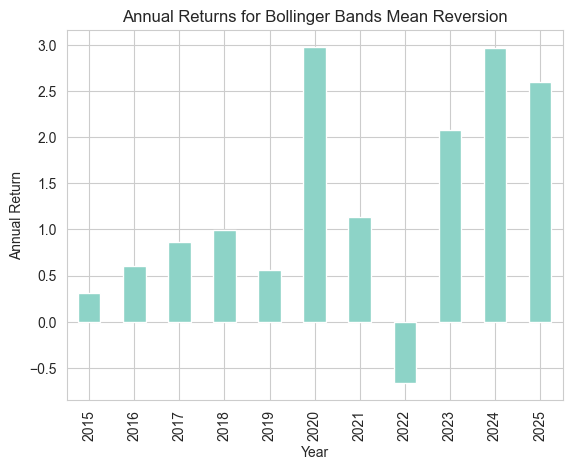

In [317]:
# Annual return plot for Bollinger Bands strategy
metrics_bb['Year'] = metrics_bb['Year']
annual_return_bb = metrics_bb.groupby(by='Year')['Standard Return'].prod()-1
annual_return_bb.plot(kind='bar')
plt.title("Annual Returns for Bollinger Bands Mean Reversion")
plt.xlabel("Year")
plt.ylabel("Annual Return")
plt.show()

In [318]:
# Summary table for Bollinger Bands strategy
bb_summary = pd.DataFrame({
    'Strategy': ['Bollinger Bands Mean Reversion'],
    'CAGR': [metrics_df_bb['CAGR'].mean()],
    'Total Return': [metrics_df_bb['Total Return'].mean()],
    'Volatility': [metrics_df_bb['Volatility'].mean()],
    'Max Drawdown': [metrics_df_bb['Max Drawdown'].mean()],
    'Sharpe Ratio': [metrics_df_bb['Sharpe Ratio'].mean()],
    'Win Rate (%)': [metrics_df_bb['Win Rate (%)'].mean()],
    'Profit Factor': [metrics_df_bb['Profit Factor'].mean()]
})
display(bb_summary)

,Strategy,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,Bollinger Bands Mean Reversion,0.010145,0.075304,2.088127,-0.643757,-0.008046,79.146691,4.413116


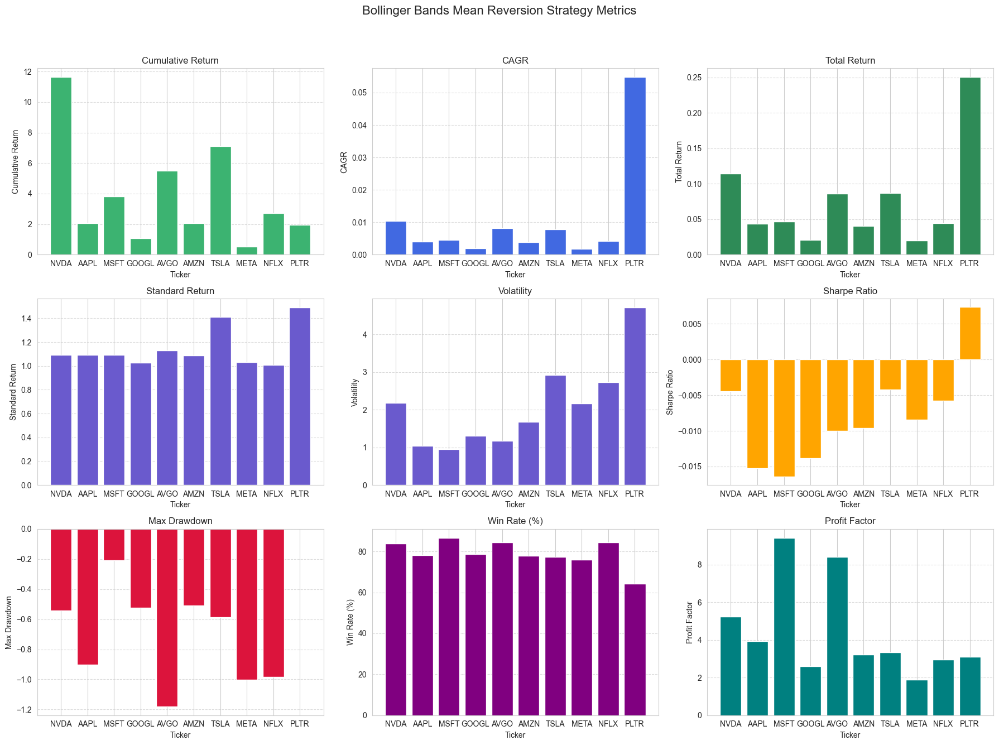

In [319]:
# Combined metrics plots for Bollinger Bands Mean Reversion Strategy

fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('Bollinger Bands Mean Reversion Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(metrics_df_bb['Ticker'], metrics_df_bb['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(metrics_df_bb['Ticker'], metrics_df_bb['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(metrics_df_bb['Ticker'], metrics_df_bb['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

#standard return by Ticker
axs[1, 0].bar(metrics_df_bb['Ticker'], metrics_df_bb['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

#volatility by Ticker
axs[1, 1].bar(metrics_df_bb['Ticker'], metrics_df_bb['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(metrics_df_bb['Ticker'], metrics_df_bb['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(metrics_df_bb['Ticker'], metrics_df_bb['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate by Ticker
axs[2, 1].bar(metrics_df_bb['Ticker'], metrics_df_bb['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(metrics_df_bb['Ticker'], metrics_df_bb['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [320]:
# bollinger vs mutual fund summary table
bb_summary_table = pd.concat([bb_summary, fund_summary], ignore_index=True)
bb_summary_table.set_index('Strategy', inplace=True)
display(bb_summary_table)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
Bollinger Bands Mean Reversion,0.010145,0.075304,2.088127,-0.643757,-0.008046,79.146691,4.413116
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


#### RSI Oversold/Overbought

In [321]:
# --- RSI generation: compute RSI, signals, pos markers and extract trades (compute step)
# Parameters
rsi_window = 14
rsi_oversold = 30
rsi_overbought = 70

rsi_all_trades = []
rsi_dict = {}

for ticker in holdings:
    print(f"Processing RSI for {ticker}...")
    try:
        stock_rsi = data[ticker][['Close']].dropna().copy()
        # Calculate RSI (Wilder's smoothing via ewm)
        delta = stock_rsi['Close'].diff()
        gain = delta.clip(lower=0)
        loss = -delta.clip(upper=0)
        avg_gain = gain.ewm(alpha=1/rsi_window, adjust=False).mean()
        avg_loss = loss.ewm(alpha=1/rsi_window, adjust=False).mean()
        rs = avg_gain / avg_loss.replace(0, np.nan)
        stock_rsi['RSI'] = 100 - (100 / (1 + rs))
        stock_rsi['RSI'] = stock_rsi['RSI'].fillna(50)

        # Signals: detect crossing back inside bands
        stock_rsi['Below_Oversold'] = stock_rsi['RSI'] < rsi_oversold
        stock_rsi['Above_Overbought'] = stock_rsi['RSI'] > rsi_overbought
        stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
        stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)

        stock_rsi['Position'] = 0
        # Buy when RSI was oversold yesterday and now rises back to >= oversold (reversion)
        stock_rsi.loc[(stock_rsi['Prev_Below_Oversold'] == True) & (stock_rsi['RSI'] >= rsi_oversold), 'Position'] = 1
        # Sell when RSI was overbought yesterday and now falls to <= overbought (reversion)
        stock_rsi.loc[(stock_rsi['Prev_Above_Overbought'] == True) & (stock_rsi['RSI'] <= rsi_overbought), 'Position'] = -1

        # Optional holding logic (hold until opposite signal)
        stock_rsi['Hold_Position'] = 0
        current = 0
        for idx, row in stock_rsi.iterrows():
            if row['Position'] == 1:
                current = 1
            elif row['Position'] == -1:
                current = -1
            stock_rsi.at[idx, 'Hold_Position'] = current

        # Convert hold changes to Pos_Marker (entry/exit markers compatible with calculate_trades)
        stock_rsi['Prev_Hold'] = stock_rsi['Hold_Position'].shift(1).fillna(0)
        stock_rsi['Pos_Marker'] = 0
        stock_rsi.loc[(stock_rsi['Prev_Hold'] != 1) & (stock_rsi['Hold_Position'] == 1), 'Pos_Marker'] = 1
        stock_rsi.loc[(stock_rsi['Prev_Hold'] == 1) & (stock_rsi['Hold_Position'] != 1), 'Pos_Marker'] = -1

        # Extract trades using the existing calculate_trades function
        trades = calculate_trades(pd.DataFrame({'Close': stock_rsi['Close'], 'Position': stock_rsi['Pos_Marker']}, index=stock_rsi.index))
        if not trades.empty:
            trades['Ticker'] = ticker
            rsi_all_trades.append(trades)

        # store stock frame for plotting later
        rsi_dict[ticker] = stock_rsi[['Close', 'RSI', 'Position', 'Hold_Position', 'Pos_Marker']].copy()

    except Exception as e:
        print(f"Skipping {ticker}, error: {e}")
        continue

# Collect into DataFrame
if rsi_all_trades:
    rsi_all_trades_df = pd.concat(rsi_all_trades, ignore_index=True)
    rsi_all_trades_df['Sell Date'] = pd.to_datetime(rsi_all_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
    rsi_all_trades_df['Buy Date'] = pd.to_datetime(rsi_all_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
    rsi_all_trades_df['Year'] = rsi_all_trades_df['Sell Date'].dt.year
else:
    rsi_all_trades_df = pd.DataFrame()

print('RSI generation complete — rsi_all_trades_df and rsi_ma_dict are available. Run the RSI metrics cell next.')

Processing RSI for NVDA...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for AAPL...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for MSFT...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for GOOGL...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for AVGO...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for AMZN...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for TSLA...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for META...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for NFLX...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


Processing RSI for PLTR...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Below_Oversold'] = stock_rsi['Below_Oversold'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3771535645.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_rsi['Prev_Above_Overbought'] = stock_rsi['Above_Overbought'].shift(1).fillna(False)


RSI generation complete — rsi_all_trades_df and rsi_ma_dict are available. Run the RSI metrics cell next.


In [322]:
#group by ticker and year to calculate annual metrics for breakout strategy
metrics_rsi = rsi_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\999651732.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_rsi = rsi_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [323]:
#calculate overall metrics for each ticker for breakout strategy
metrics_rows_rsi = []
for ticker in holdings:
    ticker_trades_rsi = rsi_all_trades_df[rsi_all_trades_df['Ticker'] == ticker]
    metrics_row_rsi = calculate_metrics(ticker_trades_rsi)
    metrics_rows_rsi.append(metrics_row_rsi)
metrics_df_rsi = pd.concat(metrics_rows_rsi, ignore_index=True)

# 9. Display or plot results as needed
print(metrics_rsi.head())
print(metrics_df_rsi.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2015  5.268727      0.174470         1.174470           0.174470   
1   AAPL  2016 -0.022058     -0.023237         1.110034          -0.030722   
2   AAPL  2017  0.966245      0.113341         1.113341           0.113341   
3   AAPL  2018  0.767249      0.163256         1.163256           0.163256   
4   AAPL  2019  0.223904      0.203595         1.359465           0.424151   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0         NaN           0.0           NaN         100.0            NaN  
1    2.658493          -0.0     -0.015820          50.0       0.867755  
2         NaN           0.0           NaN         100.0            NaN  
3         NaN           0.0           NaN         100.0            NaN  
4    3.500878           0.0      0.058244         100.0            NaN  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015 

In [324]:
metrics_rsi.sort_values(by=['Ticker', 'Year'], inplace=True)
metrics_rsi.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,5.268727,0.174470,1.174470,0.174470,NaN,0.0,NaN,100.0,NaN
1,AAPL,2016,-0.022058,-0.023237,1.110034,-0.030722,2.658493,-0.0,-0.015820,50.0,0.867755
2,AAPL,2017,0.966245,0.113341,1.113341,0.113341,NaN,0.0,NaN,100.0,NaN
3,AAPL,2018,0.767249,0.163256,1.163256,0.163256,NaN,0.0,NaN,100.0,NaN
4,AAPL,2019,0.223904,0.203595,1.359465,0.424151,3.500878,0.0,0.058244,100.0,NaN


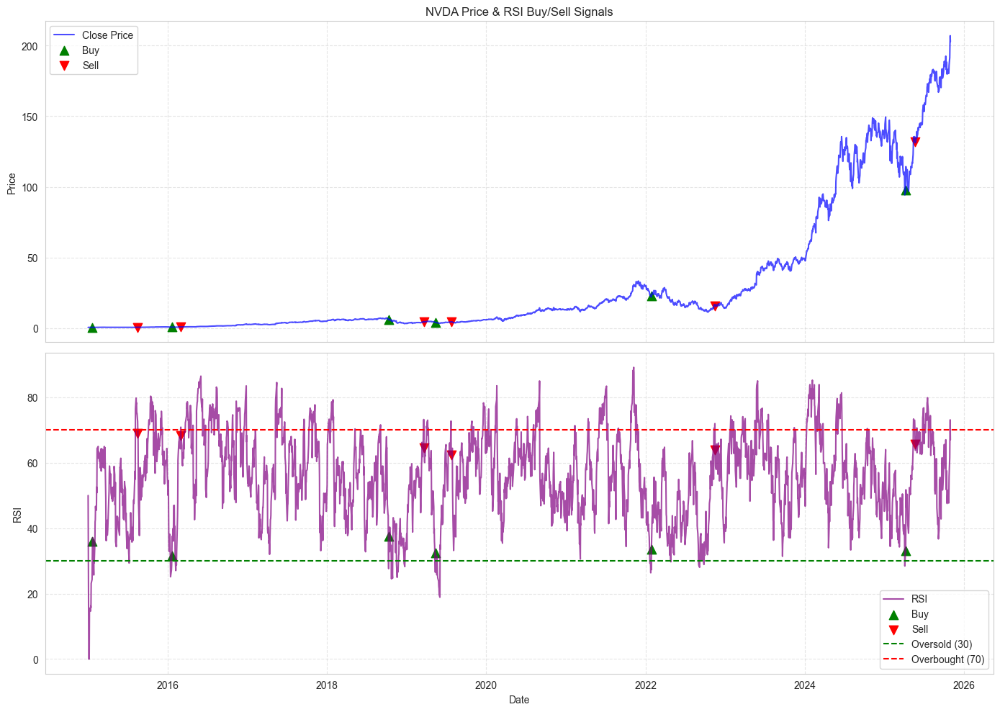

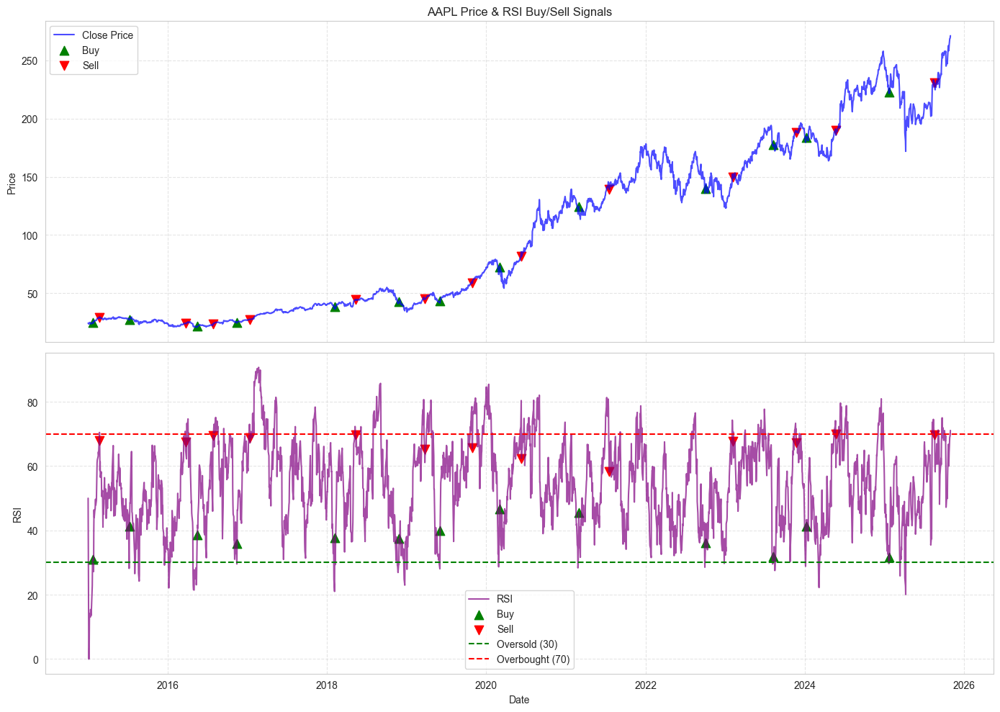

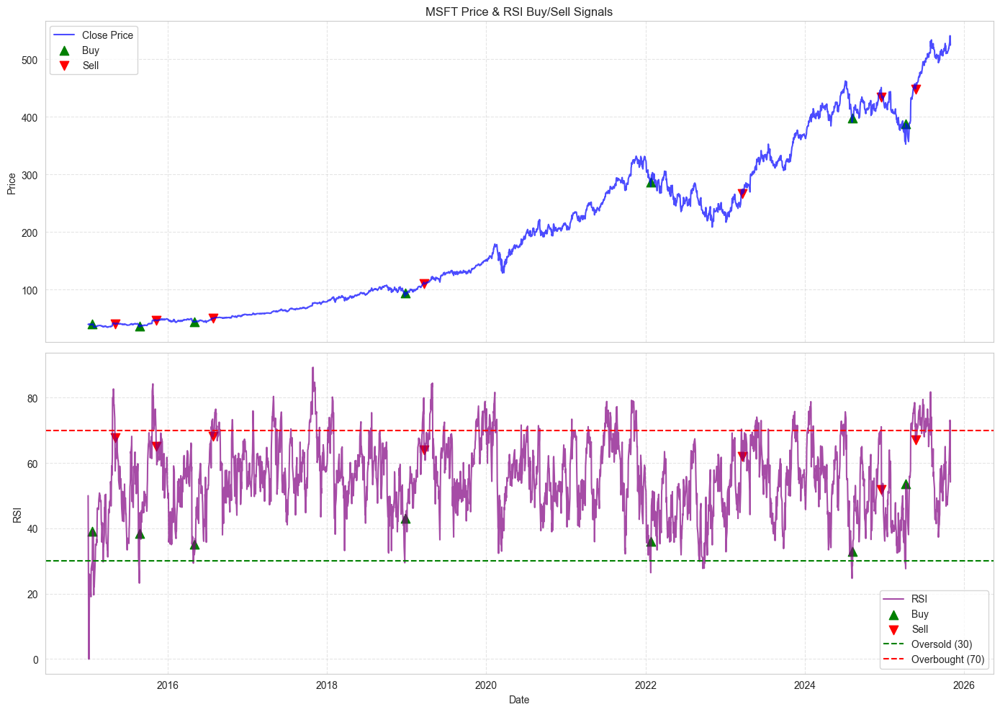

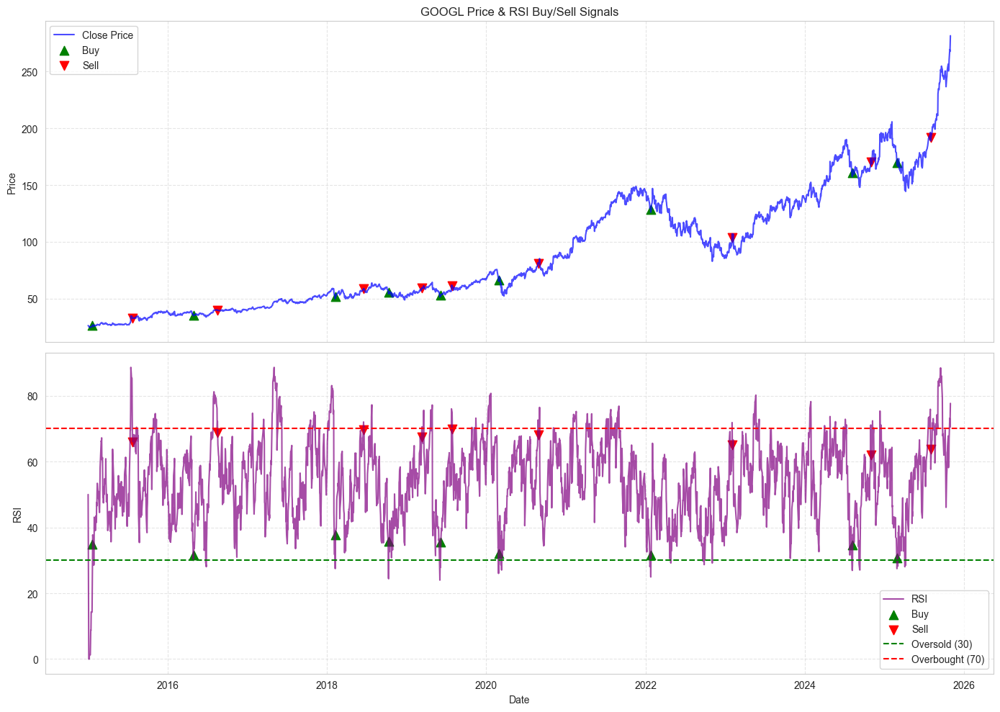

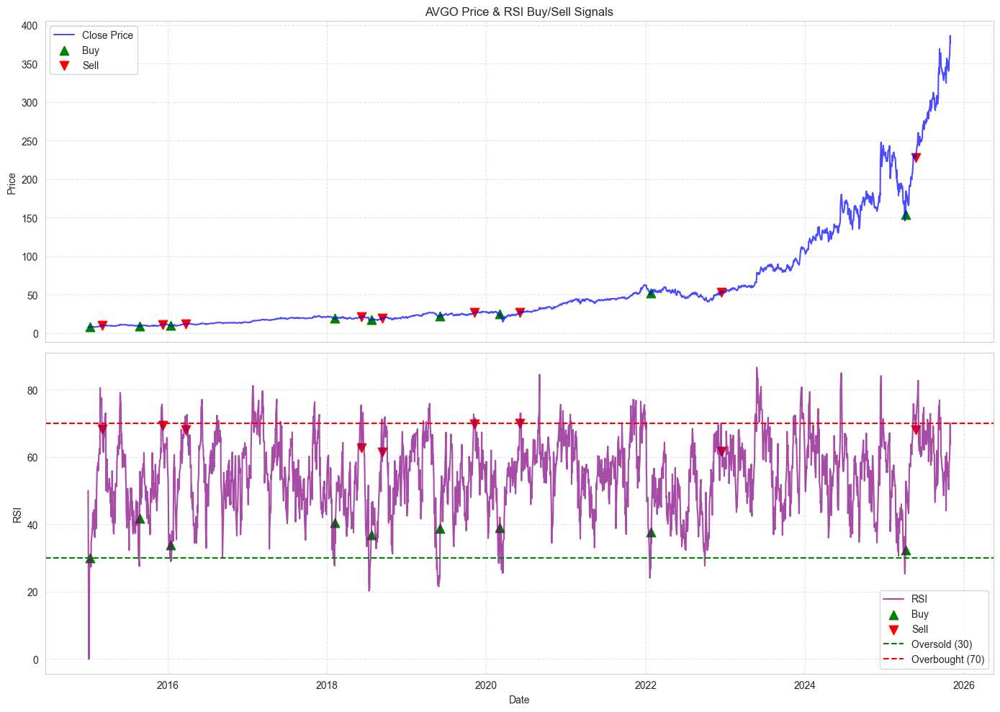

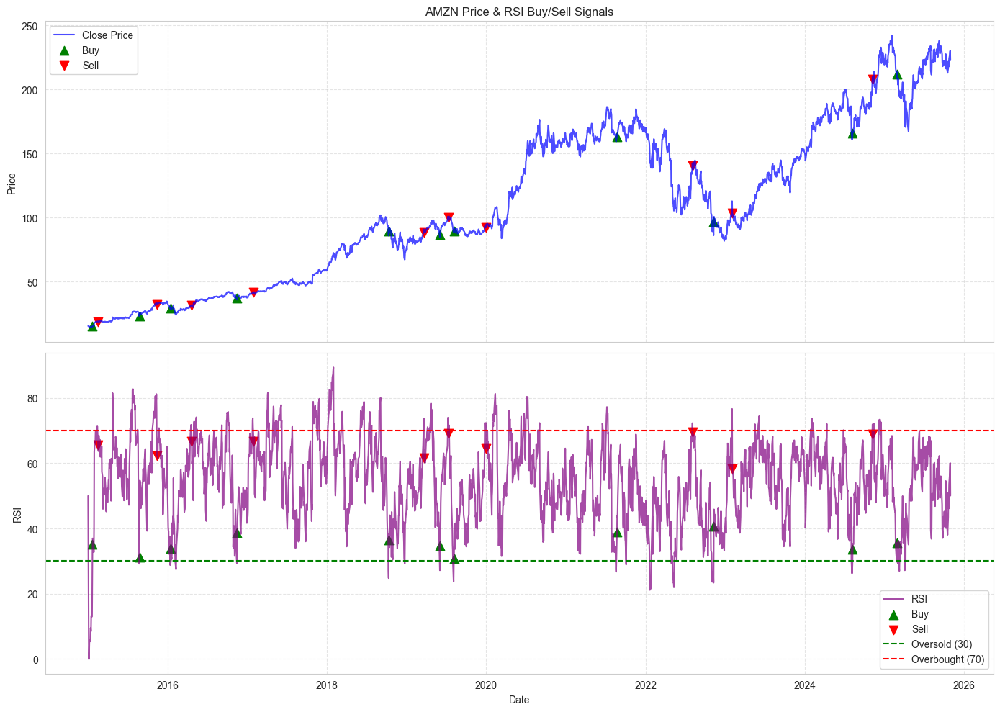

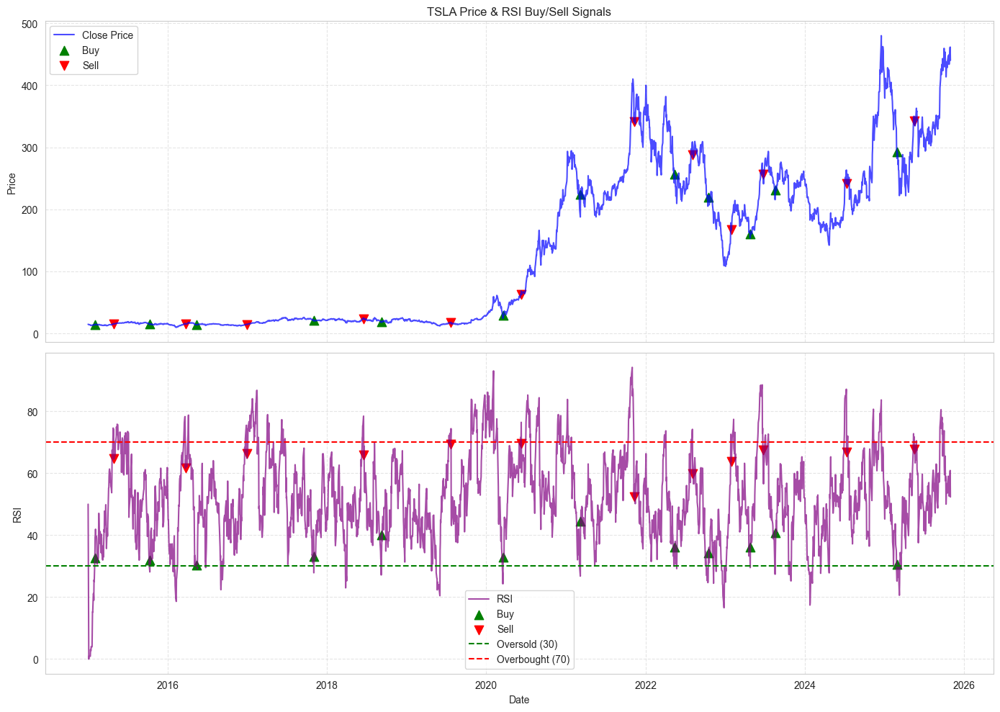

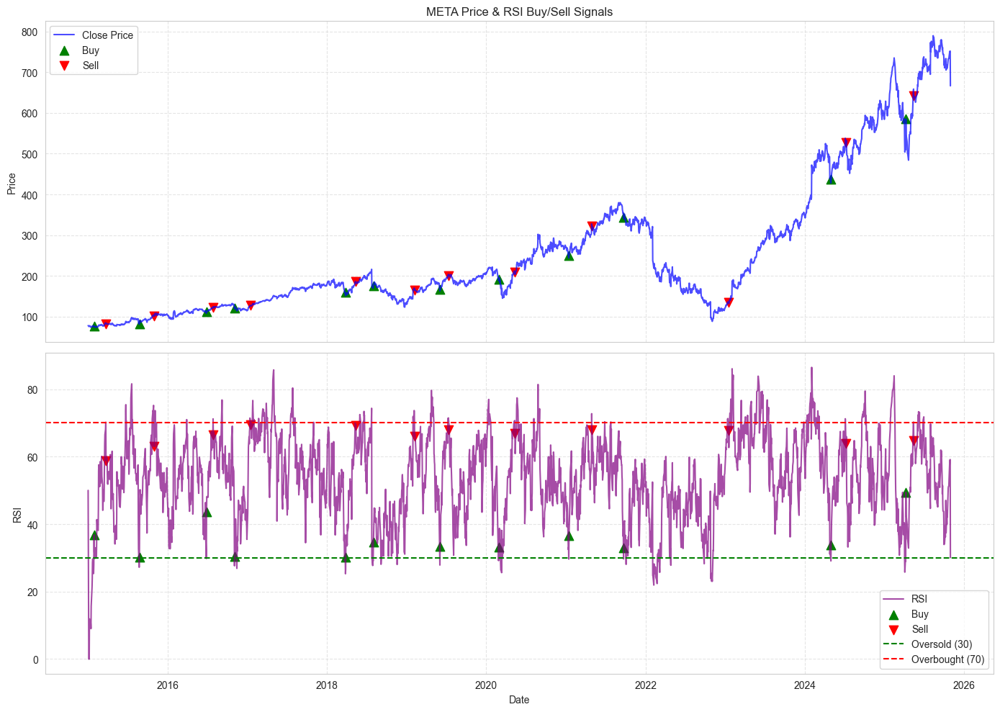

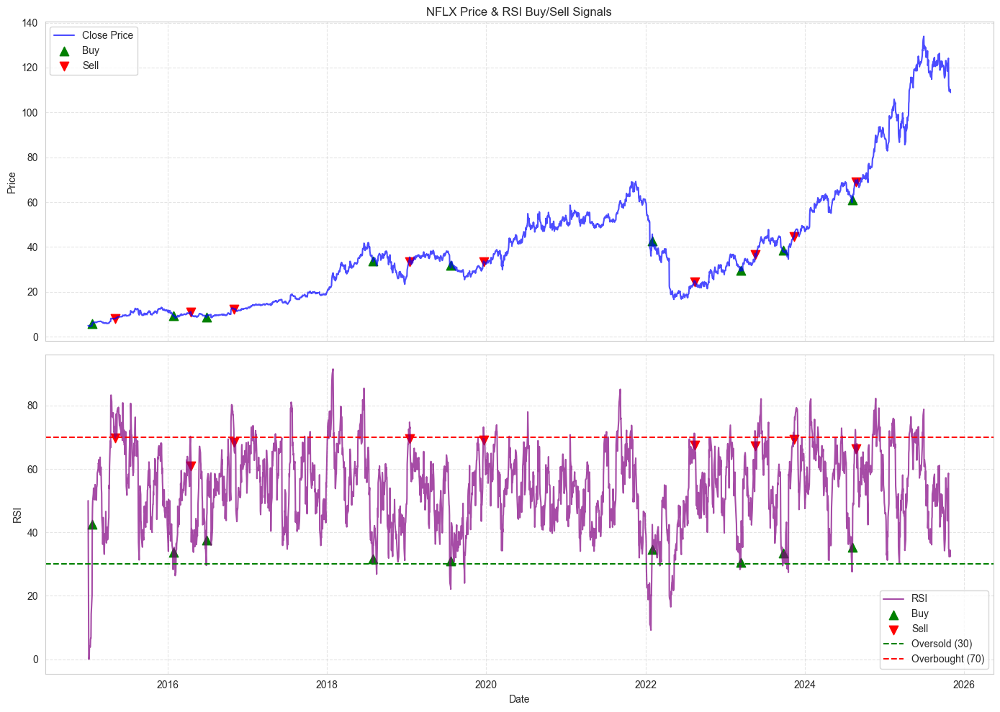

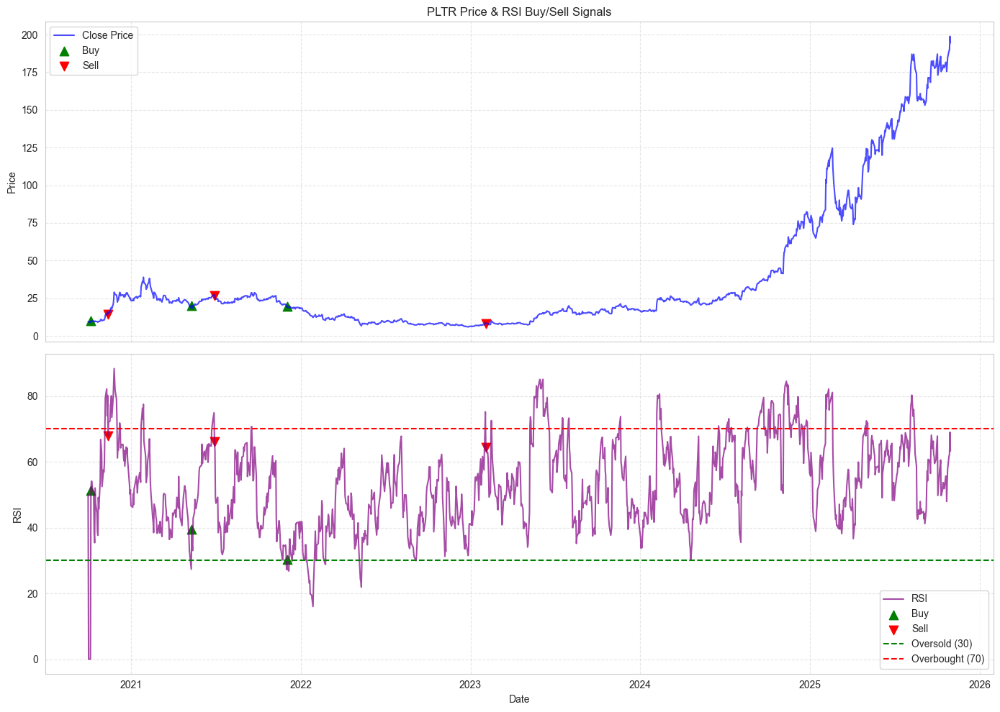

In [325]:
for ticker in rsi_dict:
    stock_rsi_plot = rsi_dict[ticker].copy()
    buy_signals = stock_rsi_plot[stock_rsi_plot['Pos_Marker'] == 1]
    sell_signals = stock_rsi_plot[stock_rsi_plot['Pos_Marker'] == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Price plot
    axs[0].plot(stock_rsi_plot.index, stock_rsi_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Price & RSI Buy/Sell Signals")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # RSI plot
    axs[1].plot(stock_rsi_plot.index, stock_rsi_plot['RSI'], label='RSI', color='purple', alpha=0.7)
    axs[1].scatter(buy_signals.index, buy_signals['RSI'], marker='^', color='green', label='Buy', s=80)
    axs[1].scatter(sell_signals.index, sell_signals['RSI'], marker='v', color='red', label='Sell', s=80)
    axs[1].axhline(30, color='green', linestyle='--', label='Oversold (30)')
    axs[1].axhline(70, color='red', linestyle='--', label='Overbought (70)')
    axs[1].set_ylabel("RSI")
    axs[1].set_xlabel("Date")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

In [326]:
metrics_rsi.sort_values(by=['Ticker', 'Year'], inplace=True)
metrics_rsi.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,5.268727,0.174470,1.174470,0.174470,NaN,0.0,NaN,100.0,NaN
1,AAPL,2016,-0.022058,-0.023237,1.110034,-0.030722,2.658493,-0.0,-0.015820,50.0,0.867755
2,AAPL,2017,0.966245,0.113341,1.113341,0.113341,NaN,0.0,NaN,100.0,NaN
3,AAPL,2018,0.767249,0.163256,1.163256,0.163256,NaN,0.0,NaN,100.0,NaN
4,AAPL,2019,0.223904,0.203595,1.359465,0.424151,3.500878,0.0,0.058244,100.0,NaN


In [327]:
#calculate overall metrics for each ticker for breakout strategy
metrics_rows_rsi = []
for ticker in holdings:
    ticker_trades_rsi = rsi_all_trades_df[rsi_all_trades_df['Ticker'] == ticker]
    metrics_row_rsi = calculate_metrics(ticker_trades_rsi)
    metrics_rows_rsi.append(metrics_row_rsi)
metrics_df_rsi = pd.concat(metrics_rows_rsi, ignore_index=True)

# 9. Display or plot results as needed
print(metrics_rsi.head())
print(metrics_df_rsi.head())


  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2015  5.268727      0.174470         1.174470           0.174470   
1   AAPL  2016 -0.022058     -0.023237         1.110034          -0.030722   
2   AAPL  2017  0.966245      0.113341         1.113341           0.113341   
3   AAPL  2018  0.767249      0.163256         1.163256           0.163256   
4   AAPL  2019  0.223904      0.203595         1.359465           0.424151   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0         NaN           0.0           NaN         100.0            NaN  
1    2.658493          -0.0     -0.015820          50.0       0.867755  
2         NaN           0.0           NaN         100.0            NaN  
3         NaN           0.0           NaN         100.0            NaN  
4    3.500878           0.0      0.058244         100.0            NaN  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015 

In [328]:

metrics_rsi.sort_values(by=['Ticker', 'Year'], inplace=True)
metrics_rsi.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,5.268727,0.174470,1.174470,0.174470,NaN,0.0,NaN,100.0,NaN
1,AAPL,2016,-0.022058,-0.023237,1.110034,-0.030722,2.658493,-0.0,-0.015820,50.0,0.867755
2,AAPL,2017,0.966245,0.113341,1.113341,0.113341,NaN,0.0,NaN,100.0,NaN
3,AAPL,2018,0.767249,0.163256,1.163256,0.163256,NaN,0.0,NaN,100.0,NaN
4,AAPL,2019,0.223904,0.203595,1.359465,0.424151,3.500878,0.0,0.058244,100.0,NaN


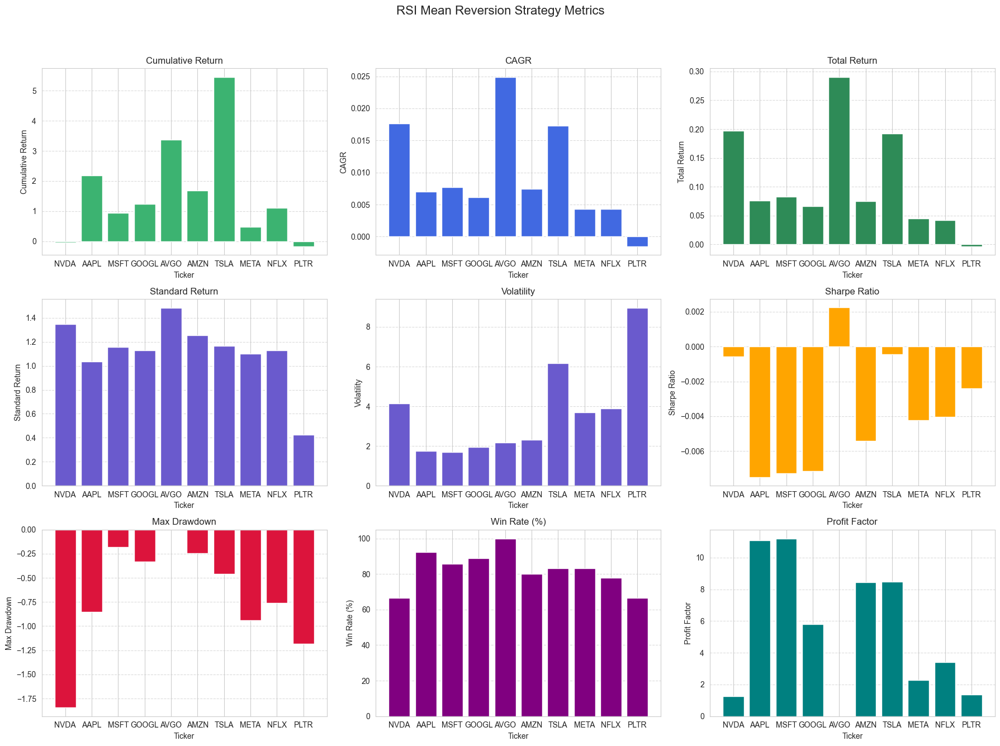

In [329]:
fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('RSI Mean Reversion Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Standard Return by Ticker
axs[1, 0].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Volatility by Ticker
axs[1, 1].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate (%) by Ticker
axs[2, 1].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(metrics_df_rsi['Ticker'], metrics_df_rsi['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [330]:
# Summary table for Bollinger Bands strategy
rsi_summary = pd.DataFrame({
    'Strategy': ['RSI Oversold/Overbought'],
    'CAGR': [metrics_df_rsi['CAGR'].mean()],
    'Total Return': [metrics_df_rsi['Total Return'].mean()],
    'Volatility': [metrics_df_rsi['Volatility'].mean()],
    'Max Drawdown': [metrics_df_rsi['Max Drawdown'].mean()],
    'Sharpe Ratio': [metrics_df_rsi['Sharpe Ratio'].mean()],
    'Win Rate (%)': [metrics_df_rsi['Win Rate (%)'].mean()],
    'Profit Factor': [metrics_df_rsi['Profit Factor'].mean()]
})
display(rsi_summary)

,Strategy,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,RSI Oversold/Overbought,0.009509,0.106488,3.672679,-0.678637,-0.00368,82.468864,5.924726


In [331]:
# rsi vs mutual fund summary table
rsi_summary_table = pd.concat([rsi_summary, fund_summary], ignore_index=True)
rsi_summary_table.set_index('Strategy', inplace=True)
display(rsi_summary_table)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
RSI Oversold/Overbought,0.009509,0.106488,3.672679,-0.678637,-0.00368,82.468864,5.924726
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.64921,54.582485,1.156475


### Moving Average Envelope Reversal Strategy

In [332]:
# --- Moving Average Envelope Reversal: compute MA, envelopes, signals, pos markers and extract trades ---

# Parameters for MA Envelope
env_window = 20          # length of moving average
env_pct    = 0.02        # 2% envelope width (±2%)

env_all_trades = []
env_dict = {}

for ticker in holdings:
    print(f"Processing MA Envelope Reversal for {ticker}...")
    try:
        # base price series
        stock_env = data[ticker][['Close']].dropna().copy()

        # 1) Compute moving average and envelope bands
        stock_env['MA']       = stock_env['Close'].rolling(window=env_window, min_periods=env_window).mean()
        stock_env['Env_Up']   = stock_env['MA'] * (1 + env_pct)
        stock_env['Env_Down'] = stock_env['MA'] * (1 - env_pct)

        # Drop early rows where MA is NaN
        stock_env = stock_env.dropna(subset=['MA'])

        # 2) Define conditions: price below lower band / above upper band
        stock_env['Below_Lower']  = stock_env['Close'] < stock_env['Env_Down']
        stock_env['Above_Upper']  = stock_env['Close'] > stock_env['Env_Up']
        stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
        stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)

        # 3) Reversal signals
        stock_env['Position'] = 0

        # Buy when price was below lower band yesterday and comes back inside today
        stock_env.loc[
            (stock_env['Prev_Below_Lower'] == True) & (stock_env['Close'] >= stock_env['Env_Down']),
            'Position'
        ] = 1

        # Sell when price was above upper band yesterday and comes back inside today
        stock_env.loc[
            (stock_env['Prev_Above_Upper'] == True) & (stock_env['Close'] <= stock_env['Env_Up']),
            'Position'
        ] = -1

        # 4) Optional holding logic: stay long until an exit signal
        stock_env['Hold_Position'] = 0
        current = 0
        for idx, row in stock_env.iterrows():
            if row['Position'] == 1:
                current = 1          # enter / stay long
            elif row['Position'] == -1:
                current = 0          # exit to flat on sell signal
            stock_env.at[idx, 'Hold_Position'] = current

        # 5) Convert hold changes into Pos_Marker for calculate_trades
        stock_env['Prev_Hold'] = stock_env['Hold_Position'].shift(1).fillna(0)
        stock_env['Pos_Marker'] = 0
        # Entry: go from 0 to 1
        stock_env.loc[
            (stock_env['Prev_Hold'] != 1) & (stock_env['Hold_Position'] == 1),
            'Pos_Marker'
        ] = 1
        # Exit: go from 1 to 0
        stock_env.loc[
            (stock_env['Prev_Hold'] == 1) & (stock_env['Hold_Position'] != 1),
            'Pos_Marker'
        ] = -1

        # 6) Extract trades using existing calculate_trades
        trades = calculate_trades(
            pd.DataFrame(
                {'Close': stock_env['Close'], 'Position': stock_env['Pos_Marker']},
                index=stock_env.index
            )
        )
        if not trades.empty:
            trades['Ticker'] = ticker
            env_all_trades.append(trades)

        # 7) Store full frame for plotting later
        env_dict[ticker] = stock_env[[
            'Close', 'MA', 'Env_Up', 'Env_Down',
            'Position', 'Hold_Position', 'Pos_Marker'
        ]].copy()

    except Exception as e:
        print(f"Skipping {ticker}, error: {e}")
        continue

# 8) Collect all trades into a DataFrame
if env_all_trades:
    env_all_trades_df = pd.concat(env_all_trades, ignore_index=True)
    env_all_trades_df['Sell Date'] = pd.to_datetime(env_all_trades_df['Sell Date'],
                                                    format='%d-%m-%Y', errors='coerce')
    env_all_trades_df['Buy Date']  = pd.to_datetime(env_all_trades_df['Buy Date'],
                                                    format='%d-%m-%Y', errors='coerce')
    env_all_trades_df['Year'] = env_all_trades_df['Sell Date'].dt.year
else:
    env_all_trades_df = pd.DataFrame()

print("MA Envelope Reversal generation complete — env_all_trades_df and env_ma_dict are available. Run the Envelope metrics cell next.")


Processing MA Envelope Reversal for NVDA...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for AAPL...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for MSFT...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for GOOGL...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for AVGO...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for AMZN...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for TSLA...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for META...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for NFLX...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


Processing MA Envelope Reversal for PLTR...


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Below_Lower'] = stock_env['Below_Lower'].shift(1).fillna(False)
C:\Users\satya\AppData\Local\Temp\ipykernel_29152\84745501.py:28: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  stock_env['Prev_Above_Upper'] = stock_env['Above_Upper'].shift(1).fillna(False)


MA Envelope Reversal generation complete — env_all_trades_df and env_ma_dict are available. Run the Envelope metrics cell next.


In [333]:
#group by ticker and year to calculate annual metrics for breakout strategy
metrics_env = env_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\820277672.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metrics_env = env_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [334]:
#calculate overall metrics for each ticker for breakout strategy
metrics_rows_env = []
for ticker in holdings:
    ticker_trades_env = env_all_trades_df[env_all_trades_df['Ticker'] == ticker]
    metrics_row_env = calculate_metrics(ticker_trades_env)
    metrics_rows_env.append(metrics_row_env)
metrics_df_env = pd.concat(metrics_rows_env, ignore_index=True)

# 9. Display or plot results as needed
print(metrics_env.head())
print(metrics_df_env.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2015  0.001690      0.001101         1.058583           0.005459   
1   AAPL  2016 -0.001325     -0.001480         1.053005          -0.008084   
2   AAPL  2017  0.068545      0.020723         1.009710           0.042460   
3   AAPL  2018  0.132393      0.054179         1.020912           0.236708   
4   AAPL  2019 -0.097595     -0.082437         1.000444          -0.240732   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0    0.830600     -2.048993     -0.022044     60.000000       1.115950  
1    1.590959     -0.000000     -0.013404     80.000000       1.079371  
2    0.255090      0.000000      0.190307    100.000000            NaN  
3    0.858333      0.000000      0.130943    100.000000            NaN  
4    3.344851     -0.000000     -0.035157     66.666667       0.312968  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015 

In [335]:
metrics_env.sort_values(by=['Ticker', 'Year'], inplace=True)
metrics_env.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,0.001690,0.001101,1.058583,0.005459,0.830600,-2.048993,-0.022044,60.000000,1.115950
1,AAPL,2016,-0.001325,-0.001480,1.053005,-0.008084,1.590959,-0.000000,-0.013404,80.000000,1.079371
2,AAPL,2017,0.068545,0.020723,1.009710,0.042460,0.255090,0.000000,0.190307,100.000000,NaN
3,AAPL,2018,0.132393,0.054179,1.020912,0.236708,0.858333,0.000000,0.130943,100.000000,NaN
4,AAPL,2019,-0.097595,-0.082437,1.000444,-0.240732,3.344851,-0.000000,-0.035157,66.666667,0.312968


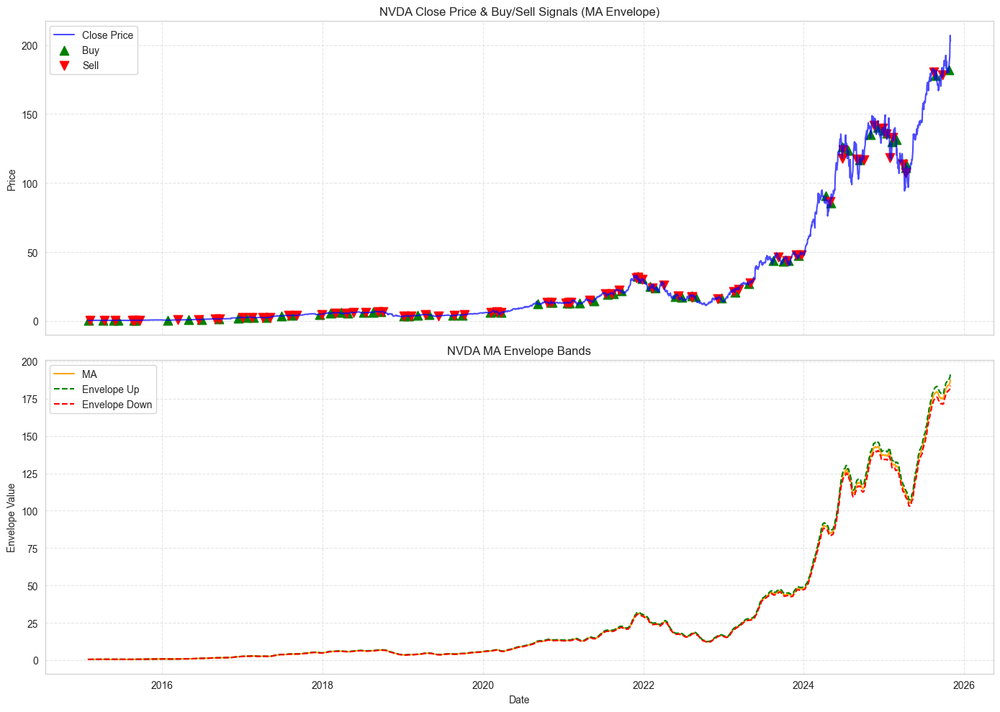

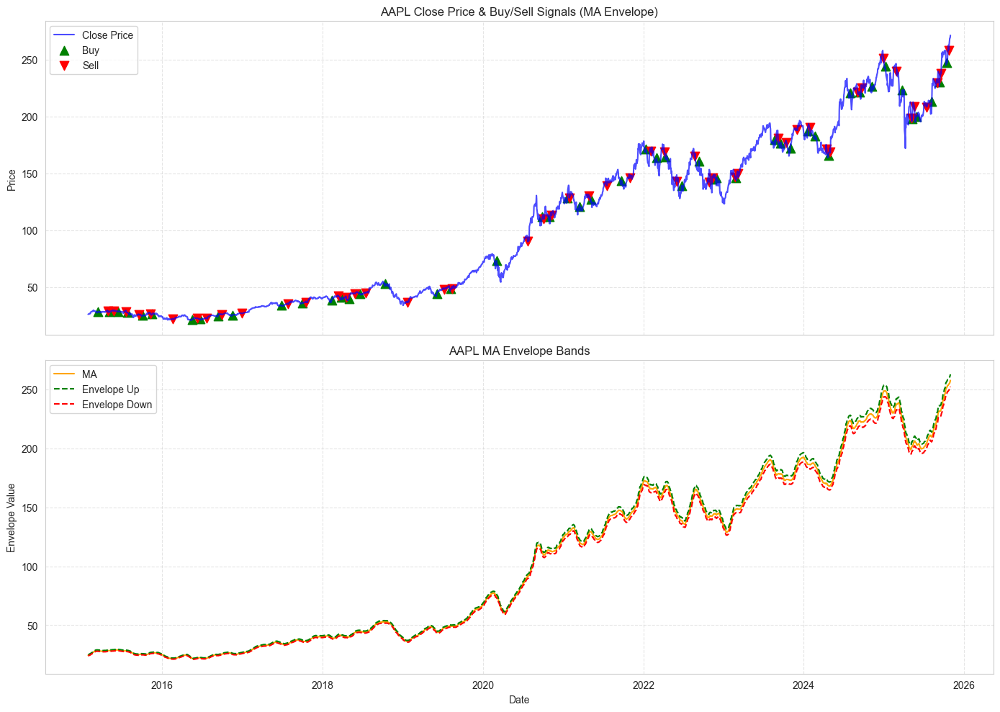

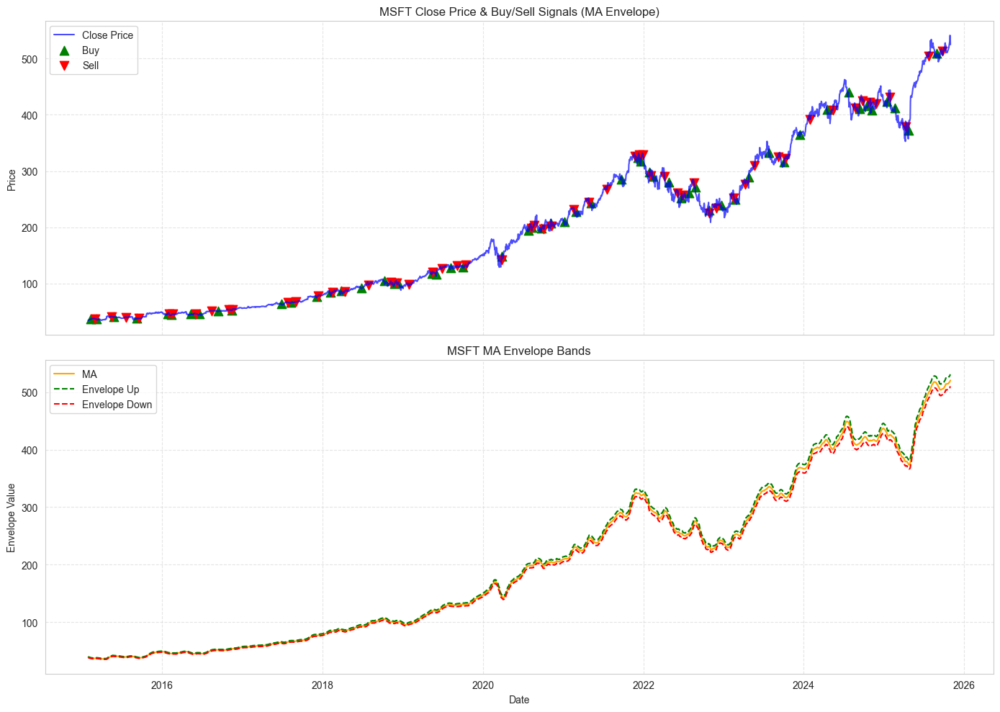

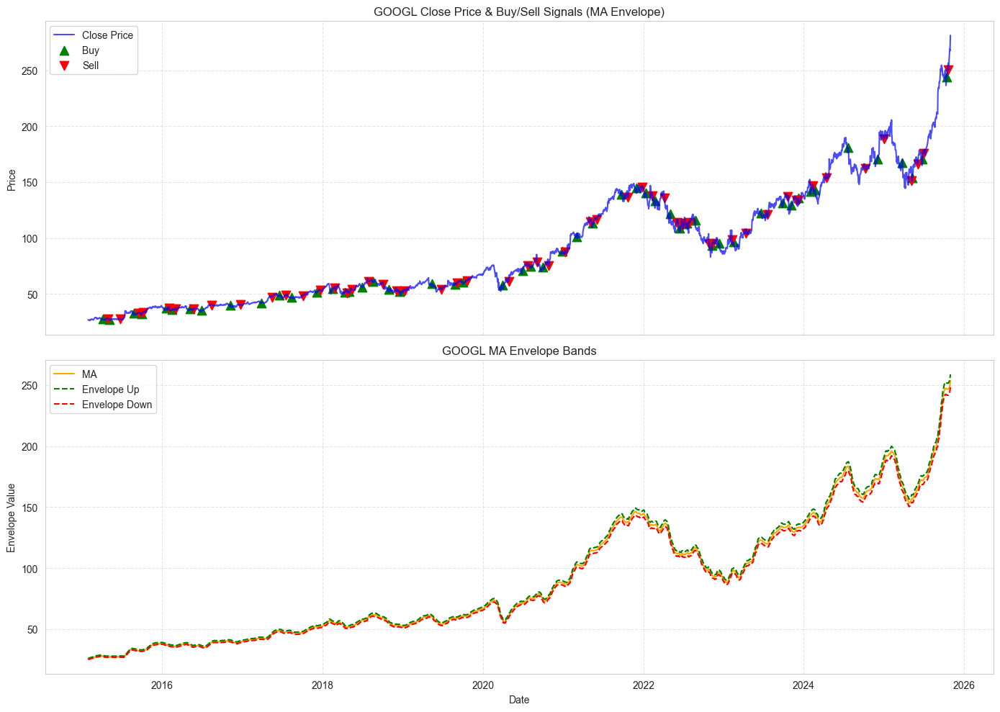

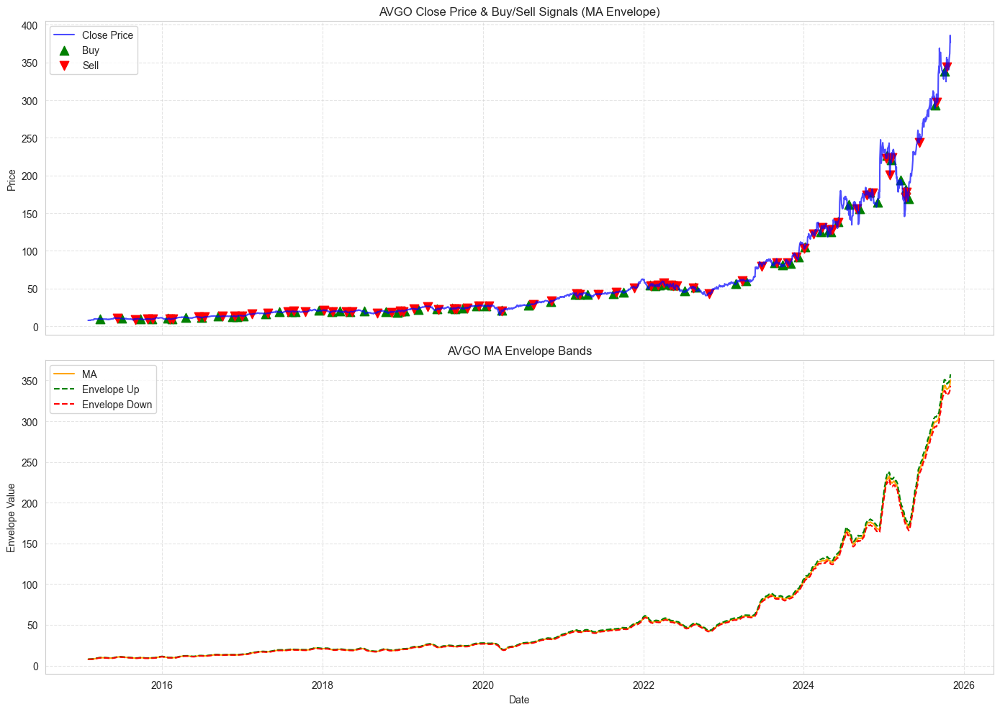

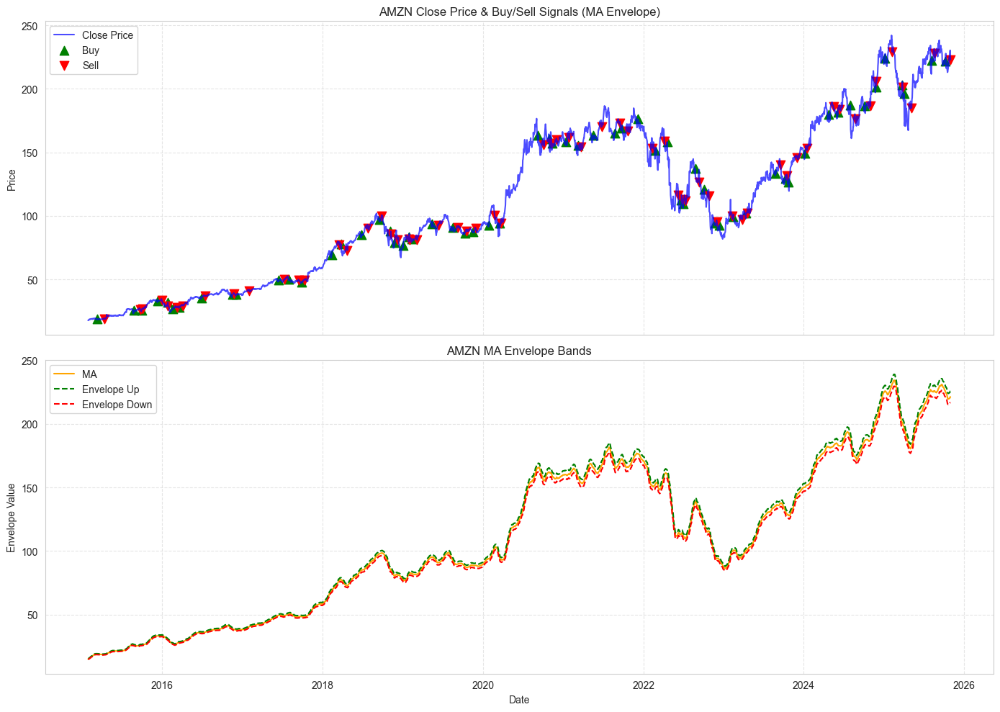

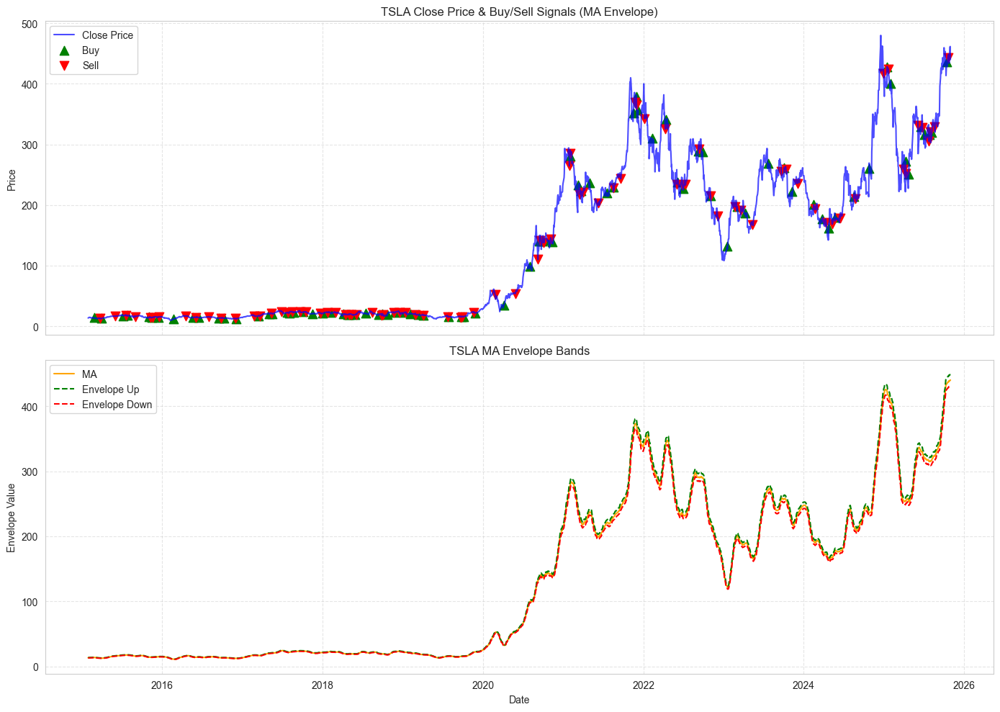

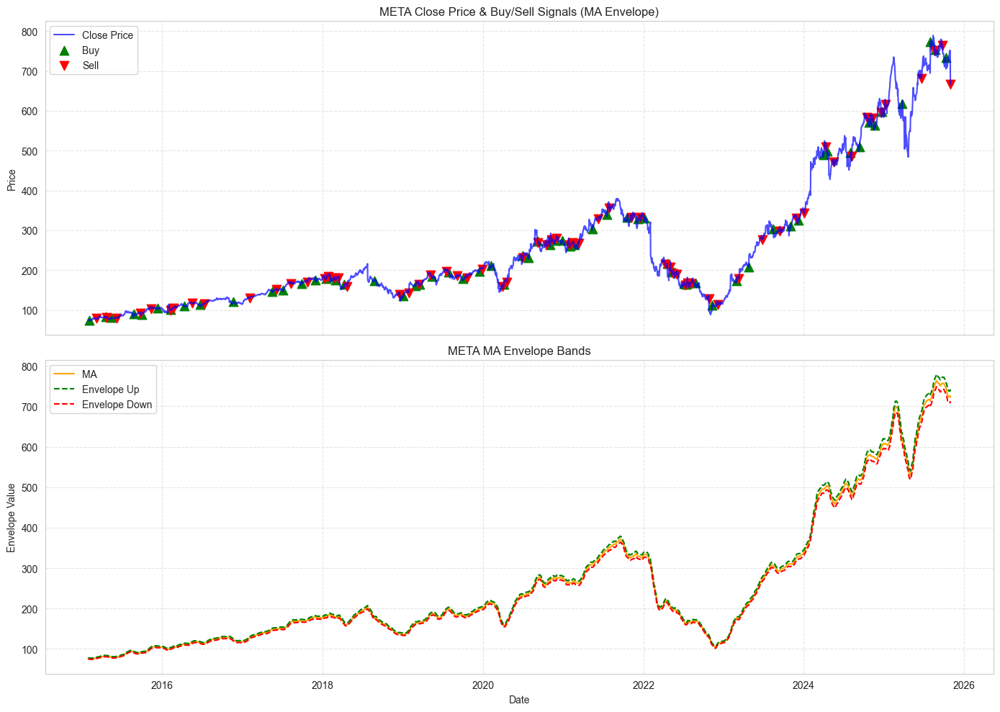

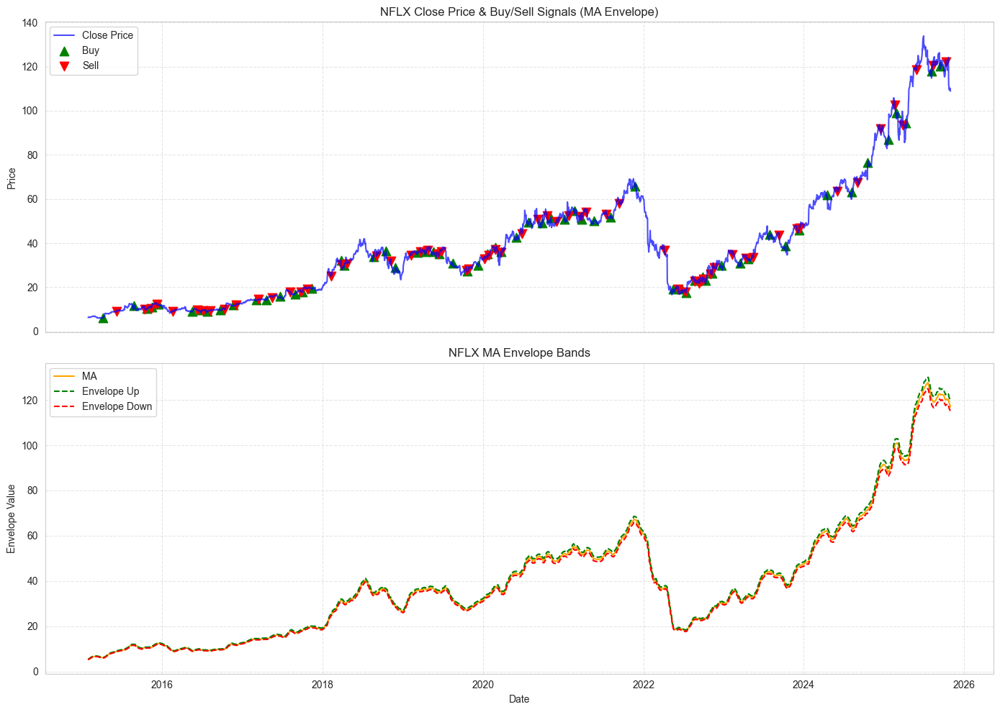

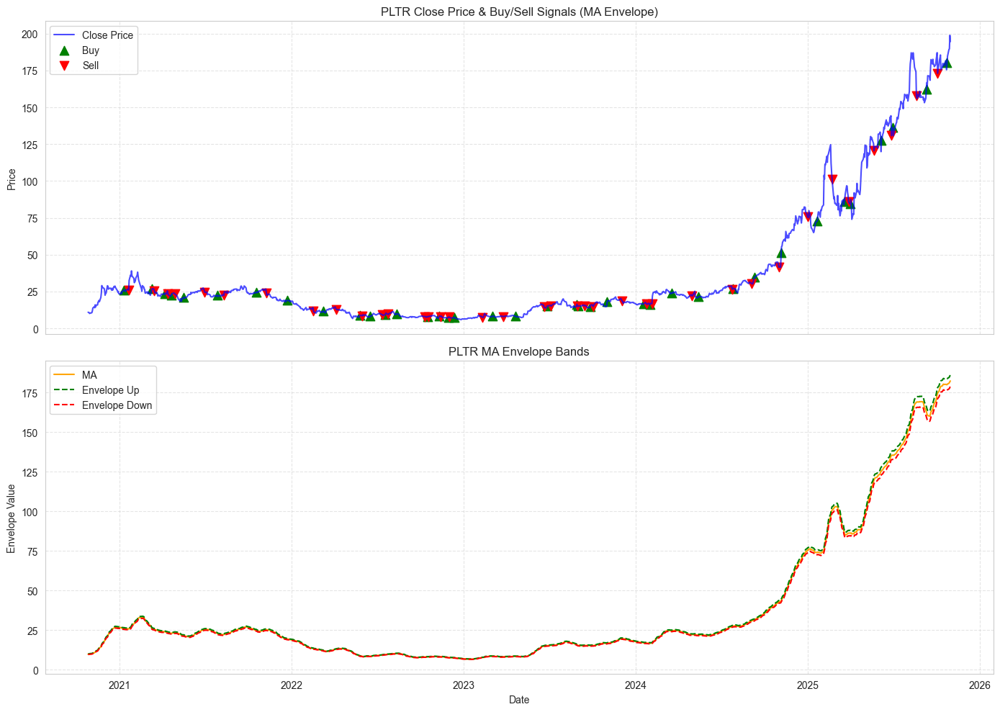

In [336]:
for ticker in env_dict:
    stock_env_plot = env_dict[ticker].copy()
    buy_signals = stock_env_plot[stock_env_plot['Pos_Marker'] == 1]
    sell_signals = stock_env_plot[stock_env_plot['Pos_Marker'] == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Top subplot: Close price + buy/sell signals
    axs[0].plot(stock_env_plot.index, stock_env_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Close Price & Buy/Sell Signals (MA Envelope)")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Bottom subplot: MA Envelope bands
    axs[1].plot(stock_env_plot.index, stock_env_plot['MA'], label='MA', color='orange')
    axs[1].plot(stock_env_plot.index, stock_env_plot['Env_Up'], label='Envelope Up', color='green', linestyle='--')
    axs[1].plot(stock_env_plot.index, stock_env_plot['Env_Down'], label='Envelope Down', color='red', linestyle='--')
    axs[1].set_ylabel("Envelope Value")
    axs[1].set_xlabel("Date")
    axs[1].set_title(f"{ticker} MA Envelope Bands")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

In [337]:
metrics_env.sort_values(by=['Ticker', 'Year'], inplace=True)
metrics_env.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,0.001690,0.001101,1.058583,0.005459,0.830600,-2.048993,-0.022044,60.000000,1.115950
1,AAPL,2016,-0.001325,-0.001480,1.053005,-0.008084,1.590959,-0.000000,-0.013404,80.000000,1.079371
2,AAPL,2017,0.068545,0.020723,1.009710,0.042460,0.255090,0.000000,0.190307,100.000000,NaN
3,AAPL,2018,0.132393,0.054179,1.020912,0.236708,0.858333,0.000000,0.130943,100.000000,NaN
4,AAPL,2019,-0.097595,-0.082437,1.000444,-0.240732,3.344851,-0.000000,-0.035157,66.666667,0.312968


In [338]:
#calculate overall metrics for each ticker for breakout strategy
metrics_rows_env = []
for ticker in holdings:
    ticker_trades_env = env_all_trades_df[env_all_trades_df['Ticker'] == ticker]
    metrics_row_env = calculate_metrics(ticker_trades_env)
    metrics_rows_env.append(metrics_row_env)
metrics_df_env = pd.concat(metrics_rows_env, ignore_index=True)

# 9. Display or plot results as needed
print(metrics_env.head())
print(metrics_df_env.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2015  0.001690      0.001101         1.058583           0.005459   
1   AAPL  2016 -0.001325     -0.001480         1.053005          -0.008084   
2   AAPL  2017  0.068545      0.020723         1.009710           0.042460   
3   AAPL  2018  0.132393      0.054179         1.020912           0.236708   
4   AAPL  2019 -0.097595     -0.082437         1.000444          -0.240732   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0    0.830600     -2.048993     -0.022044     60.000000       1.115950  
1    1.590959     -0.000000     -0.013404     80.000000       1.079371  
2    0.255090      0.000000      0.190307    100.000000            NaN  
3    0.858333      0.000000      0.130943    100.000000            NaN  
4    3.344851     -0.000000     -0.035157     66.666667       0.312968  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015 

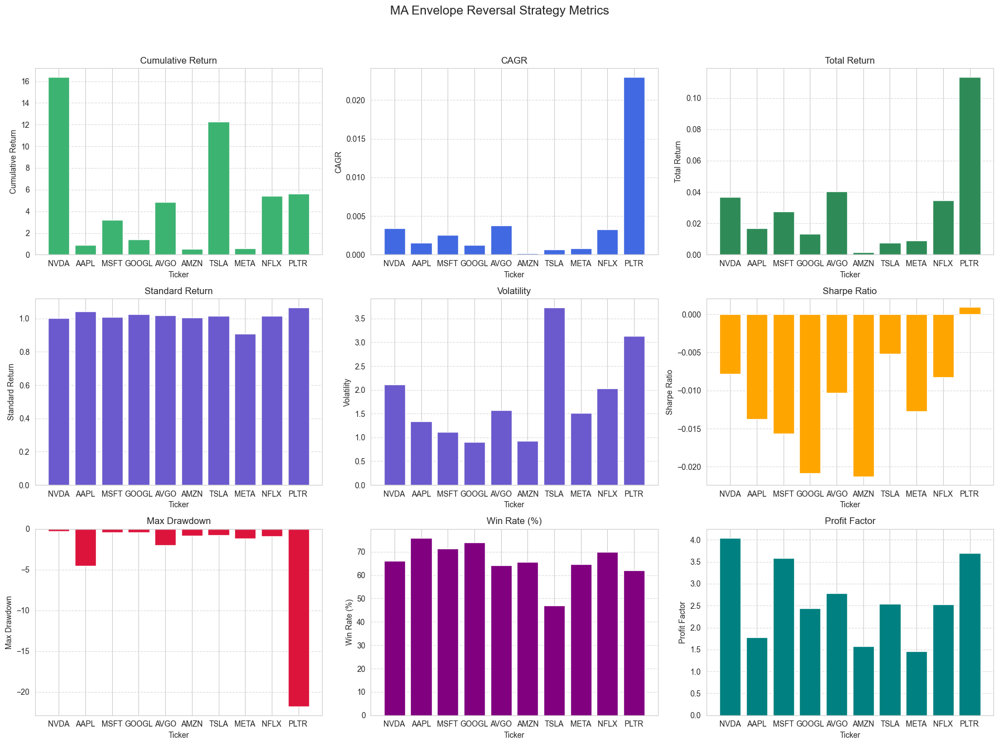

In [339]:
fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('MA Envelope Reversal Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(metrics_df_env['Ticker'], metrics_df_env['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(metrics_df_env['Ticker'], metrics_df_env['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(metrics_df_env['Ticker'], metrics_df_env['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Standard Return by Ticker
axs[1, 0].bar(metrics_df_env['Ticker'], metrics_df_env['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Volatility by Ticker
axs[1, 1].bar(metrics_df_env['Ticker'], metrics_df_env['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(metrics_df_env['Ticker'], metrics_df_env['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(metrics_df_env['Ticker'], metrics_df_env['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate (%) by Ticker
axs[2, 1].bar(metrics_df_env['Ticker'], metrics_df_env['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(metrics_df_env['Ticker'], metrics_df_env['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [340]:

# Summary table for MA Envelope Reversal Strategy Bands strategy
env_summary = pd.DataFrame({
    'Strategy': ['MA Envelope Reversal Strategy Bands'],
    'CAGR': [metrics_df_env['CAGR'].mean()],
    'Total Return': [metrics_df_env['Total Return'].mean()],
    'Volatility': [metrics_df_env['Volatility'].mean()],
    'Max Drawdown': [metrics_df_env['Max Drawdown'].mean()],
    'Sharpe Ratio': [metrics_df_env['Sharpe Ratio'].mean()],
    'Win Rate (%)': [metrics_df_env['Win Rate (%)'].mean()],
    'Profit Factor': [metrics_df_env['Profit Factor'].mean()]
})
display(env_summary)

,Strategy,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,MA Envelope Reversal Strategy Bands,0.00405,0.030134,1.838993,-3.321557,-0.011483,66.116608,2.643439


In [341]:
# MA Envelope Reversal Strategy Bands vs mutual fund summary table
env_summary_table = pd.concat([env_summary, fund_summary], ignore_index=True)
env_summary_table.set_index('Strategy', inplace=True)
display(env_summary_table)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
MA Envelope Reversal Strategy Bands,0.004050,0.030134,1.838993,-3.321557,-0.011483,66.116608,2.643439
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


In [342]:
#combine strategy metrics for comparison
meanrev_startegies_summary = pd.concat([bb_summary, rsi_summary, env_summary], ignore_index=True)
meanrev_startegies_summary.set_index('Strategy', inplace=True)
display(meanrev_startegies_summary)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
Bollinger Bands Mean Reversion,0.010145,0.075304,2.088127,-0.643757,-0.008046,79.146691,4.413116
RSI Oversold/Overbought,0.009509,0.106488,3.672679,-0.678637,-0.003680,82.468864,5.924726
MA Envelope Reversal Strategy Bands,0.004050,0.030134,1.838993,-3.321557,-0.011483,66.116608,2.643439


# MOMEMTUM STRATEGY

##### 1) Rate of Change Strategy

In [343]:
#calculate rate of change and trades for each stock
roc_all_trades = []
roc_dict = {}
data = yf.download(holdings, start=start_date, end=end_date, interval="1d", group_by="ticker")

for ticker in holdings:
    print(f"Processing {ticker}...")
    try:
        stock_roc = data[ticker][['Close']].dropna().copy()
        stock_roc['ROC'] = stock_roc['Close'].pct_change(periods=5) * 100
        roc_dict[ticker] = stock_roc['ROC']
        stock_roc.loc[stock_roc.index[5:], 'Position'] = np.where(stock_roc['ROC'][5:] > 0, 1, -1)

        roc_dict[ticker] = stock_roc[['Close', 'ROC','Position']].copy()
        trades = calculate_trades(stock_roc)
        if not trades.empty:
            trades['Ticker'] = ticker
            roc_all_trades.append(trades)
    except KeyError as e:
        print(f"Error processing {ticker}: {e}")
        continue
roc_all_trades_df = pd.concat(roc_all_trades,ignore_index = True)
if not roc_all_trades_df.empty:
    columns = ['Ticker'] + [col for col in roc_all_trades_df.columns if col != 'Ticker']
    roc_all_trades_df = roc_all_trades_df[columns]

C:\Users\satya\AppData\Local\Temp\ipykernel_29152\1809721253.py:4: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(holdings, start=start_date, end=end_date, interval="1d", group_by="ticker")
[*********************100%***********************]  10 of 10 completed


Processing NVDA...
Processing AAPL...
Processing MSFT...
Processing GOOGL...
Processing AVGO...
Processing AMZN...
Processing TSLA...
Processing META...
Processing NFLX...
Processing PLTR...


In [344]:
#Ensure "Sell Date" is datetime and extract year
roc_all_trades_df['Sell Date'] = pd.to_datetime(roc_all_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
roc_all_trades_df['Buy Date'] = pd.to_datetime(roc_all_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
roc_all_trades_df['Year'] = roc_all_trades_df['Sell Date'].dt.year

In [345]:
#group by ticker and year to calculate annual metrics for each group
roc_metrics_by_year = roc_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\1611752344.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  roc_metrics_by_year = roc_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [346]:
#Calculate overall metrics for each ticker
metrics_rows = []
for ticker in holdings:
    ticker_trades = roc_all_trades_df[roc_all_trades_df['Ticker'] == ticker]
    metrics_row = calculate_metrics(ticker_trades)
    metrics_rows.append(metrics_row)
roc_metrics_df = pd.concat(metrics_rows, ignore_index=True)

# 9. Display or plot results as needed
print(roc_metrics_by_year.head())
print(roc_metrics_df.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2015 -0.000751     -0.000732         0.985396          -0.031161   
1   AAPL  2016  0.003154      0.003013         1.051608           0.057732   
2   AAPL  2017  0.013037      0.012633         0.987838           0.296448   
3   AAPL  2018  0.008994      0.008296         0.965624           0.218497   
4   AAPL  2019  0.011724      0.010813         0.968676           0.260267   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0    0.578664     -1.308626     -0.035859     31.250000       0.967115  
1    0.515562     -2.600195     -0.032675     41.666667       1.261007  
2    0.686918     -0.305310     -0.010137     57.894737       3.627881  
3    0.714126     -0.591076     -0.015412     55.000000       2.086756  
4    0.851746     -0.754086     -0.009716     45.833333       1.877492  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015 

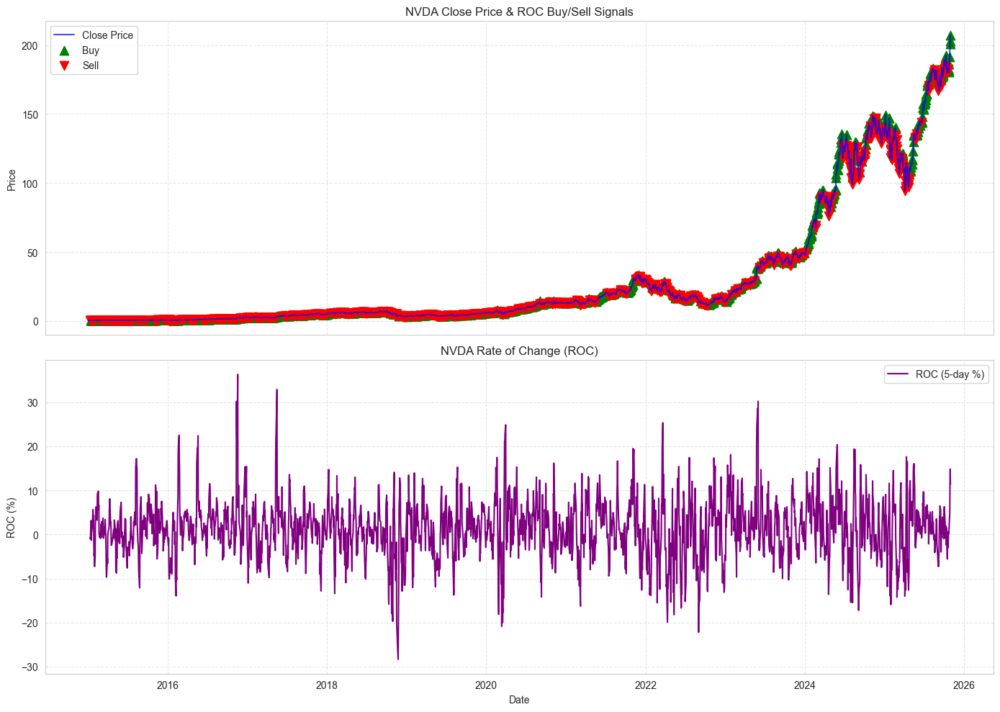

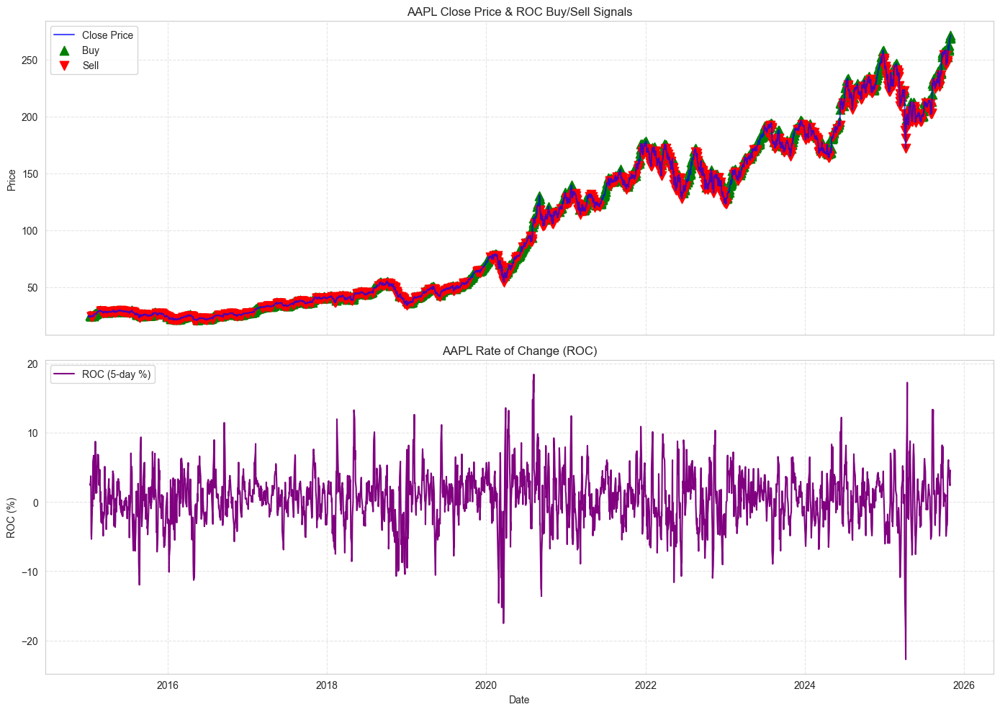

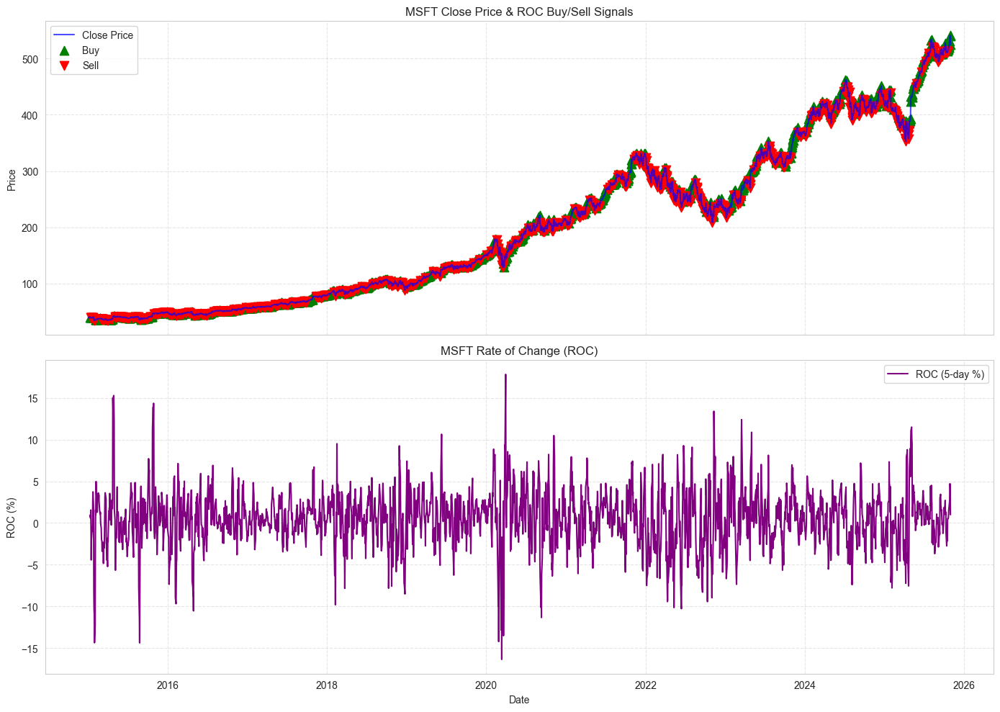

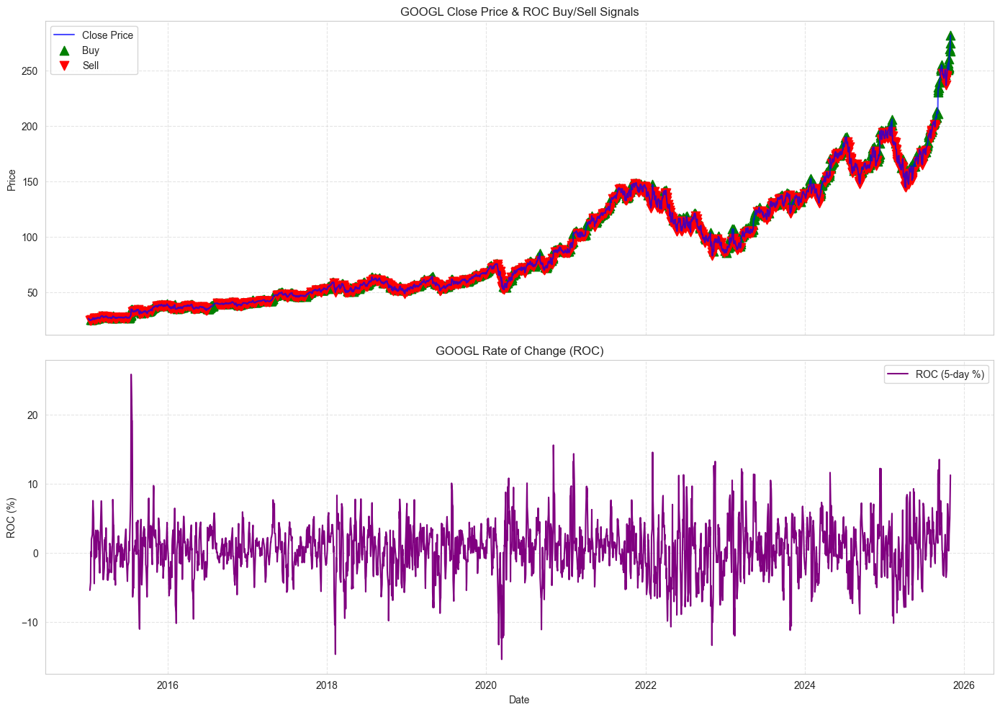

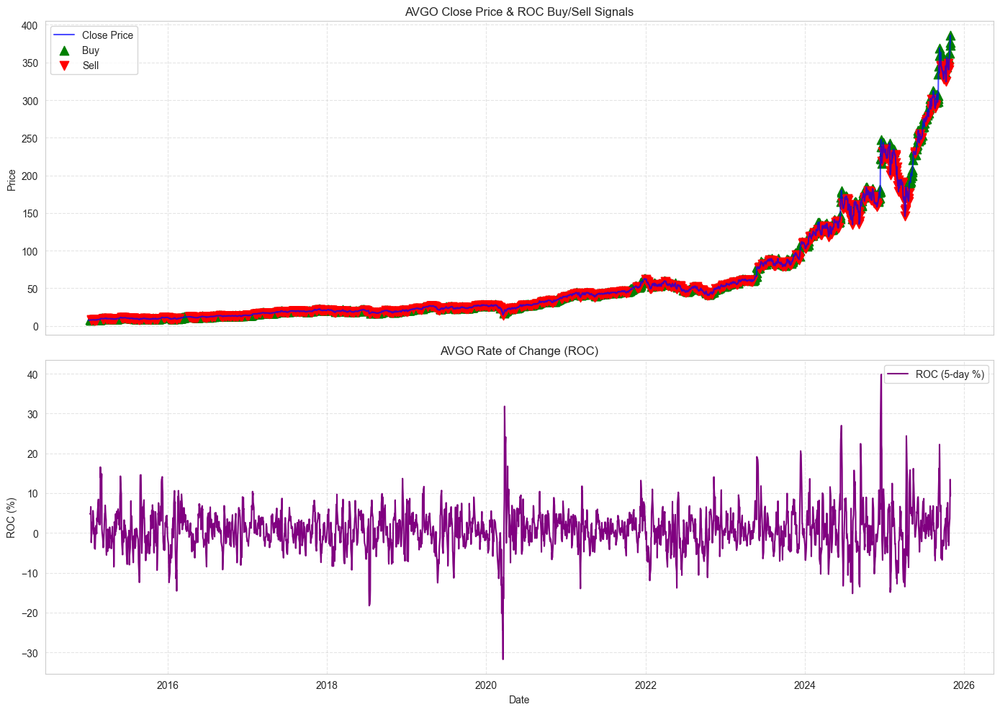

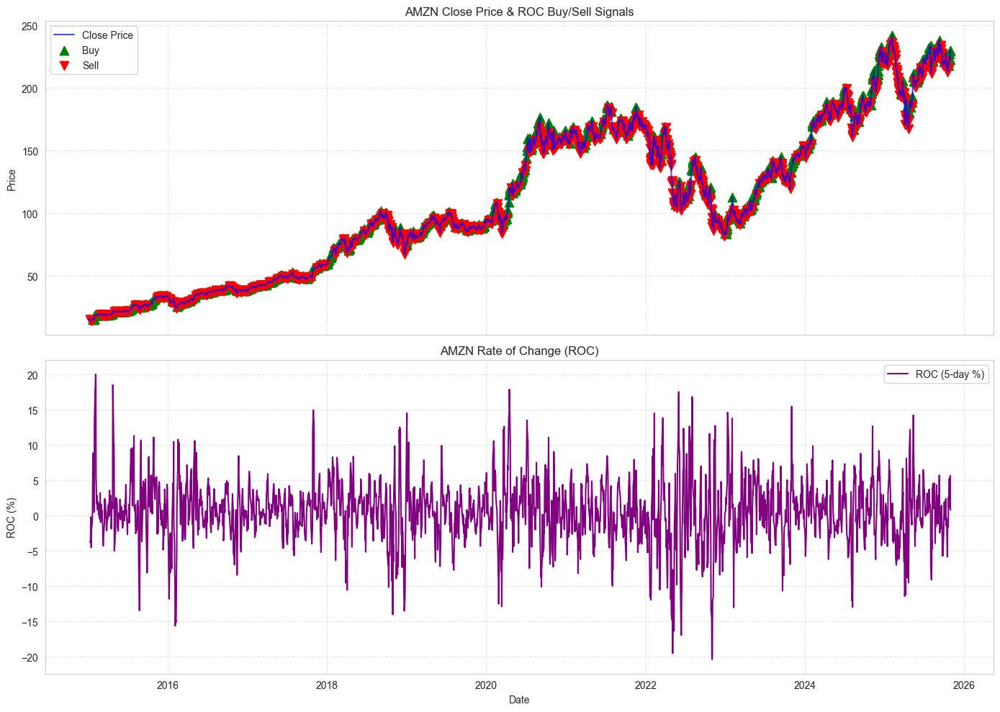

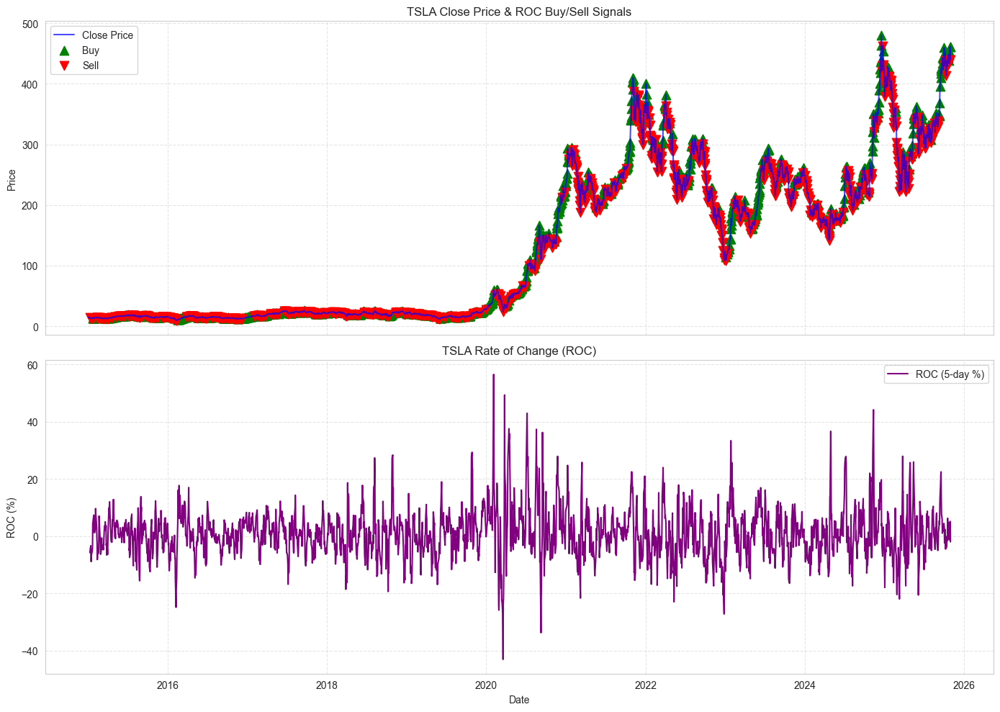

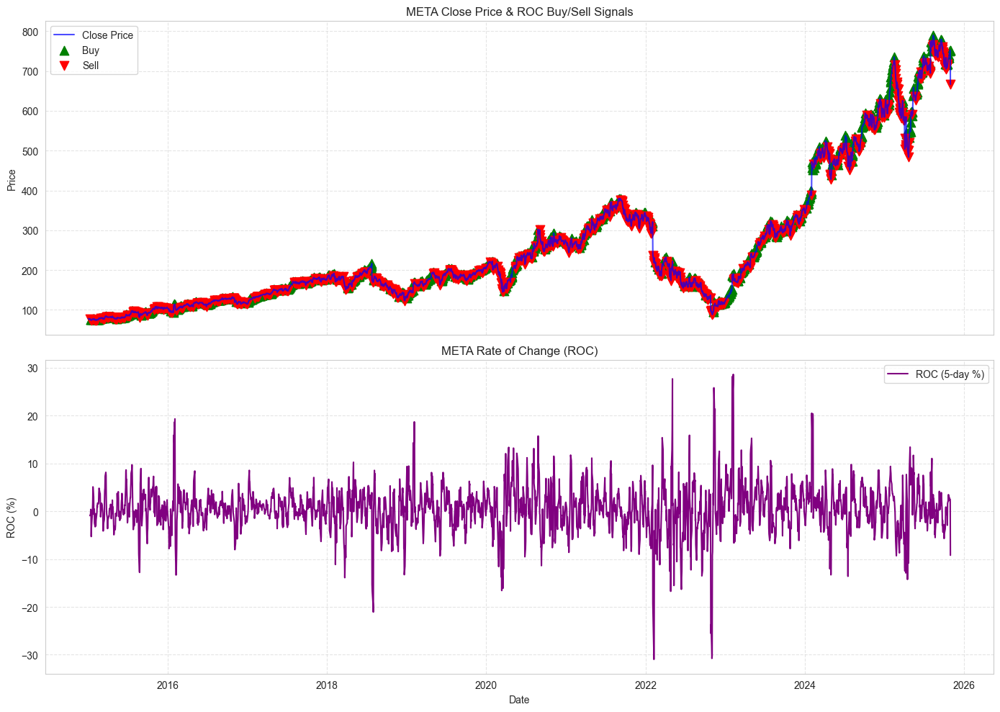

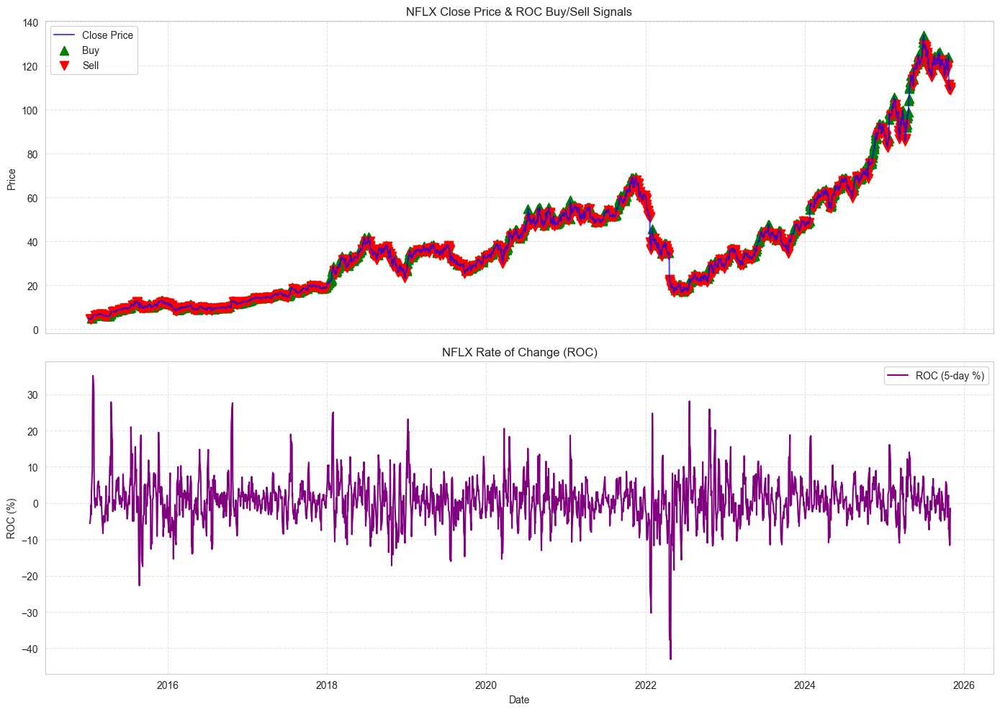

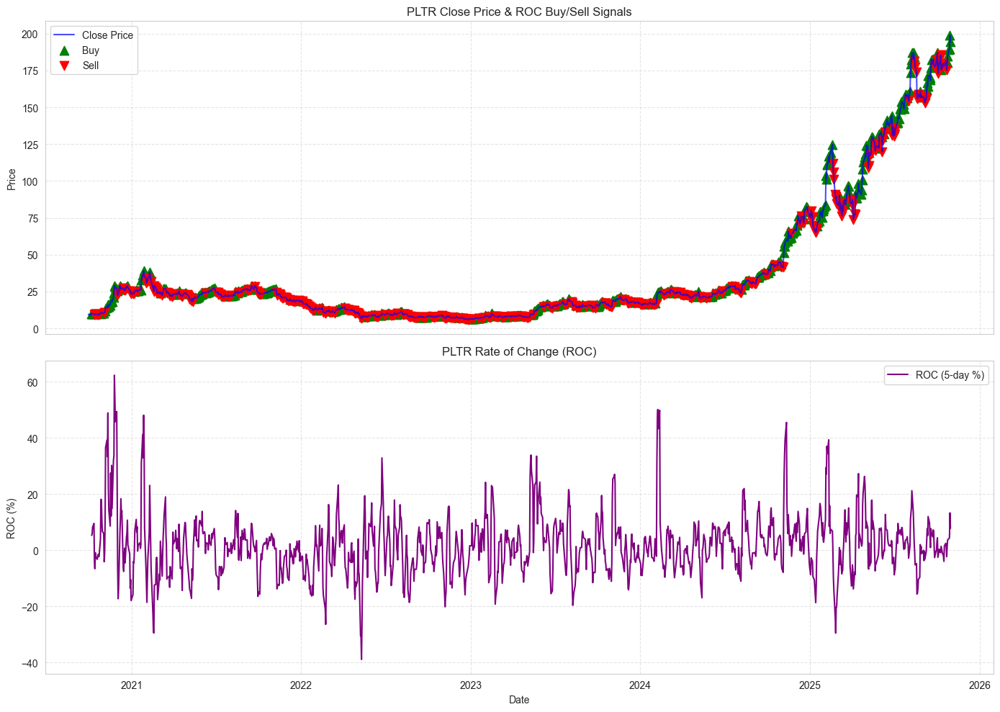

In [347]:
for ticker in roc_dict:
    stock_roc_plot = roc_dict[ticker].copy()
    # Identify buy/sell signals (where Position == 1 or -1)
    buy_signals = stock_roc_plot[stock_roc_plot['Position'] == 1]
    sell_signals = stock_roc_plot[stock_roc_plot['Position'] == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Top subplot: Close price + buy/sell signals
    axs[0].plot(stock_roc_plot.index, stock_roc_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Close Price & ROC Buy/Sell Signals")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Bottom subplot: ROC values
    axs[1].plot(stock_roc_plot.index, stock_roc_plot['ROC'], label='ROC (5-day %)', color='purple')
    axs[1].set_ylabel("ROC (%)")
    axs[1].set_xlabel("Date")
    axs[1].set_title(f"{ticker} Rate of Change (ROC)")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

In [348]:
roc_metrics_by_year.sort_values(by=['Ticker', 'Year'], inplace=True)
roc_metrics_by_year.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,-0.000751,-0.000732,0.985396,-0.031161,0.578664,-1.308626,-0.035859,31.250000,0.967115
1,AAPL,2016,0.003154,0.003013,1.051608,0.057732,0.515562,-2.600195,-0.032675,41.666667,1.261007
2,AAPL,2017,0.013037,0.012633,0.987838,0.296448,0.686918,-0.305310,-0.010137,57.894737,3.627881
3,AAPL,2018,0.008994,0.008296,0.965624,0.218497,0.714126,-0.591076,-0.015412,55.000000,2.086756
4,AAPL,2019,0.011724,0.010813,0.968676,0.260267,0.851746,-0.754086,-0.009716,45.833333,1.877492


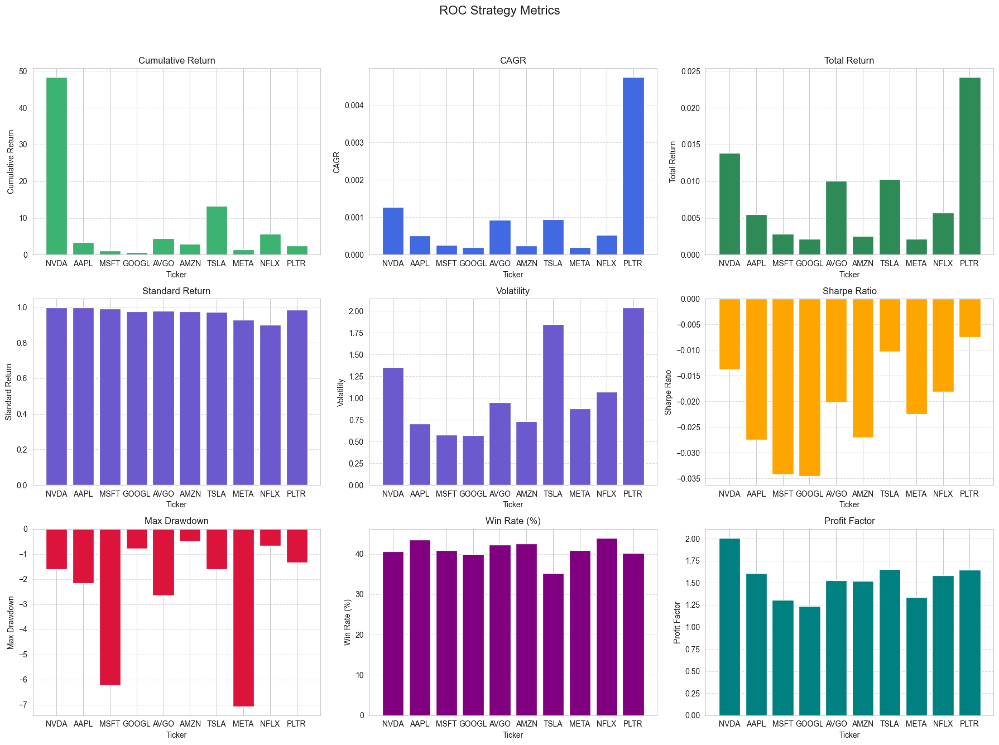

In [349]:
#plot for overall metrics
fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('ROC Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(roc_metrics_df['Ticker'], roc_metrics_df['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(roc_metrics_df['Ticker'], roc_metrics_df['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(roc_metrics_df['Ticker'], roc_metrics_df['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Standard Return by Ticker
axs[1, 0].bar(roc_metrics_df['Ticker'], roc_metrics_df['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Volatility by Ticker
axs[1, 1].bar(roc_metrics_df['Ticker'], roc_metrics_df['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')       
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(roc_metrics_df['Ticker'], roc_metrics_df['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(roc_metrics_df['Ticker'], roc_metrics_df['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate (%) by Ticker
axs[2, 1].bar(roc_metrics_df['Ticker'], roc_metrics_df['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(roc_metrics_df['Ticker'], roc_metrics_df['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [350]:
# --- Summary Table: ROC Strategy (Avg) vs. Mutual Fund ---

# 1. ROC Strategy (average across tickers)
roc_summary = pd.DataFrame({
    'Strategy': ['ROC Strategy (Avg)'],
    'CAGR': [roc_metrics_df['CAGR'].mean()],
    'Total Return': [roc_metrics_df['Total Return'].mean()],
    'Volatility': [roc_metrics_df['Volatility'].mean()],
    'Max Drawdown': [roc_metrics_df['Max Drawdown'].mean()],
    'Sharpe Ratio': [roc_metrics_df['Sharpe Ratio'].mean()],
    'Win Rate (%)': [roc_metrics_df['Win Rate (%)'].mean()],
    'Profit Factor': [roc_metrics_df['Profit Factor'].mean()]
})

In [351]:
# roc vs mutual fund summary table
roc_summary_table = pd.concat([roc_summary, fund_summary], ignore_index=True)
roc_summary_table.set_index('Strategy', inplace=True)
display(roc_summary_table)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
ROC Strategy (Avg),0.000983,0.007914,1.072733,-2.462698,-0.021579,41.025144,1.543469
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


In [352]:
# Calculate 52-Week High/Low Breakout Momentum Strategy
ftw_all_trades = []
ftw_dict = {}

for ticker in holdings:
    print(f"Processing {ticker} for 52-week high/low breakout...")
    try:
        stock_ftw = data[ticker][['Close']].dropna().copy()
        stock_ftw['52w_high'] = stock_ftw['Close'].rolling(window=252).max()
        stock_ftw['52w_low'] = stock_ftw['Close'].rolling(window=252).min()
        # Buy if price breaks above 52-week high, Sell if price breaks below 52-week low
        stock_ftw['Position'] = 0
        stock_ftw.loc[stock_ftw['Close'] >= stock_ftw['52w_high'], 'Position'] = 1
        stock_ftw.loc[stock_ftw['Close'] <= stock_ftw['52w_low'], 'Position'] = -1
        ftw_dict[ticker] = stock_ftw[['Close', '52w_high', '52w_low','Position']].copy()
        trades = calculate_trades(stock_ftw)
        if not trades.empty:
            trades['Ticker'] = ticker
            ftw_all_trades.append(trades)
    except KeyError as e:
        print(f"Error processing {ticker}: {e}")
        continue

if ftw_all_trades:
    ftw_all_trades_df = pd.concat(ftw_all_trades, ignore_index=True)
    # Convert dates and add year column
    if 'Sell Date' in ftw_all_trades_df.columns:
        ftw_all_trades_df['Sell Date'] = pd.to_datetime(ftw_all_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
        ftw_all_trades_df['Buy Date'] = pd.to_datetime(ftw_all_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
        ftw_all_trades_df['Year'] = ftw_all_trades_df['Sell Date'].dt.year
else:
    ftw_all_trades_df = pd.DataFrame()  # Empty DataFrame if no trades

ftw_all_trades_df.head()

Processing NVDA for 52-week high/low breakout...
Processing AAPL for 52-week high/low breakout...
Processing MSFT for 52-week high/low breakout...
Processing GOOGL for 52-week high/low breakout...
Processing AVGO for 52-week high/low breakout...
Processing AMZN for 52-week high/low breakout...
Processing TSLA for 52-week high/low breakout...
Processing META for 52-week high/low breakout...
Processing NFLX for 52-week high/low breakout...
Processing PLTR for 52-week high/low breakout...


,Buy Date,Sell Date,Buy Price,Sell Price,Return,Ticker,Year
0,2016-03-18,2018-10-29,0.827764,4.597548,4.554178,NVDA,2018
1,2019-11-18,2022-06-13,5.279798,15.623582,1.959125,NVDA,2022
2,2017-01-06,2018-12-21,27.176537,35.829700,0.318406,AAPL,2018
3,2019-10-04,2022-12-28,54.608871,124.166779,1.273747,AAPL,2022
4,2016-04-18,2022-06-13,49.791924,235.438416,3.728446,MSFT,2022


In [353]:
#group by ticker and year to calculate annual metrics for each group
ftw_metrics_by_year = ftw_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)

#Calculate overall metrics for each ticker
metrics_rows = []
for ticker in holdings:
    ticker_trades = ftw_all_trades_df[ftw_all_trades_df['Ticker'] == ticker]
    metrics_row = calculate_metrics(ticker_trades)
    metrics_rows.append(metrics_row)
ftw_metrics_df = pd.concat(metrics_rows, ignore_index=True)

# 9. Display or plot results as needed
print(ftw_metrics_by_year.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2018  0.151892      0.318406         1.318406           0.318406   
1   AAPL  2022  0.289230      1.273747         2.273747           1.273747   
2   AMZN  2020  0.254092      1.384698         2.384698           1.384698   
3   AMZN  2022  0.133960      0.249435         1.249435           0.249435   
4   AVGO  2018  0.190266      0.501960         1.501960           0.501960   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0         NaN           0.0           NaN         100.0            NaN  
1         NaN           0.0           NaN         100.0            NaN  
2         NaN           0.0           NaN         100.0            NaN  
3         NaN           0.0           NaN         100.0            NaN  
4         NaN           0.0           NaN         100.0            NaN  


C:\Users\satya\AppData\Local\Temp\ipykernel_29152\1616036107.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ftw_metrics_by_year = ftw_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


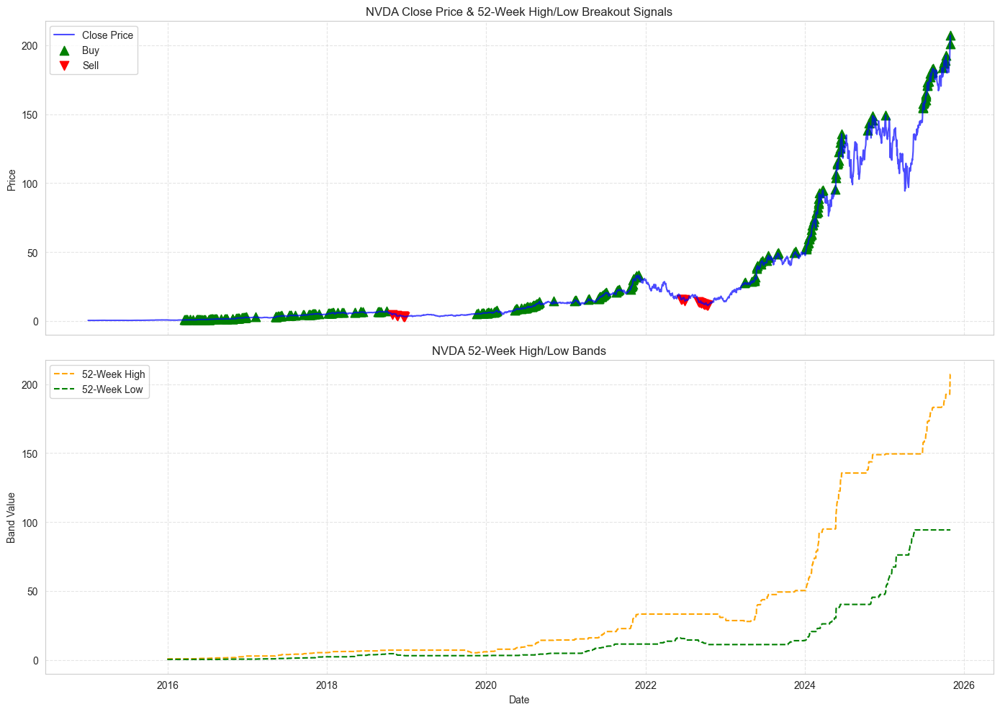

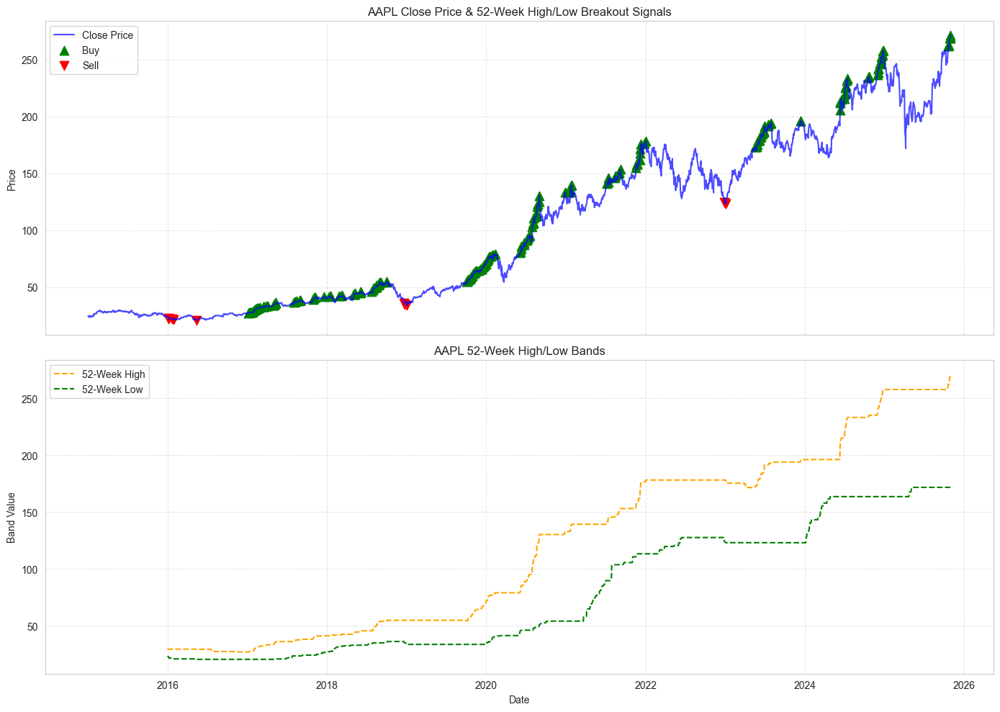

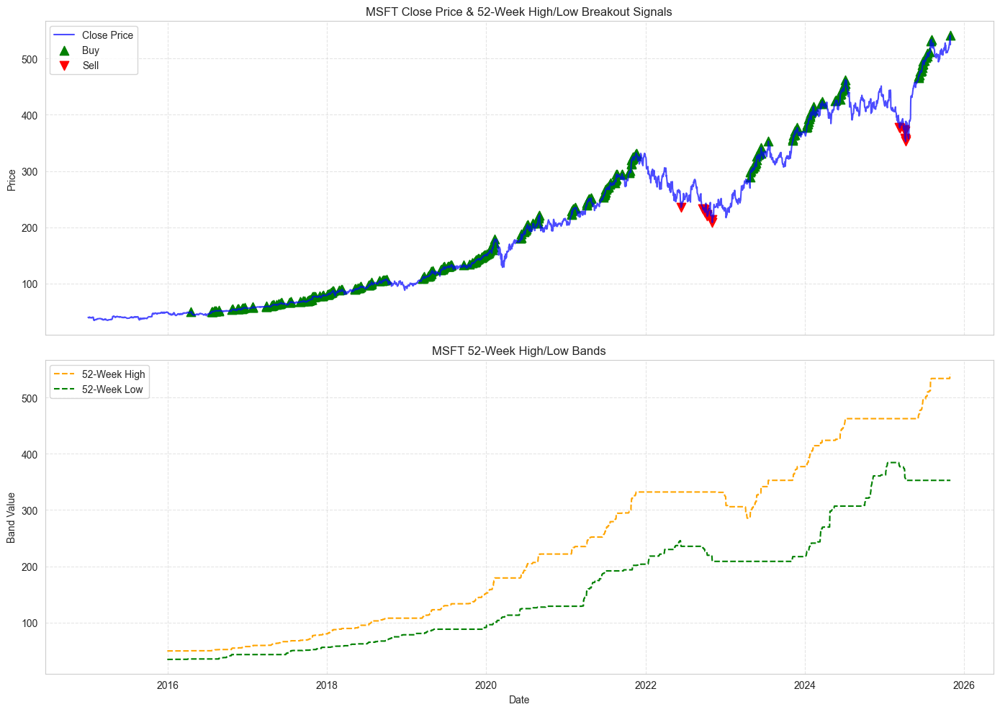

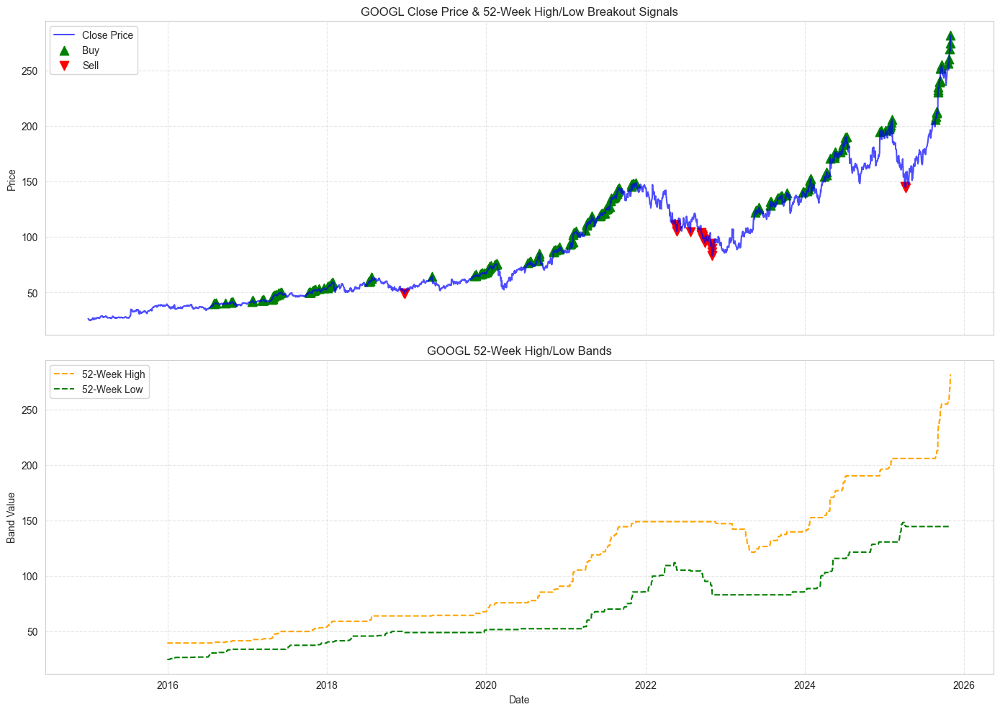

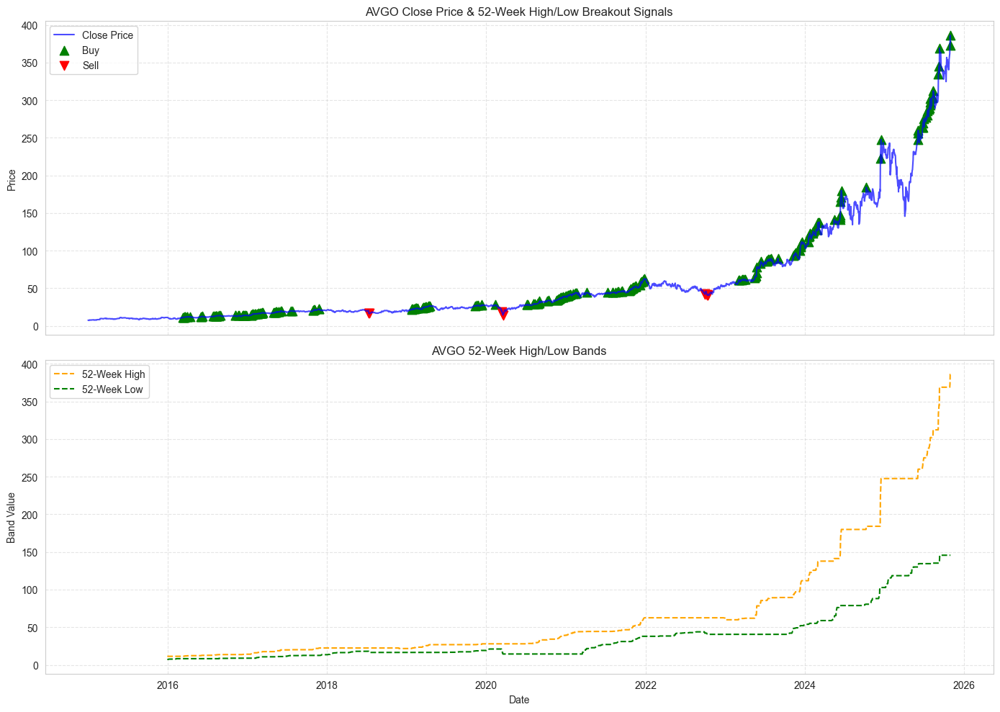

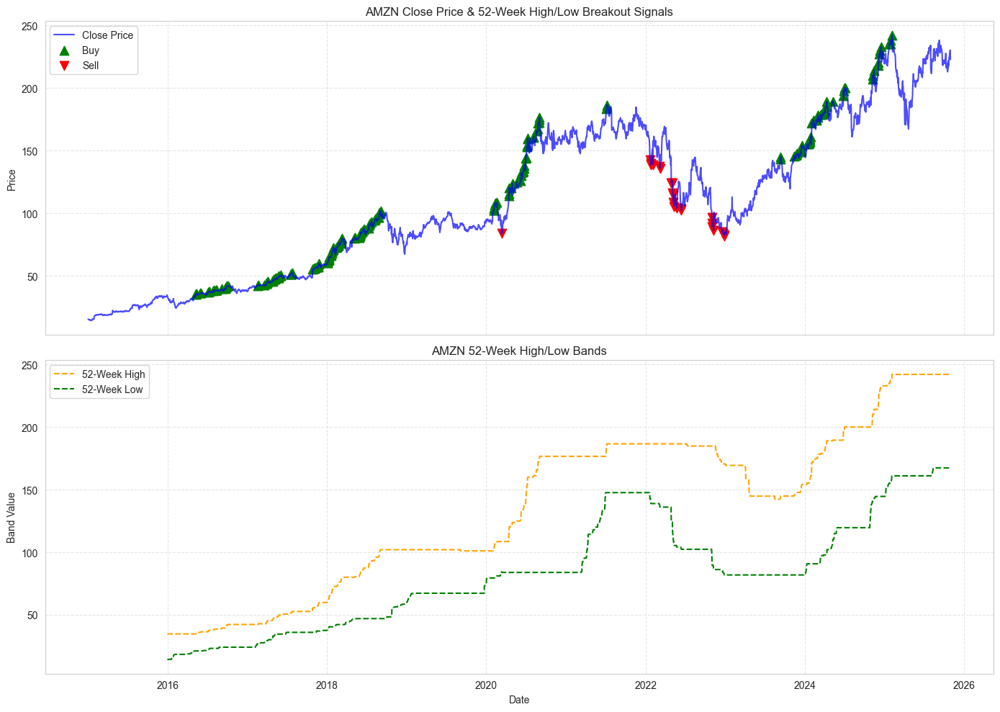

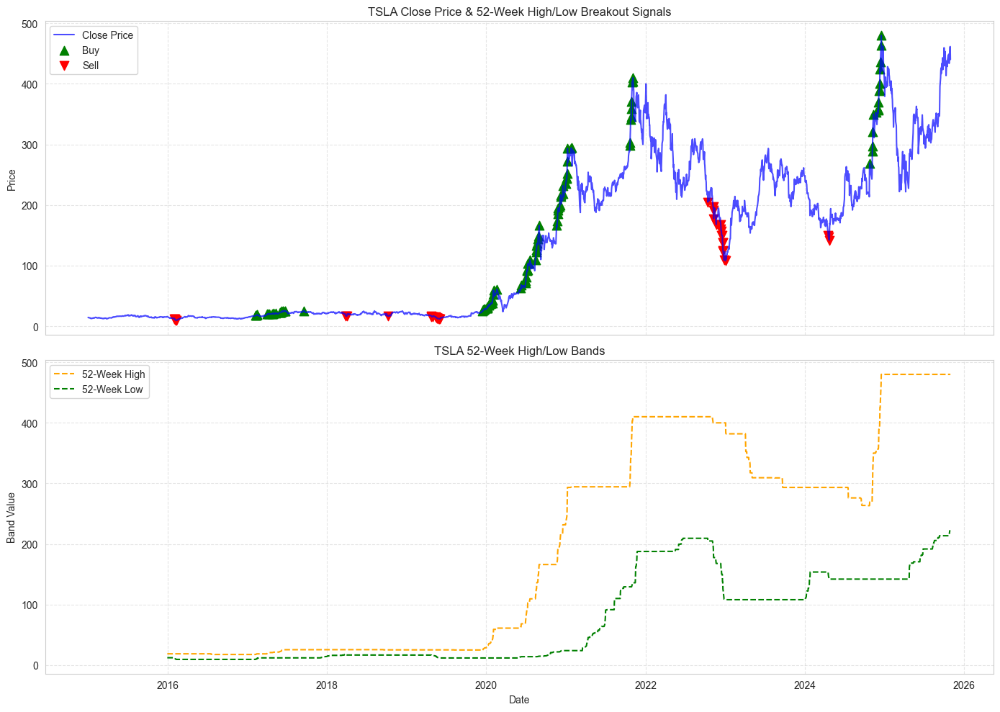

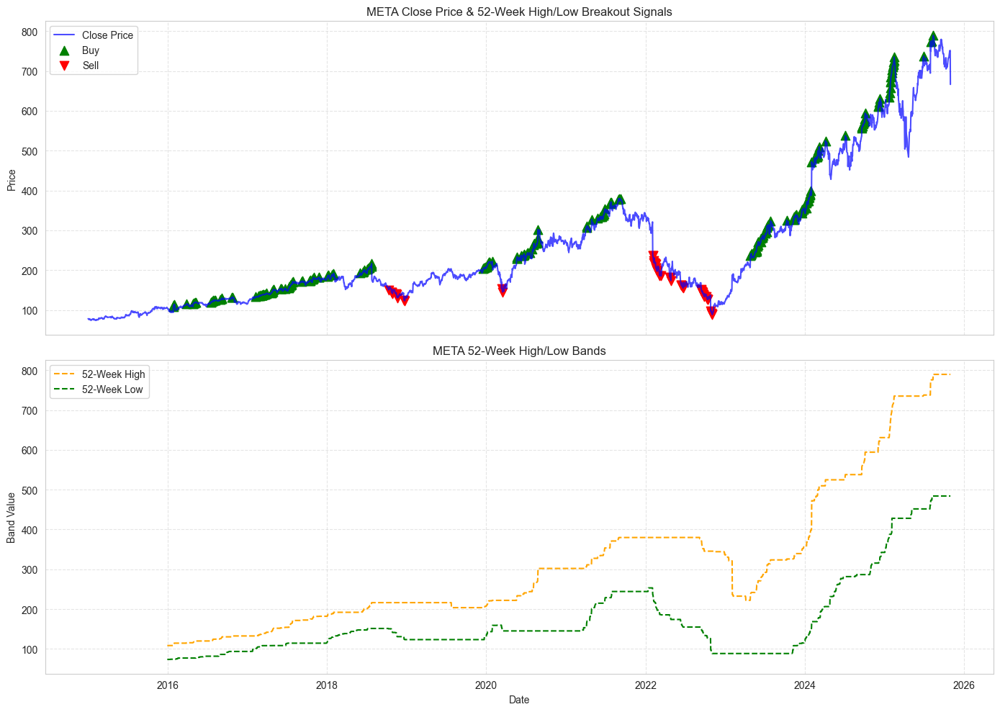

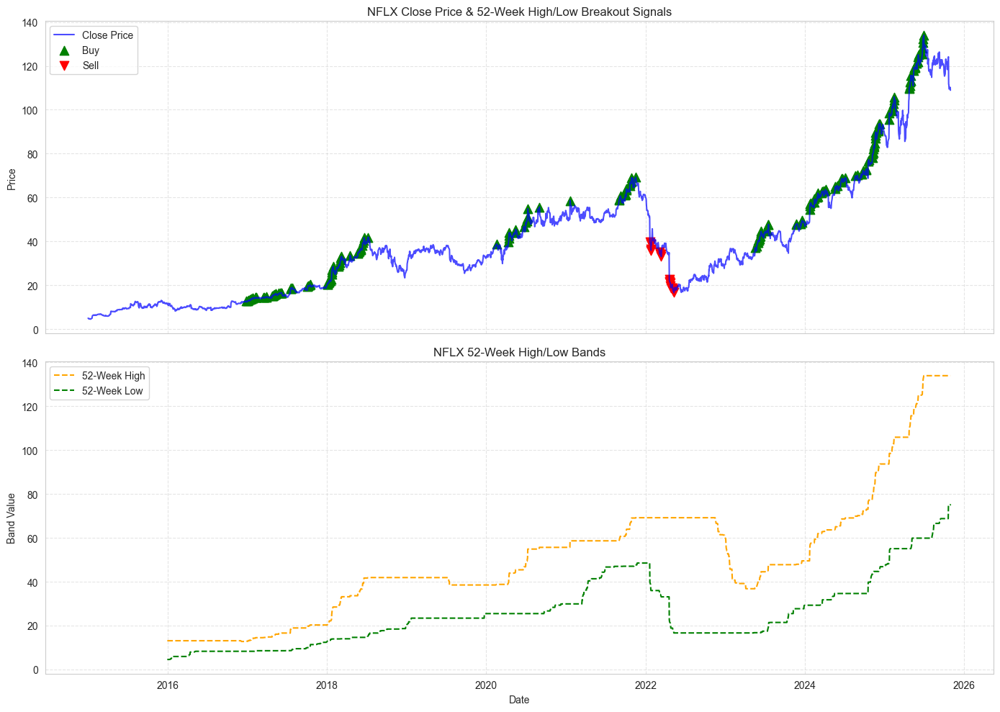

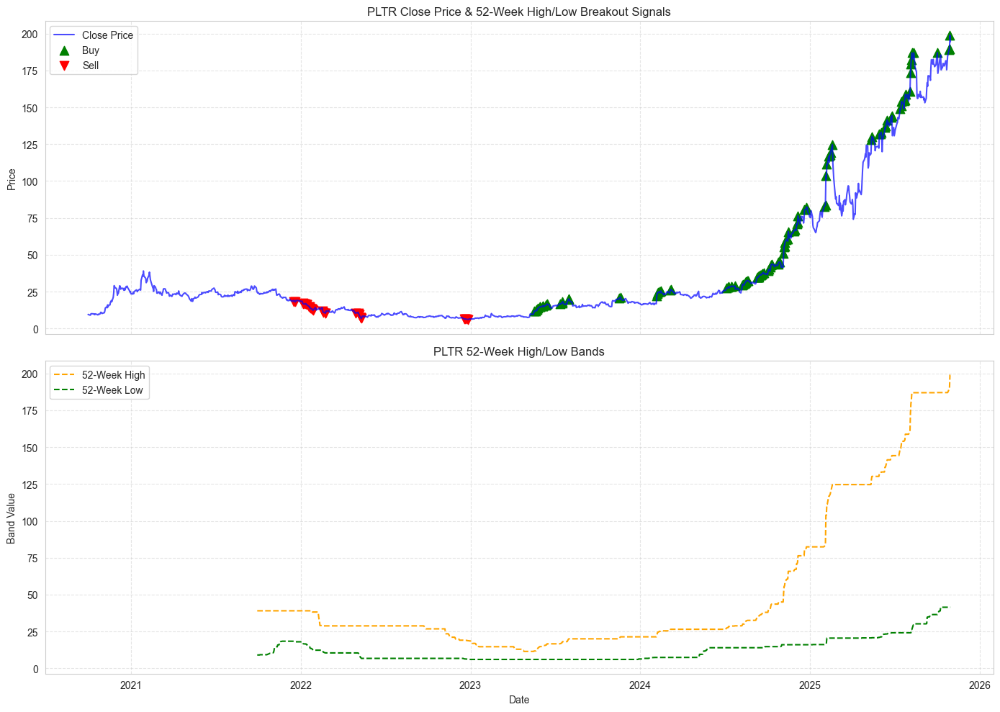

In [354]:
for ticker in ftw_dict:
    stock_ftw_plot = ftw_dict[ticker].copy()
    # If you want buy/sell markers, you need Position column in ftw_dict
    # Add this if not present:
    if 'Position' not in stock_ftw_plot.columns and ticker in ftw_all_trades_df['Ticker'].unique():
        # Recreate Position from trades if needed
        stock_ftw_plot = stock_ftw_plot.join(
            ftw_all_trades_df[ftw_all_trades_df['Ticker'] == ticker][['Buy Date', 'Sell Date']],
            how='left'
        )
    buy_signals = stock_ftw_plot[stock_ftw_plot.get('Position', pd.Series([0]*len(stock_ftw_plot))) == 1]
    sell_signals = stock_ftw_plot[stock_ftw_plot.get('Position', pd.Series([0]*len(stock_ftw_plot))) == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Top subplot: Close price + buy/sell signals
    axs[0].plot(stock_ftw_plot.index, stock_ftw_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Close Price & 52-Week High/Low Breakout Signals")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Bottom subplot: 52-week high/low bands
    axs[1].plot(stock_ftw_plot.index, stock_ftw_plot['52w_high'], label='52-Week High', color='orange', linestyle='--')
    axs[1].plot(stock_ftw_plot.index, stock_ftw_plot['52w_low'], label='52-Week Low', color='green', linestyle='--')
    axs[1].set_ylabel("Band Value")
    axs[1].set_xlabel("Date")
    axs[1].set_title(f"{ticker} 52-Week High/Low Bands")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

In [355]:
ftw_metrics_by_year.sort_values(by=['Ticker', 'Year'], inplace=True)
ftw_metrics_by_year.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2018,0.151892,0.318406,1.318406,0.318406,NaN,0.0,NaN,100.0,NaN
1,AAPL,2022,0.289230,1.273747,2.273747,1.273747,NaN,0.0,NaN,100.0,NaN
2,AMZN,2020,0.254092,1.384698,2.384698,1.384698,NaN,0.0,NaN,100.0,NaN
3,AMZN,2022,0.133960,0.249435,1.249435,0.249435,NaN,0.0,NaN,100.0,NaN
4,AVGO,2018,0.190266,0.501960,1.501960,0.501960,NaN,0.0,NaN,100.0,NaN


In [356]:

#calculate overall metrics for each ticker for breakout strategy
metrics_rows_ftw = []
for ticker in holdings:
    ticker_trades_ftw = ftw_all_trades_df[ftw_all_trades_df['Ticker'] == ticker]
    metrics_row_ftw = calculate_metrics(ticker_trades_ftw)
    metrics_rows_ftw.append(metrics_row_ftw)
metrics_df_ftw = pd.concat(metrics_rows_ftw, ignore_index=True)

# 9. Display or plot results as needed
print(metrics_df_ftw.head())
print(metrics_df_ftw.head())

  Ticker    Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2018.0  0.211618      2.310835         2.959125          15.435507   
1   AAPL  2018.0  0.118881      0.956296         2.273747           1.997721   
2   MSFT  2022.0  0.068999      0.810012         1.307534           5.182603   
3  GOOGL  2018.0  0.035353      0.351672         1.191045           1.545058   
4   AVGO  2018.0  0.038417      0.280159         1.514632           0.960970   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0   29.129392      0.000000      0.006578    100.000000            NaN  
1   10.723684      0.000000      0.009221    100.000000            NaN  
2   38.399642      0.000000      0.001276    100.000000            NaN  
3    4.709380      0.000000      0.003260    100.000000            NaN  
4    5.924281     -0.412932      0.003109     66.666667       7.366436  
  Ticker    Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0

In [357]:
metrics_df_ftw = metrics_df_ftw.dropna(subset=['Ticker'])
metrics_df_ftw['Ticker'] = metrics_df_ftw['Ticker'].astype(str)

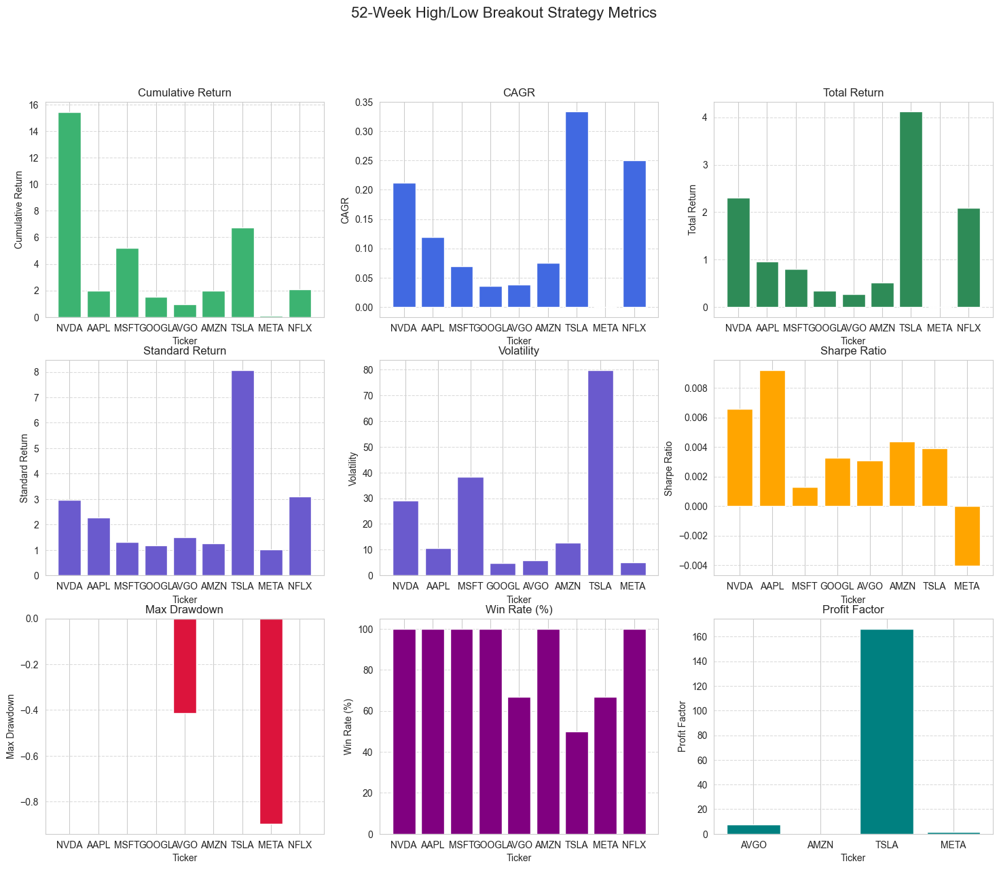

In [358]:
# overall metrics plot
fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('52-Week High/Low Breakout Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Standard Return by Ticker
axs[1, 0].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Volatility by Ticker
axs[1, 1].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')       
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate (%) by Ticker
axs[2, 1].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(metrics_df_ftw['Ticker'], metrics_df_ftw['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)

In [359]:
# --- Summary Table: FTW Strategy (Avg) vs. Mutual Fund ---

# 1. FTW Strategy (average across tickers)
ftw_summary = pd.DataFrame({
    'Strategy': ['FTW Strategy (Avg)'],
    'CAGR': [ftw_metrics_df['CAGR'].mean()],
    'Total Return': [ftw_metrics_df['Total Return'].mean()],
    'Volatility': [ftw_metrics_df['Volatility'].mean()],
    'Max Drawdown': [ftw_metrics_df['Max Drawdown'].mean()],
    'Sharpe Ratio': [ftw_metrics_df['Sharpe Ratio'].mean()],
    'Win Rate (%)': [ftw_metrics_df['Win Rate (%)'].mean()],
    'Profit Factor': [ftw_metrics_df['Profit Factor'].mean()]
})

display(ftw_summary)

,Strategy,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,FTW Strategy (Avg),0.125779,1.271276,23.303138,-0.145506,0.003465,87.037037,58.489913


In [360]:
# bollinger vs mutual fund summary table
ftw_summary_table = pd.concat([ftw_summary, fund_summary], ignore_index=True)
ftw_summary_table.set_index('Strategy', inplace=True)
display(ftw_summary_table)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
FTW Strategy (Avg),0.125779,1.271276,23.303138,-0.145506,0.003465,87.037037,58.489913
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


In [361]:
#calculate rate of change and trades for each stock
rel_all_trades = []
rel_dict = {}

for ticker in holdings:
    print(f"Processing {ticker} for RSI momentum strategy...")
    try:
        stock_rel = data[ticker][['Close']].dropna().copy()
        # Calculate 14-day RSI
        delta = stock_rel['Close'].diff()
        gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
        loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
        rs = gain / loss
        stock_rel['RSI'] = 100 - (100 / (1 + rs))
        
        # Define RSI strategy: Buy when RSI < 30, Sell when RSI > 70
        stock_rel['Position'] = 0
        stock_rel.loc[stock_rel['RSI'] < 30, 'Position'] = 1
        stock_rel.loc[stock_rel['RSI'] > 70, 'Position'] = -1

        rel_dict[ticker] = stock_rel[['Close', 'RSI','Position']].copy()
        trades = calculate_trades(stock_rel)
        if not trades.empty:
            trades['Ticker'] = ticker
            rel_all_trades.append(trades)
    except KeyError as e:
        print(f"Error processing {ticker}: {e}")
        continue

if rel_all_trades:
    rel_all_trades_df = pd.concat(rel_all_trades, ignore_index=True)
    # Convert dates and add year column
    if 'Sell Date' in rel_all_trades_df.columns:
        rel_all_trades_df['Sell Date'] = pd.to_datetime(rel_all_trades_df['Sell Date'], format='%d-%m-%Y', errors='coerce')
        rel_all_trades_df['Buy Date'] = pd.to_datetime(rel_all_trades_df['Buy Date'], format='%d-%m-%Y', errors='coerce')
        rel_all_trades_df['Year'] = rel_all_trades_df['Sell Date'].dt.year
else:
    rel_all_trades_df = pd.DataFrame()  # Empty DataFrame if no trades

rel_all_trades_df.head()

Processing NVDA for RSI momentum strategy...
Processing AAPL for RSI momentum strategy...
Processing MSFT for RSI momentum strategy...
Processing GOOGL for RSI momentum strategy...
Processing AVGO for RSI momentum strategy...
Processing AMZN for RSI momentum strategy...
Processing TSLA for RSI momentum strategy...
Processing META for RSI momentum strategy...
Processing NFLX for RSI momentum strategy...
Processing PLTR for RSI momentum strategy...


,Buy Date,Sell Date,Buy Price,Sell Price,Return,Ticker,Year
0,2015-05-21,2015-05-29,0.505535,0.535542,0.059359,NVDA,2015
1,2015-06-29,2015-08-07,0.486901,0.556112,0.142147,NVDA,2015
2,2016-01-07,2016-02-26,0.738648,0.772800,0.046235,NVDA,2016
3,2017-02-23,2017-03-20,2.478035,2.698984,0.089163,NVDA,2017
4,2017-04-07,2017-05-01,2.474089,2.629691,0.062893,NVDA,2017


In [362]:
#group by ticker and year to calculate annual metrics for each group
rel_metrics_by_year = rel_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)

#Calculate overall metrics for each ticker
rel_metrics_rows = []
for ticker in holdings:
    ticker_trades = rel_all_trades_df[rel_all_trades_df['Ticker'] == ticker]
    rel_metrics_row = calculate_metrics(ticker_trades)
    rel_metrics_rows.append(rel_metrics_row)
rel_metrics_df = pd.concat(rel_metrics_rows, ignore_index=True)

# 9. Display or plot results as needed
print(rel_metrics_by_year.head())
print(rel_metrics_df.head())

  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   AAPL  2015  0.006782      0.004154         0.937453           0.006175   
1   AAPL  2016  0.014441      0.014630         1.051564           0.068041   
2   AAPL  2017  0.058659      0.028009         1.005895           0.088530   
3   AAPL  2018  0.174367      0.078627         1.043695           0.259938   
4   AAPL  2019 -0.053894     -0.031498         1.045391          -0.068102   

   Volatility  Max Drawdown  Sharpe Ratio  Win Rate (%)  Profit Factor  
0    1.524955      -0.91577     -0.008668          50.0       1.172026  
1    1.155478       0.00000     -0.004811          60.0       1.662436  
2    0.341441       0.00000      0.113222         100.0            NaN  
3    0.603502       0.00000      0.255785         100.0            NaN  
4    1.728155      -0.00000     -0.042759          50.0       0.418100  
  Ticker  Year      CAGR  Total Return  Standard Return  Cumulative Return  \
0   NVDA  2015 

C:\Users\satya\AppData\Local\Temp\ipykernel_29152\3366728755.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  rel_metrics_by_year = rel_all_trades_df.groupby(['Ticker', 'Year']).apply(calculate_metrics, risk_free_rate=0.02).reset_index(drop=True)


In [363]:
rel_metrics_by_year.sort_values(by=['Ticker', 'Year'], inplace=True)
rel_metrics_by_year.head()

,Ticker,Year,CAGR,Total Return,Standard Return,Cumulative Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,AAPL,2015,0.006782,0.004154,0.937453,0.006175,1.524955,-0.91577,-0.008668,50.0,1.172026
1,AAPL,2016,0.014441,0.014630,1.051564,0.068041,1.155478,0.00000,-0.004811,60.0,1.662436
2,AAPL,2017,0.058659,0.028009,1.005895,0.088530,0.341441,0.00000,0.113222,100.0,NaN
3,AAPL,2018,0.174367,0.078627,1.043695,0.259938,0.603502,0.00000,0.255785,100.0,NaN
4,AAPL,2019,-0.053894,-0.031498,1.045391,-0.068102,1.728155,-0.00000,-0.042759,50.0,0.418100


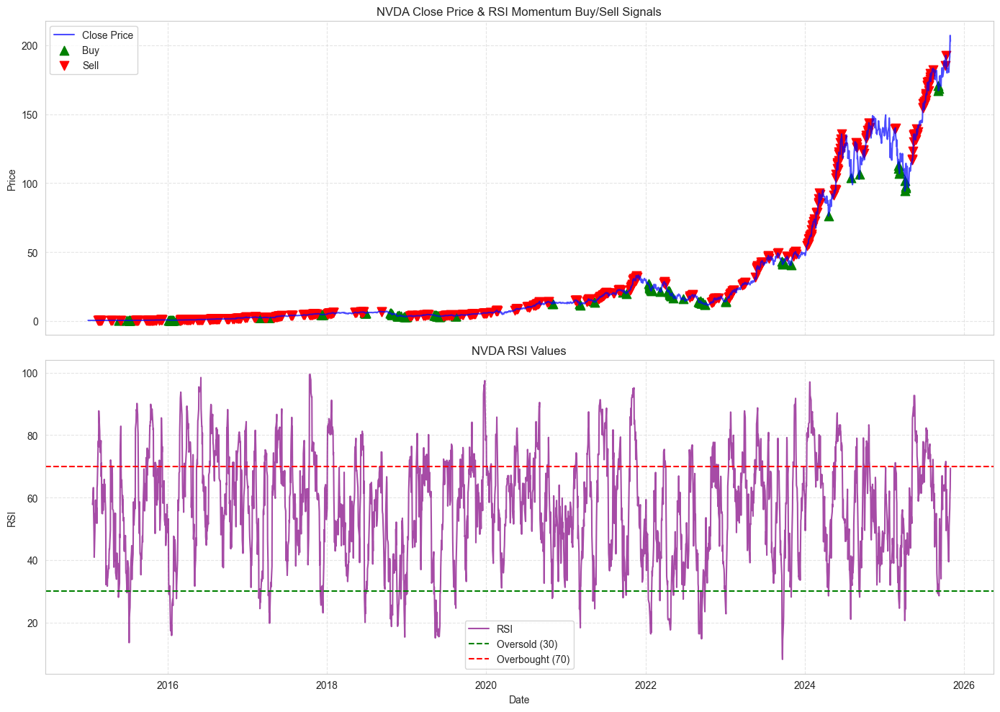

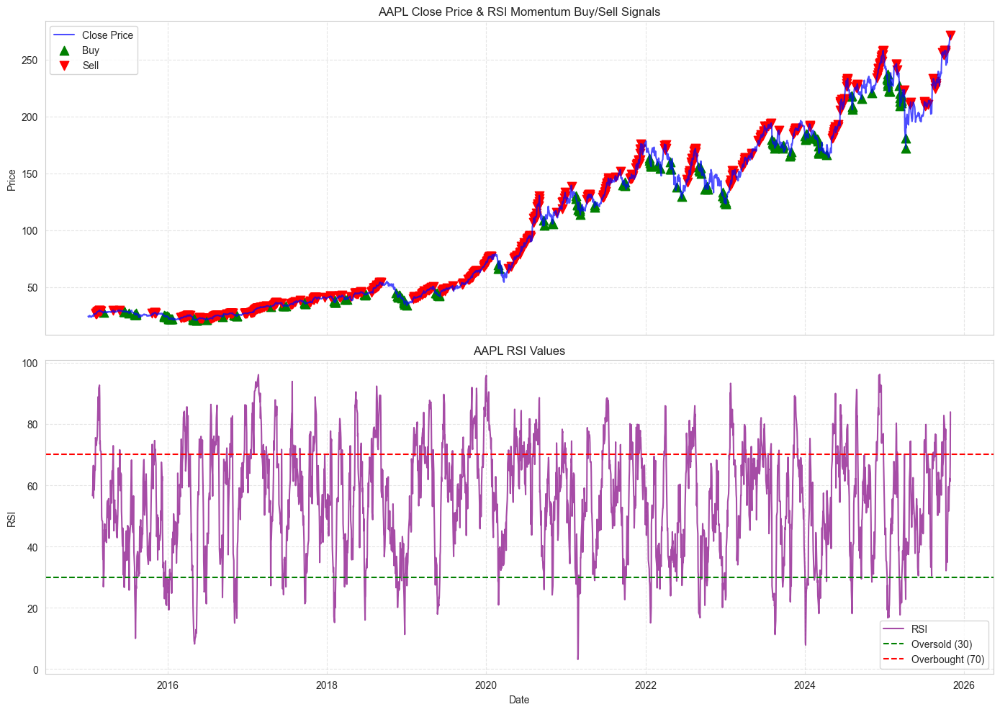

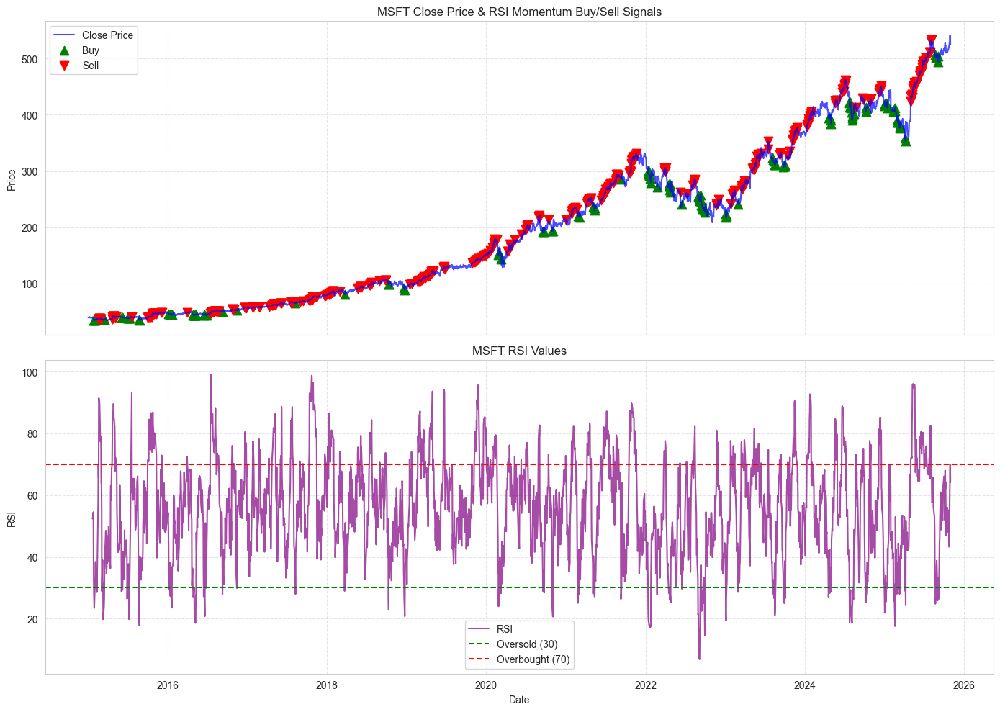

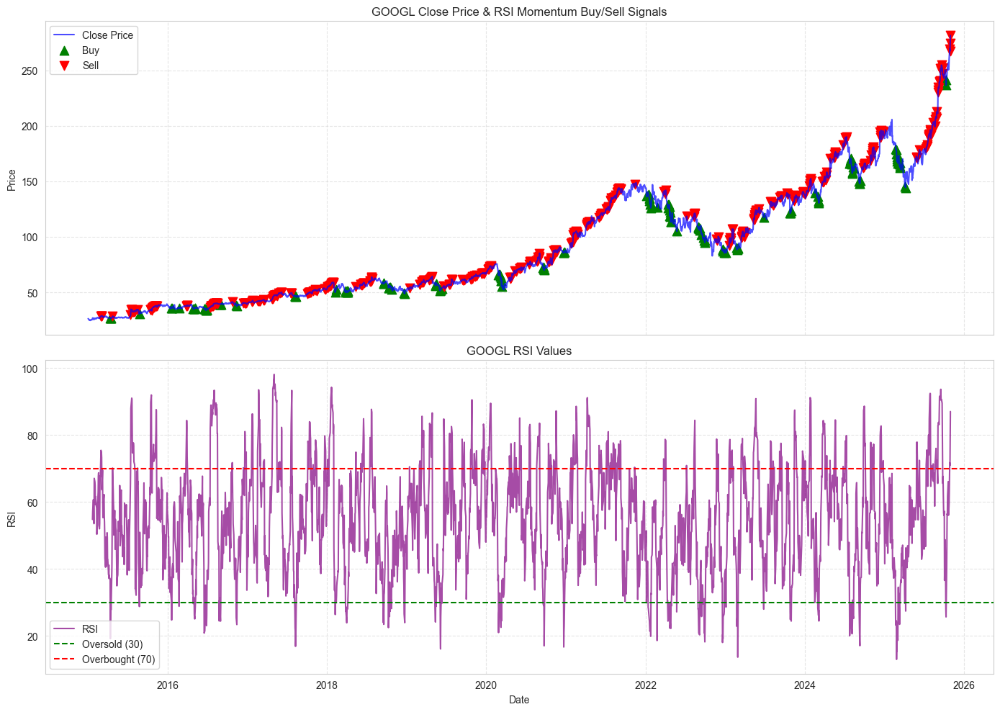

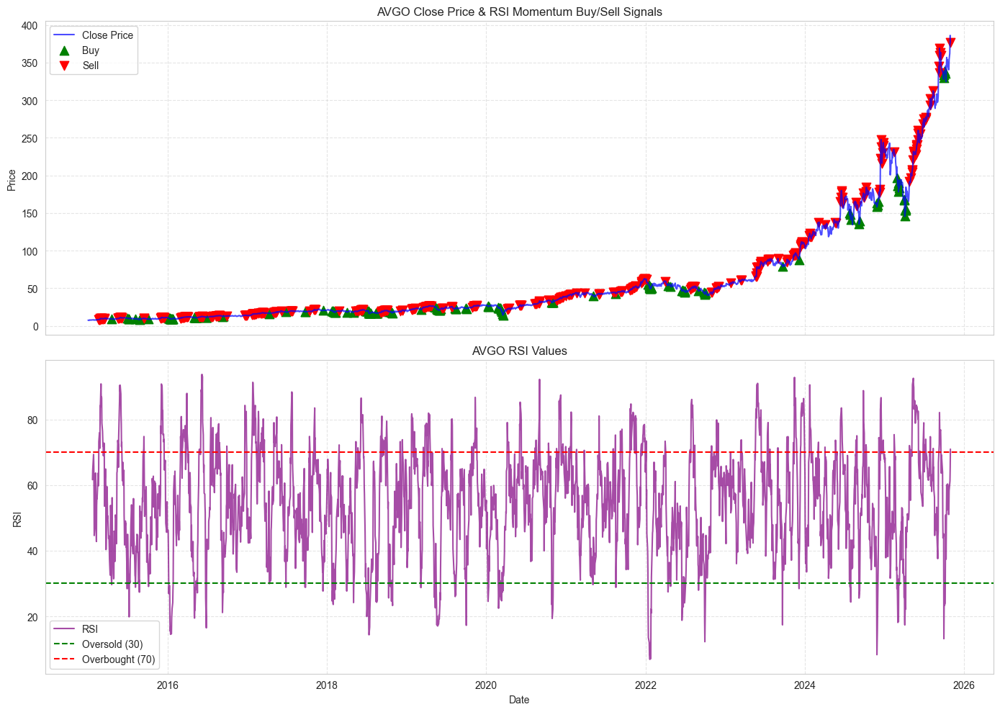

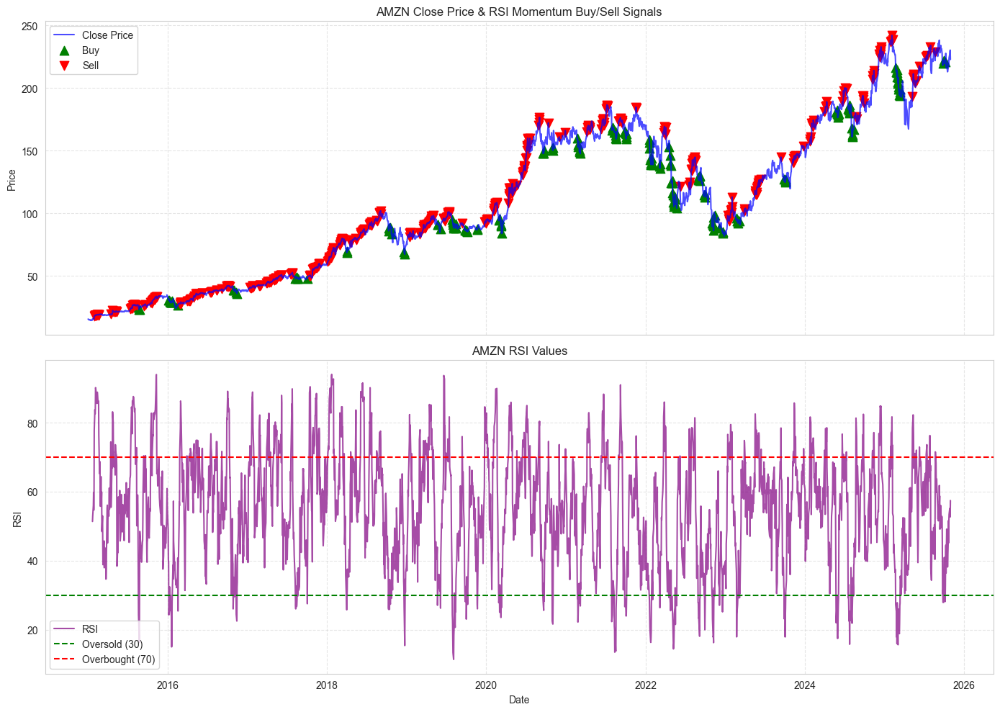

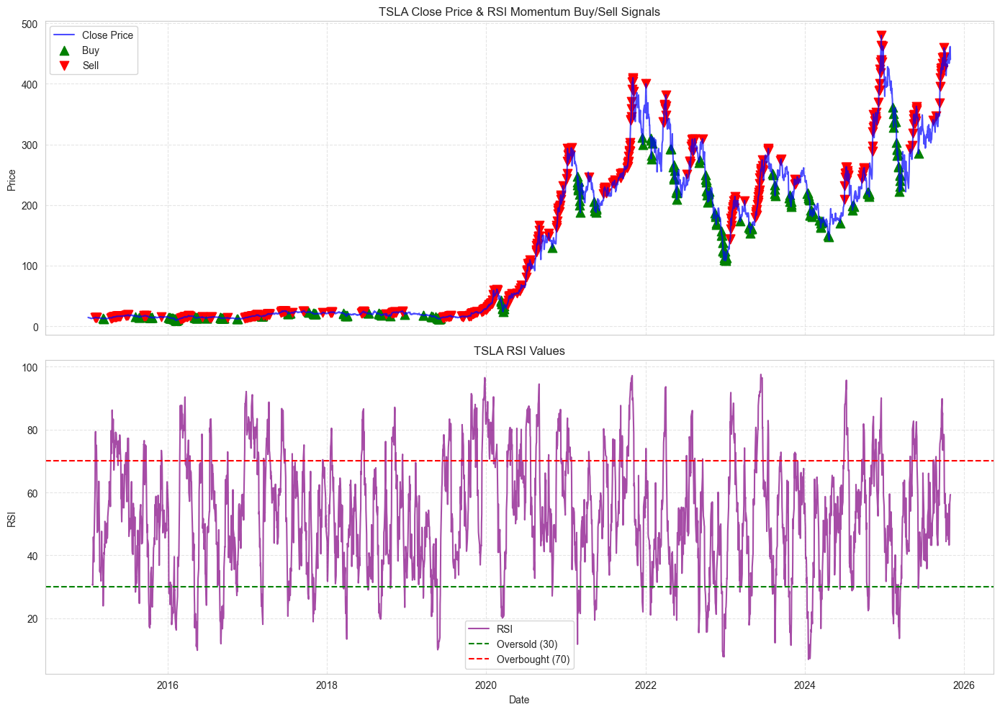

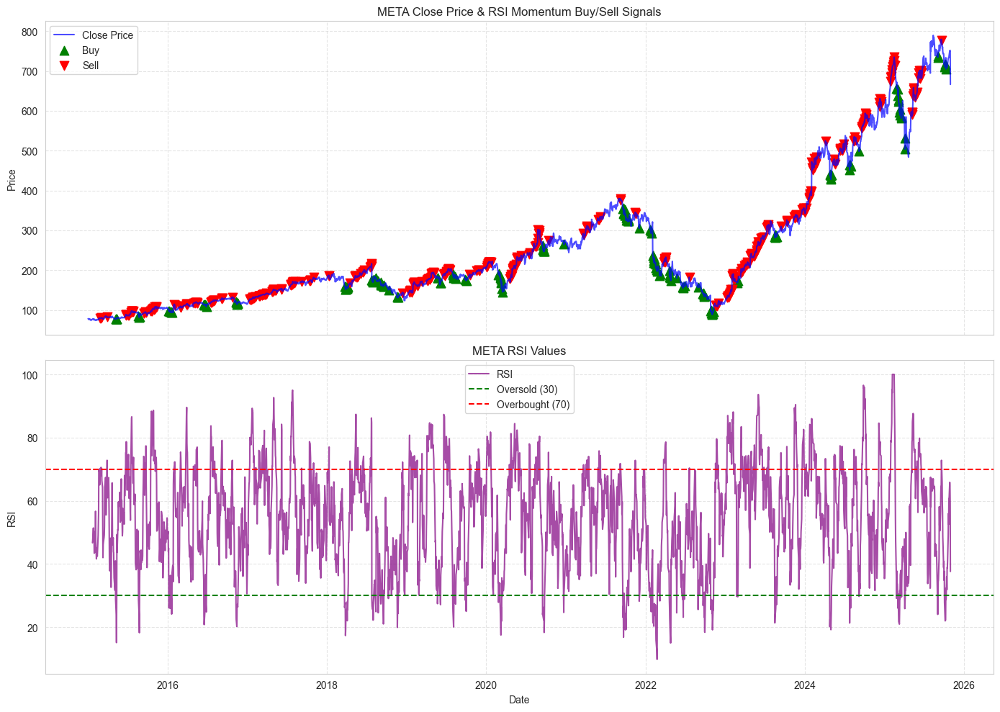

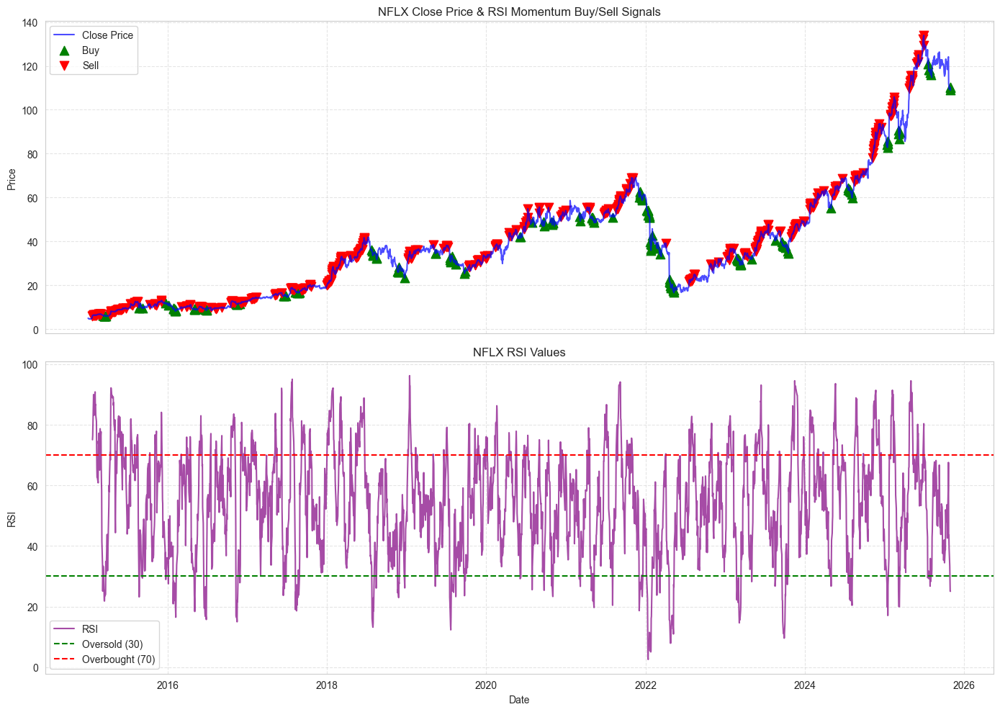

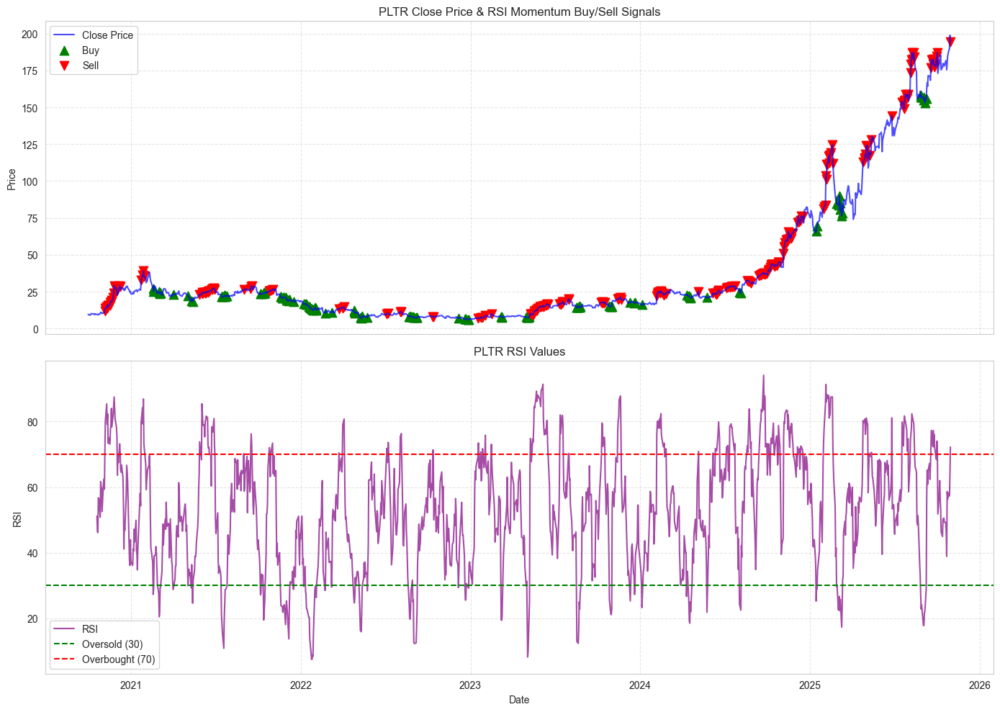

In [364]:
for ticker in rel_dict:
    stock_rel_plot = rel_dict[ticker].copy()
    buy_signals = stock_rel_plot[stock_rel_plot['Position'] == 1]
    sell_signals = stock_rel_plot[stock_rel_plot['Position'] == -1]

    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    sns.set_style("whitegrid")

    # Top subplot: Close price + buy/sell signals
    axs[0].plot(stock_rel_plot.index, stock_rel_plot['Close'], label='Close Price', color='blue', alpha=0.7)
    axs[0].scatter(buy_signals.index, buy_signals['Close'], marker='^', color='green', label='Buy', s=80)
    axs[0].scatter(sell_signals.index, sell_signals['Close'], marker='v', color='red', label='Sell', s=80)
    axs[0].set_ylabel("Price")
    axs[0].set_title(f"{ticker} Close Price & RSI Momentum Buy/Sell Signals")
    axs[0].legend()
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Bottom subplot: RSI values only
    axs[1].plot(stock_rel_plot.index, stock_rel_plot['RSI'], label='RSI', color='purple', alpha=0.7)
    axs[1].axhline(30, color='green', linestyle='--', label='Oversold (30)')
    axs[1].axhline(70, color='red', linestyle='--', label='Overbought (70)')
    axs[1].set_ylabel("RSI")
    axs[1].set_xlabel("Date")
    axs[1].set_title(f"{ticker} RSI Values")
    axs[1].legend()
    axs[1].grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

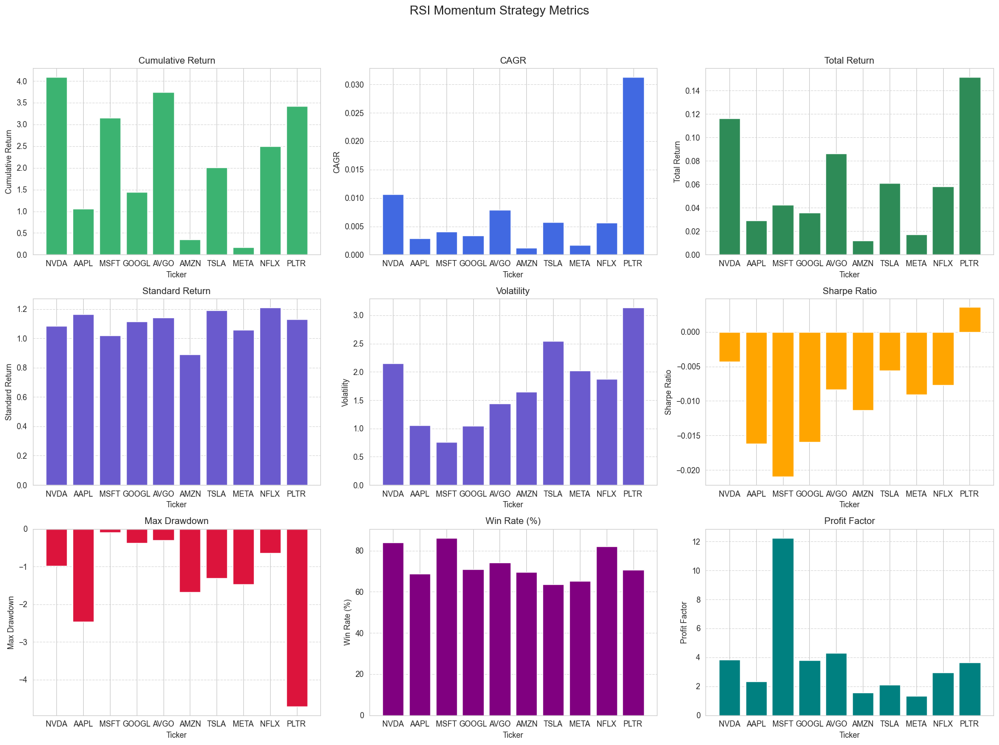

In [365]:
# overall metrics plot
fig, axs = plt.subplots(3, 3, figsize=(18, 14))
fig.suptitle('RSI Momentum Strategy Metrics', fontsize=16)

# Cumulative Return by Ticker
axs[0, 0].bar(rel_metrics_df['Ticker'], rel_metrics_df['Cumulative Return'], color='mediumseagreen')
axs[0, 0].set_title('Cumulative Return')
axs[0, 0].set_xlabel('Ticker')
axs[0, 0].set_ylabel('Cumulative Return')
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

# CAGR by Ticker
axs[0, 1].bar(rel_metrics_df['Ticker'], rel_metrics_df['CAGR'], color='royalblue')
axs[0, 1].set_title('CAGR')
axs[0, 1].set_xlabel('Ticker')
axs[0, 1].set_ylabel('CAGR')
axs[0, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Total Return by Ticker
axs[0, 2].bar(rel_metrics_df['Ticker'], rel_metrics_df['Total Return'], color='seagreen')
axs[0, 2].set_title('Total Return')
axs[0, 2].set_xlabel('Ticker')
axs[0, 2].set_ylabel('Total Return')
axs[0, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Standard Return by Ticker
axs[1, 0].bar(rel_metrics_df['Ticker'], rel_metrics_df['Standard Return'], color='slateblue')
axs[1, 0].set_title('Standard Return')
axs[1, 0].set_xlabel('Ticker')
axs[1, 0].set_ylabel('Standard Return')
axs[1, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Volatility by Ticker
axs[1, 1].bar(rel_metrics_df['Ticker'], rel_metrics_df['Volatility'], color='slateblue')
axs[1, 1].set_title('Volatility')
axs[1, 1].set_xlabel('Ticker')
axs[1, 1].set_ylabel('Volatility')
axs[1, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Sharpe Ratio by Ticker
axs[1, 2].bar(rel_metrics_df['Ticker'], rel_metrics_df['Sharpe Ratio'], color='orange')
axs[1, 2].set_title('Sharpe Ratio')
axs[1, 2].set_xlabel('Ticker')
axs[1, 2].set_ylabel('Sharpe Ratio')
axs[1, 2].grid(axis='y', linestyle='--', alpha=0.7)

# Max Drawdown by Ticker
axs[2, 0].bar(rel_metrics_df['Ticker'], rel_metrics_df['Max Drawdown'], color='crimson')
axs[2, 0].set_title('Max Drawdown')
axs[2, 0].set_xlabel('Ticker')
axs[2, 0].set_ylabel('Max Drawdown')
axs[2, 0].grid(axis='y', linestyle='--', alpha=0.7)

# Win Rate (%) by Ticker
axs[2, 1].bar(rel_metrics_df['Ticker'], rel_metrics_df['Win Rate (%)'], color='purple')
axs[2, 1].set_title('Win Rate (%)')
axs[2, 1].set_xlabel('Ticker')
axs[2, 1].set_ylabel('Win Rate (%)')
axs[2, 1].grid(axis='y', linestyle='--', alpha=0.7)

# Profit Factor by Ticker
axs[2, 2].bar(rel_metrics_df['Ticker'], rel_metrics_df['Profit Factor'], color='teal')
axs[2, 2].set_title('Profit Factor')
axs[2, 2].set_xlabel('Ticker')
axs[2, 2].set_ylabel('Profit Factor')
axs[2, 2].grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



In [366]:
# Summary Table: RSI Momentum Strategy vs. Mutual Fund ---


# 1. RSI Strategy (average across tickers)
rel_summary = pd.DataFrame({
    'Strategy': ['RSI Strategy (Avg)'],
    'CAGR': [rel_metrics_df['CAGR'].mean()],
    'Total Return': [rel_metrics_df['Total Return'].mean()],
    'Volatility': [rel_metrics_df['Volatility'].mean()],
    'Max Drawdown': [rel_metrics_df['Max Drawdown'].mean()],
    'Sharpe Ratio': [rel_metrics_df['Sharpe Ratio'].mean()],
    'Win Rate (%)': [rel_metrics_df['Win Rate (%)'].mean()],
    'Profit Factor': [rel_metrics_df['Profit Factor'].mean()]
})
display(rel_summary)


,Strategy,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
0,RSI Strategy (Avg),0.007438,0.061151,1.76999,-1.404655,-0.009584,73.513384,3.818126


In [367]:
# 3. Combine and display
rel_summary_table = pd.concat([rel_summary, fund_summary], ignore_index=True)
rel_summary_table.set_index('Strategy', inplace=True)
display(rel_summary_table)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
RSI Strategy (Avg),0.007438,0.061151,1.769990,-1.404655,-0.009584,73.513384,3.818126
Mutual Fund,0.177542,2.587504,0.242668,-1.683635,0.649210,54.582485,1.156475


In [368]:
#combine strategy metrics for comparison
momentum_startegies_summary = pd.concat([ftw_summary, roc_summary, rel_summary], ignore_index=True)
momentum_startegies_summary.set_index('Strategy', inplace=True)
display(momentum_startegies_summary)

,CAGR,Total Return,Volatility,Max Drawdown,Sharpe Ratio,Win Rate (%),Profit Factor
Strategy,,,,,,,
FTW Strategy (Avg),0.125779,1.271276,23.303138,-0.145506,0.003465,87.037037,58.489913
ROC Strategy (Avg),0.000983,0.007914,1.072733,-2.462698,-0.021579,41.025144,1.543469
RSI Strategy (Avg),0.007438,0.061151,1.769990,-1.404655,-0.009584,73.513384,3.818126


### Hydrid MultiIndicator